In [2]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import os
import sys
import dask as dd
from dask import dataframe
sys.path.insert(0, "C:/workspace/stress_test_sim//libs")

from monte_carlo import CauchyGenerator, PoissonGenerator, NormalGenerator, ParetoGenerator, LognormalGenerator, Transaction, MonteCarloTransactionSimulator, CauchyParameterSearcher, LognormalParameterSearcher
from uniswap_v2_extractor import get_pool_v2_reserves_history, get_pool_v2_history, list_to_transaction_dictionary, list_to_reserves_dictionary, pool_reserves_to_df, pool_history_to_df, get_pool_v2_mints, get_pool_v2_burns, list_to_mints_dictionary, pool_mints_to_df, pool_burns_to_df
from dima_trubca_v2_plots import show_swaps_count_moving_averages, show_swaps_reserves_evolution_through_time, show_pool_price_evolution_from_reserves, show_swaps_amount_in_moving_averages

from gql import gql, Client
from gql.transport.requests import RequestsHTTPTransport

In [3]:
def calc_price_and_increase_rates(df: pd.DataFrame):
    """Append prices conform reserves changes and find price increase rates

    Args:
        df (pd.DataFrame): reserves dataframe
    """
    #   setting current price for each reserves update
    first_price_sequence = df.reserve0 / df.reserve1
    second_price_sequence = df.reserve1 / df.reserve0
    df['first_price'] = first_price_sequence
    df['second_price'] = second_price_sequence

    first_price_sequence = first_price_sequence.shift(periods=-1)
    second_price_sequence = second_price_sequence.shift(periods=-1)

    df['first_price_increase_rate'] = ((df.first_price - first_price_sequence) / first_price_sequence) * 100
    df['second_price_increase_rate'] = ((df.second_price - second_price_sequence) / second_price_sequence) * 100

In [4]:
def increase_rate_moving_averages(df: pd.DataFrame, first_plot_name: str, second_plot_name: str, x_size: int=10, y_size: int=5, wspace: int=0.1, hspace: int=0.1):
    """plot information about increasing rates

    Args:
        df (pd.DataFrame): reserves dataframe
        first_plot_name (str): name of first plot
        second_plot_name (str): name of second plot
        x_size (int, optional): x-size of window. Defaults to 10.
        y_size (int, optional): y-size of window. Defaults to 5.
        wspace (int, optional): space between plots. Defaults to 0.1.
        hspace (int, optional): height space between plots. Defaults to 0.1.
    """
    # copy dataframe and get date as index
    transactions_time = df.copy()
    transactions_time.index = transactions_time.date
    
    # resample data and find rolling average per week
    transactions_time = transactions_time.resample('7D').mean()
    transactions_avg_time = transactions_time.rolling('14D').mean()
    
    fig = plt.subplots(figsize=(x_size, y_size))
    
    plt.subplot(1, 2, 1)
    sns.lineplot(data=transactions_time, x='date', y='first_price_increase_rate', color='green', label='7 days mean')
    plt.subplot(1, 2, 1)
    sns.lineplot(data=transactions_avg_time, x='date', y='first_price_increase_rate', color='red', label='14 days rolling mean').set_title(first_plot_name)
    
    plt.subplot(1, 2, 2)
    sns.lineplot(data=transactions_time, x='date', y='second_price_increase_rate', color='green', label='7 days mean')
    plt.subplot(1, 2, 2)
    sns.lineplot(data=transactions_avg_time, x='date', y='second_price_increase_rate', color='red', label='14 days rolling mean').set_title(second_plot_name)
    
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    plt.show()

In [5]:
def swaps_price_increase_rates_moving_averages(df: pd.DataFrame, first_token: str, second_token: str, first_plot_name: str, second_plot_name: str, 
                                               x_size: int=10, y_size: int=5, wspace: int=0.1, hspace: int=0.1):
    """swaps price inrease rates moving averages plot using seaborn

    Args:
        df (pd.DataFrame): swaps dataframe with swaps prices and swaps prices increase rates
        first_token (str): name of the first token
        second_token (str): name of the second token
        first_plot_name (str): name of the first subplot
        second_plot_name (str): name of the second subplot
        x_size (int, optional): plot width. Defaults to 10.
        y_size (int, optional): plot height. Defaults to 5.
        wspace (int, optional): width space between subplots. Defaults to 0.1.
        hspace (int, optional): height space between subplots. Defaults to 0.1.
    """
    first_transactions_time = df[df.token_in == first_token]
    second_transactions_time = df[df.token_in == second_token]
    first_transactions_time.index = first_transactions_time.timestamp
    second_transactions_time.index = second_transactions_time.timestamp
    
    first_transactions_time = first_transactions_time.resample('1D').mean()
    first_transactions_avg_time = first_transactions_time.rolling('7D').mean()
    second_transactions_time = second_transactions_time.resample('1D').mean()
    second_transactions_avg_time = second_transactions_time.rolling('7D').mean()
    
    fig = plt.subplots(figsize=(x_size, y_size))
    
    plt.subplot(1, 2, 1)
    sns.lineplot(data=first_transactions_time, x='timestamp', y='price_change_rate', color='green', 
                 label='1 day mean')
    plt.subplot(1, 2, 1)
    sns.lineplot(data=first_transactions_avg_time, x='timestamp', y='price_change_rate', 
                 color='red', label='7 days rolling mean').set_title(first_plot_name)
    
    plt.subplot(1, 2, 2)
    sns.lineplot(data=second_transactions_time, x='timestamp', y='price_change_rate', color='green', 
                 label='1 day mean')
    plt.subplot(1, 2, 2)
    sns.lineplot(data=second_transactions_avg_time, x='timestamp', y='price_change_rate', 
                 color='red', label='7 days rolling mean').set_title(second_plot_name)
    
    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    plt.show()

In [6]:
def pyplot_line_swap_change_rate(df: pd.DataFrame, first_token: str, second_token: str, xsize: int=20, ysize=10, wspace: float=0.1, hspace: float=0.1):
    """plot using pyplot distribution of swap prices change rates

    Args:
        df (pd.DataFrame): swaps dataframe with found swaps prices and swaps prices change rates
        first_token (str): name of the first token
        second_token (str): name of the second token
        xsize (int, optional): width of plot. Defaults to 20.
        ysize (int, optional): height of plot. Defaults to 10.
        wspace (float, optional): width space between subplots. Defaults to 0.1.
        hspace (float, optional): height space between subplots. Defaults to 0.1.
    """
    fig, ax = plt.subplots(figsize=(xsize, ysize))

    ax1 = plt.subplot(1, 2, 1)
    ax1.plot_date(df[(df.token_in == first_token)].timestamp, 
                df[(df.token_in == first_token)].price_change_rate, 
                linestyle='solid', marker=None, label='Ethereum price change rates')
    ax1.set_xlabel("Time")
    ax1.set_ylabel("Change rate in percents")
    ax1.set_title("Change rate for " + first_token + " price")

    ax2 = plt.subplot(1, 2, 2)
    ax2.plot_date(df[(df.token_in == second_token)].timestamp, 
                df[(df.token_in == second_token)].price_change_rate, 
                linestyle='solid', marker=None, color='red', label='USDC price change rates')
    ax2.set_xlabel("Time")
    ax2.set_ylabel("Change rate in percents")
    ax2.set_title("Change rate for " + second_token + " price")

    fig.autofmt_xdate()
    fig.subplots_adjust(wspace=wspace, hspace=hspace) 

    plt.show()

In [7]:
def pyplot_line_swap_prices(df: pd.DataFrame, first_token: str, second_token: str, xsize: int=20, ysize=10, wspace: float=0.1, hspace: float=0.1):
    """plot using pyplot distribution of swap prices change rates

    Args:
        df (pd.DataFrame): swaps dataframe with found swaps prices and swaps prices change rates
        first_token (str): name of the first token
        second_token (str): name of the second token
        xsize (int, optional): width of plot. Defaults to 20.
        ysize (int, optional): height of plot. Defaults to 10.
        wspace (float, optional): width space between subplots. Defaults to 0.1.
        hspace (float, optional): height space between subplots. Defaults to 0.1.
    """
    fig, ax = plt.subplots(figsize=(xsize, ysize))

    ax1 = plt.subplot(1, 2, 1)
    ax1.plot_date(df[(df.token_in == first_token)].timestamp, 
                df[(df.token_in == first_token)].first_to_second_price, 
                linestyle='solid', marker=None, label='Ethereum price change rates')
    ax1.set_xlabel("Time")
    ax1.set_ylabel("Change rate in percents")
    ax1.set_title("Change rate for " + first_token + " price")

    ax2 = plt.subplot(1, 2, 2)
    ax2.plot_date(df[(df.token_in == second_token)].timestamp, 
                df[(df.token_in == second_token)].first_to_second_price, 
                linestyle='solid', marker=None, color='red', label='USDC price change rates')
    ax2.set_xlabel("Time")
    ax2.set_ylabel("Change rate in percents")
    ax2.set_title("Change rate for " + second_token + " price")

    fig.autofmt_xdate()
    fig.subplots_adjust(wspace=wspace, hspace=hspace) 

    plt.show()

In [79]:
def get_df_with_swap_prices_and_change_rates(df: pd.DataFrame, first_token: str, second_token:str) -> pd.DataFrame:
    """form swaps price and form swaps price change rate for each token independently

    Args:
        df (pd.DataFrame): swaps dataframe
        first_token (str): name of the first token
        second_token (str): name of the second token

    Returns:
        pd.DataFrame: dataframe with formed swaps price and swaps price changes
    """
    df['first_to_second_price'] = df.amount_out / df.amount_in
    df['price_change_rate'] = np.ones(len(df))

    first_token_price_story = df[df.token_in == first_token].first_to_second_price
    second_token_price_story = df[df.token_in == second_token].first_to_second_price
    first_token_price_story = first_token_price_story.shift(periods=1)
    second_token_price_story = second_token_price_story.shift(periods=1)

    first_token_df = df[df.token_in == first_token]
    second_token_df = df[df.token_in == second_token]

    first_token_df.price_change_rate = ((first_token_df.first_to_second_price - first_token_price_story) / 
                                        first_token_price_story) * 100
    second_token_df.price_change_rate = ((second_token_df.first_to_second_price - second_token_price_story) / 
                                        second_token_price_story) * 100

    df = pd.concat([first_token_df, second_token_df])
    df.sort_index(inplace=True)
    
    return df

In [9]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})

# Reading data from pickle files

## WBTC/USDC

In [80]:
wbtc_usdc_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\wbtc_usdc_swaps.pkl')
wbtc_usdc_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_usdc_mints.pkl")
wbtc_usdc_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_usdc_burns.pkl")
wbtc_usdc_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_usdc_reserves.pkl")

### Plot swapping in moving averages

In [81]:
wbtc_usdc_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp
0,USDC,WBTC,1.534170e-01,0.000016,0.152773,2020-05-19 23:44:23
1,WBTC,USDC,2.501000e-04,2.367365,2.331250,2020-05-21 14:39:56
2,WBTC,USDC,1.047330e-03,9.603013,9.597534,2020-05-22 20:47:02
3,USDC,WBTC,8.923190e-01,0.000098,0.889846,2020-05-23 14:00:42
4,WBTC,USDC,1.100000e-07,0.001000,0.000989,2020-05-24 17:37:32
...,...,...,...,...,...,...
67641,USDC,WBTC,4.033455e+03,0.059772,4032.191782,2021-11-10 13:55:45
67642,USDC,WBTC,4.062171e+03,0.059772,4062.419264,2021-11-10 13:57:02
67643,WBTC,USDC,4.481900e-04,30.384136,30.383452,2021-11-10 14:10:02
67644,USDC,WBTC,1.500000e+03,0.021965,1500.204784,2021-11-10 14:25:11


In [82]:
wbtc_usdc_df = get_df_with_swap_prices_and_change_rates(wbtc_usdc_df, first_token='WBTC', second_token='USDC')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


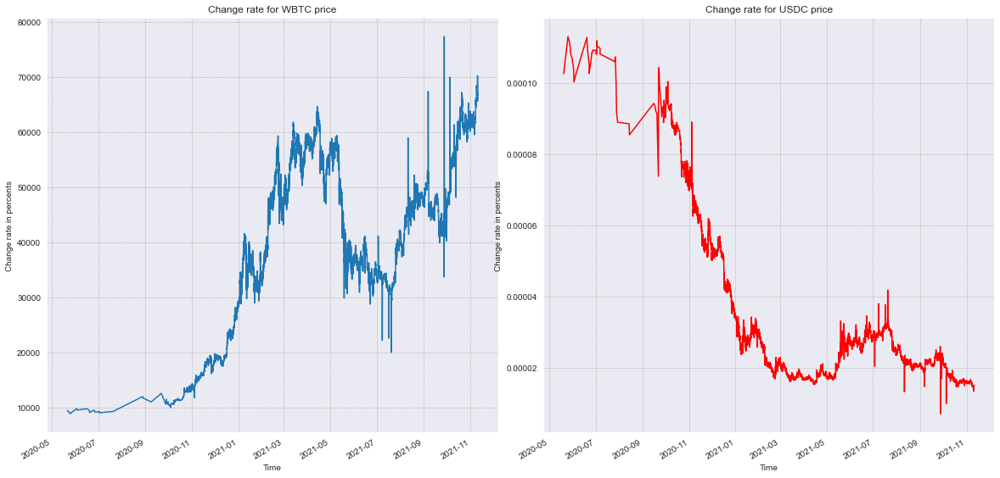

In [71]:
pyplot_line_swap_prices(wbtc_usdc_df, first_token='WBTC', second_token='USDC', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

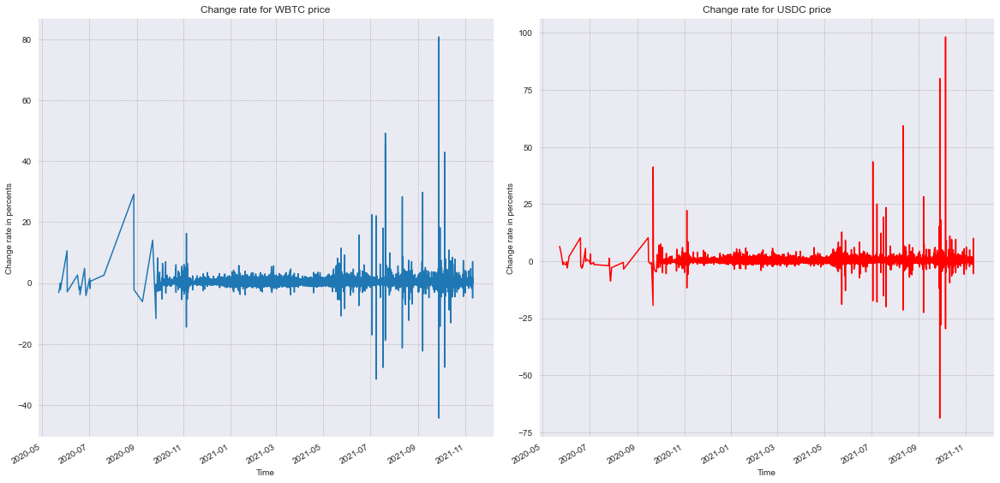

In [72]:
pyplot_line_swap_change_rate(wbtc_usdc_df, first_token='WBTC', second_token='USDC', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

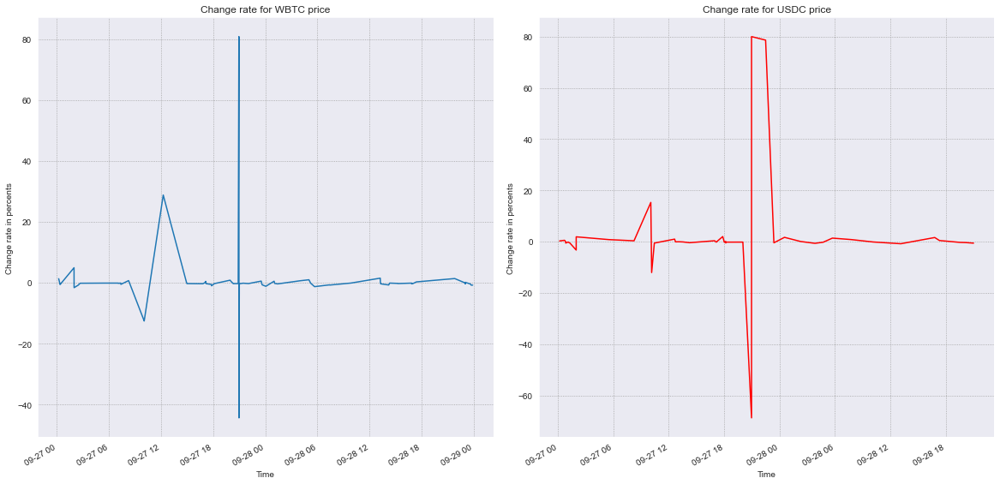

In [73]:
pyplot_line_swap_change_rate(wbtc_usdc_df[(wbtc_usdc_df.timestamp > datetime(2021, 9, 27)) & (wbtc_usdc_df.timestamp < datetime(2021, 9, 29))], 
                             first_token='WBTC', second_token='USDC', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

In [75]:
wbtc_usdc_df[(wbtc_usdc_df.price_change_rate < -40) | (wbtc_usdc_df.price_change_rate > 60)]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
65610,WBTC,USDC,12.689636,981830.211723,981098.160132,2021-09-27 20:58:07,77372.604033,80.812972
65611,WBTC,USDC,0.061308,2641.148760,2641.231852,2021-09-27 20:58:58,43080.318166,-44.320966
65608,USDC,WBTC,12797.000000,0.092386,12787.458570,2021-09-27 20:58:07,0.000007,-68.754858
65609,USDC,WBTC,976323.861321,12.689636,975595.915259,2021-09-27 20:58:07,0.000013,80.034360
65615,USDC,WBTC,2841.861339,0.065991,2842.008042,2021-09-27 22:29:30,0.000023,78.660438
66007,USDC,WBTC,6542.858397,0.130782,6539.810070,2021-10-05 09:01:27,0.000020,98.269215


In [76]:
wbtc_usdc_df[wbtc_usdc_df.timestamp == datetime(2021, 9, 27, 20, 58, 7)]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
65610,WBTC,USDC,12.689636,981830.211723,981098.160132,2021-09-27 20:58:07,77372.604033,80.812972
65608,USDC,WBTC,12797.000000,0.092386,12787.458570,2021-09-27 20:58:07,0.000007,-68.754858
65609,USDC,WBTC,976323.861321,12.689636,975595.915259,2021-09-27 20:58:07,0.000013,80.034360


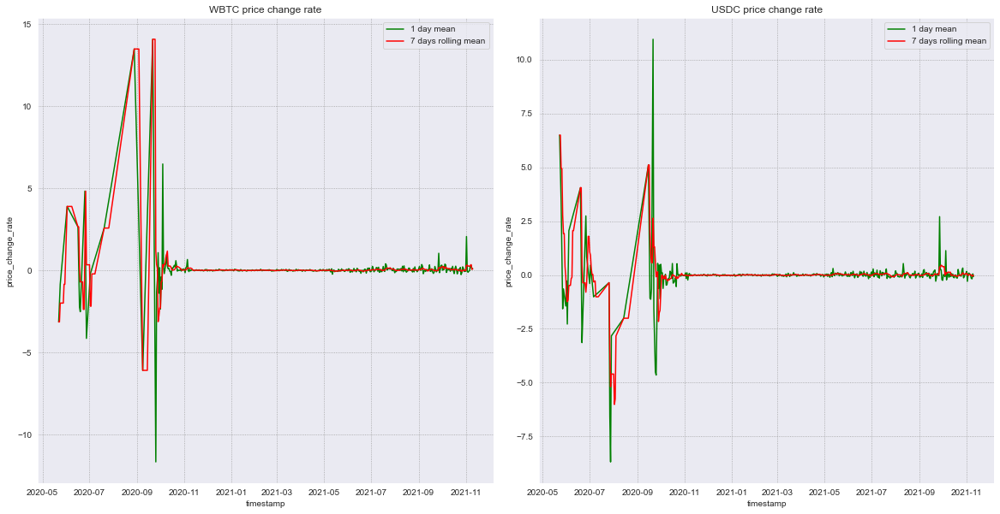

In [83]:
swaps_price_increase_rates_moving_averages(wbtc_usdc_df, first_token='WBTC', second_token='USDC', 
                                           first_plot_name='WBTC price change rate', second_plot_name='USDC price change rate', 
                                           x_size=20, y_size=10)

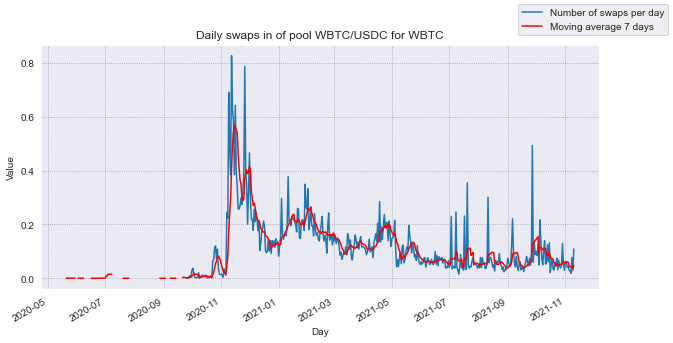

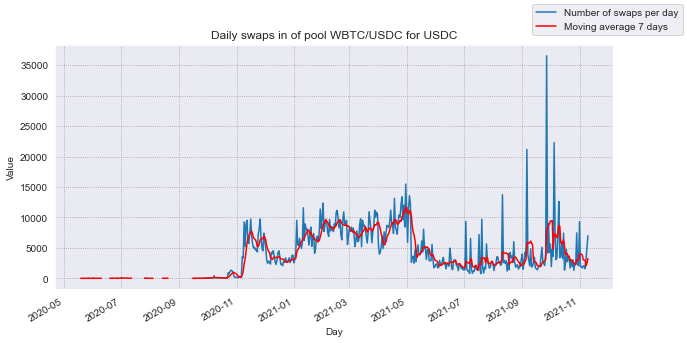

In [85]:
show_swaps_amount_in_moving_averages(swaps_df=wbtc_usdc_df[(wbtc_usdc_df.token_in == 'WBTC')], 
                                     pool_name="WBTC/USDC for WBTC")
show_swaps_amount_in_moving_averages(swaps_df=wbtc_usdc_df[(wbtc_usdc_df.token_in == 'USDC')], 
                                     pool_name="WBTC/USDC for USDC")

### Swaps values histograms

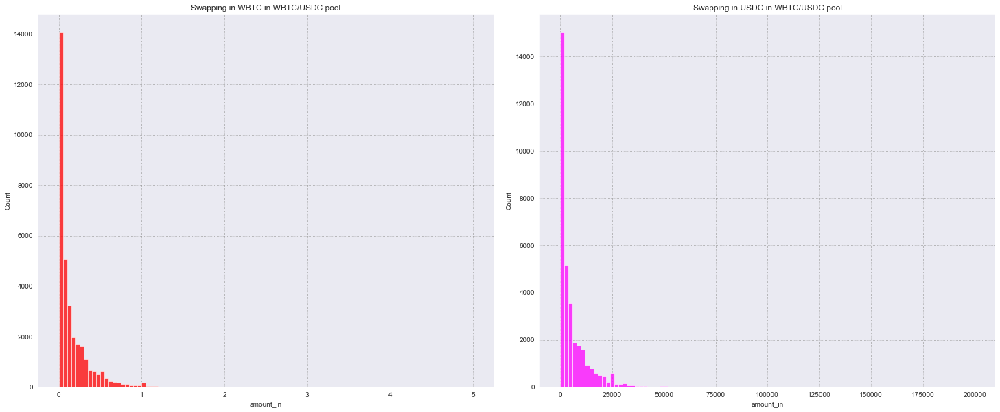

In [86]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=wbtc_usdc_df[wbtc_usdc_df.token_in == 'WBTC'], x='amount_in', bins=100, 
             color='red', binrange=[0, 5]).set_title("Swapping in WBTC in WBTC/USDC pool")
plt.subplot(1, 2, 2)
sns.histplot(data=wbtc_usdc_df[wbtc_usdc_df.token_in == 'USDC'], x='amount_in', bins=100, 
             color='magenta', binrange=[0, 200000]).set_title("Swapping in USDC in WBTC/USDC pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

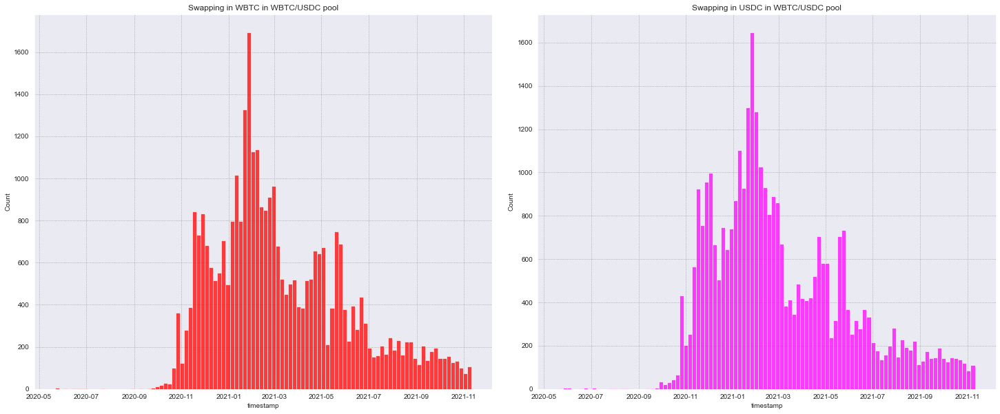

In [16]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=wbtc_usdc_df[wbtc_usdc_df.token_in == 'WBTC'], x='timestamp', bins=100, 
             color='red').set_title("Swapping in WBTC in WBTC/USDC pool")
plt.subplot(1, 2, 2)
sns.histplot(data=wbtc_usdc_df[wbtc_usdc_df.token_in == 'USDC'], x='timestamp', bins=100, 
             color='magenta').set_title("Swapping in USDC in WBTC/USDC pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

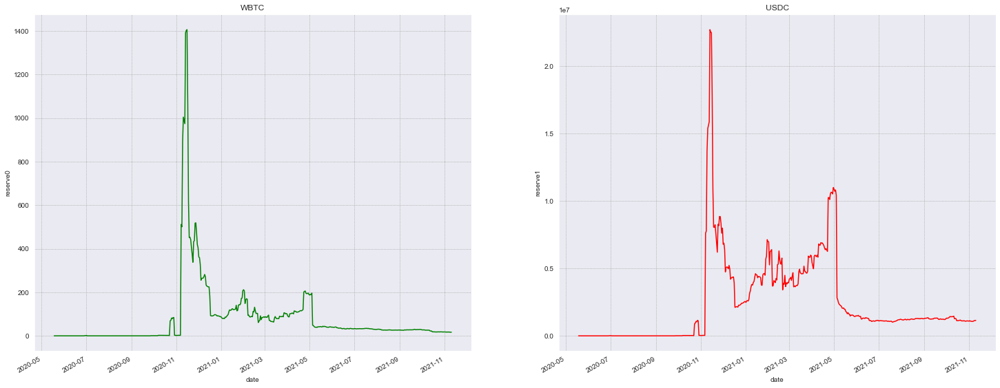

In [41]:
show_swaps_reserves_evolution_through_time(wbtc_usdc_reserves_df, first_token_reserve_name="WBTC", 
                                           second_token_reserve_name="USDC", x=25, y=10)

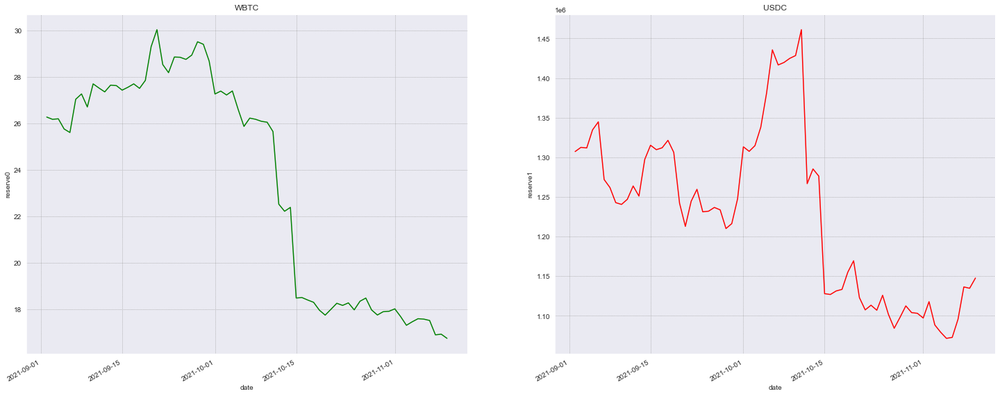

In [18]:
show_swaps_reserves_evolution_through_time(wbtc_usdc_reserves_df[wbtc_usdc_reserves_df.date > datetime(2021, 9, 1)], first_token_reserve_name="WBTC", 
                                           second_token_reserve_name="USDC", x=25, y=10)

### Plotting price distribution in pool

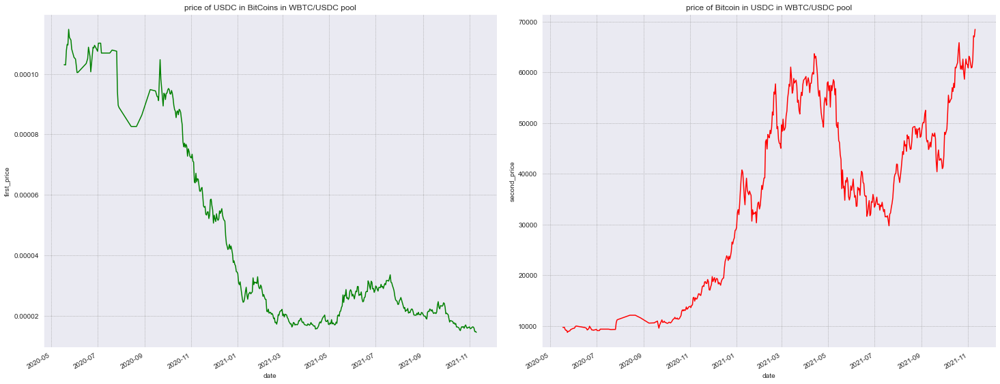

In [88]:
show_pool_price_evolution_from_reserves(wbtc_usdc_reserves_df, first_token_price_name="price of USDC in BitCoins in WBTC/USDC pool", 
                                        second_token_price_name="price of Bitcoin in USDC in WBTC/USDC pool", x=25, y=10, wspace=0.1)

### Plot price increase rates distribution and their mean distribution

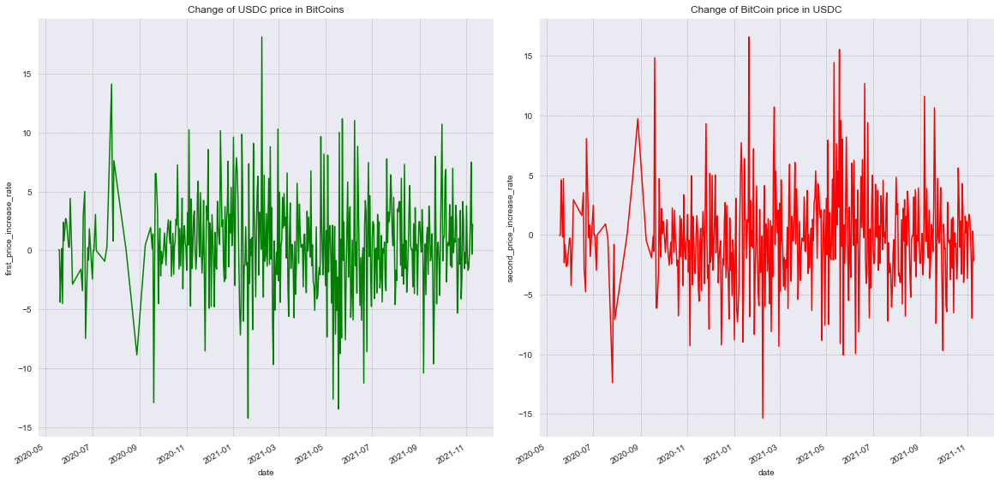

In [19]:
calc_price_and_increase_rates(wbtc_usdc_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=wbtc_usdc_reserves_df, x='date', y='first_price_increase_rate', color='green'
             ).set_title('Change of USDC price in BitCoins')
plt.subplot(1, 2, 2)
sns.lineplot(data=wbtc_usdc_reserves_df, x='date', y='second_price_increase_rate', color='red'
             ).set_title('Change of BitCoin price in USDC')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

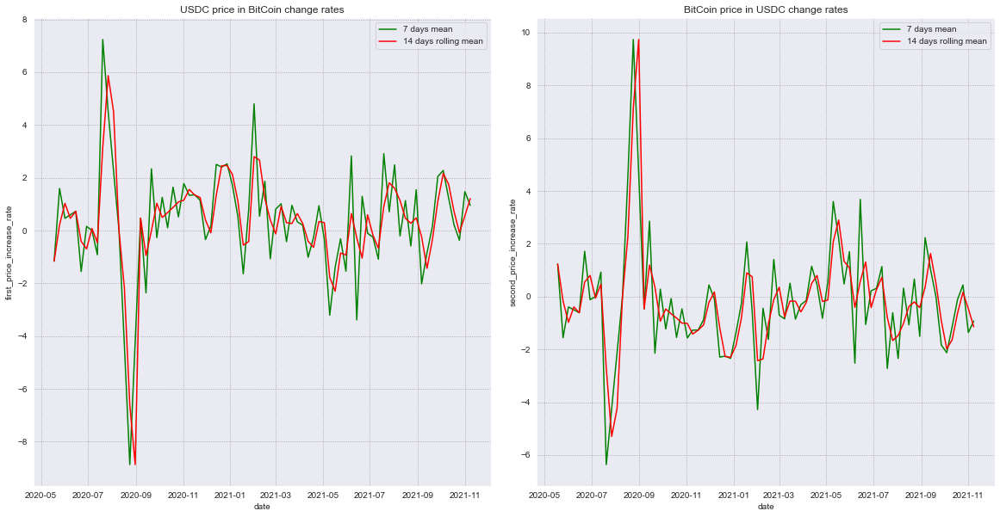

In [90]:
increase_rate_moving_averages(wbtc_usdc_reserves_df, 'USDC price in BitCoin change rates', 'BitCoin price in USDC change rates', x_size=20, y_size=10)

## ETH/USDC

In [31]:
weth_usdc_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\weth_usdc_swaps.pkl')
weth_usdc_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\weth_usdc_mints.pkl")
weth_usdc_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\weth_usdc_burns.pkl")
weth_usdc_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\weth_usdc_reserves.pkl")

## Plotting swapping in moving averages

In [32]:
weth_usdc_df = get_df_with_swap_prices_and_change_rates(weth_usdc_df, first_token='WETH', second_token='USDC')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


First version of plotting the data, using ```seaborn``` module

In [33]:
weth_usdc_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
0,WETH,USDC,0.000005,0.001000,0.000501,2020-05-05 21:09:32,205.176618,NaN
1,WETH,USDC,0.000049,0.010000,0.004965,2020-05-05 21:12:35,202.919065,-1.100298
2,WETH,USDC,0.000005,0.001000,0.000501,2020-05-06 16:24:55,200.678676,-1.104080
3,USDC,WETH,0.000689,0.000003,0.000344,2020-05-06 18:51:12,0.004953,NaN
4,WETH,USDC,0.001000,0.204870,0.099533,2020-05-11 13:08:48,204.870000,2.088575
...,...,...,...,...,...,...,...,...
2927351,WETH,USDC,0.037131,174.189033,174.182644,2021-11-10 20:10:42,4691.174005,-0.009801
2927352,WETH,USDC,3.726008,17477.382548,17477.558741,2021-11-10 20:10:50,4690.645410,-0.011268
2927353,WETH,USDC,13.039472,61132.828312,61144.171757,2021-11-10 20:12:12,4688.290027,-0.050214
2927354,WETH,USDC,9.604902,45000.000000,45019.768623,2021-11-10 20:12:22,4685.107854,-0.067875


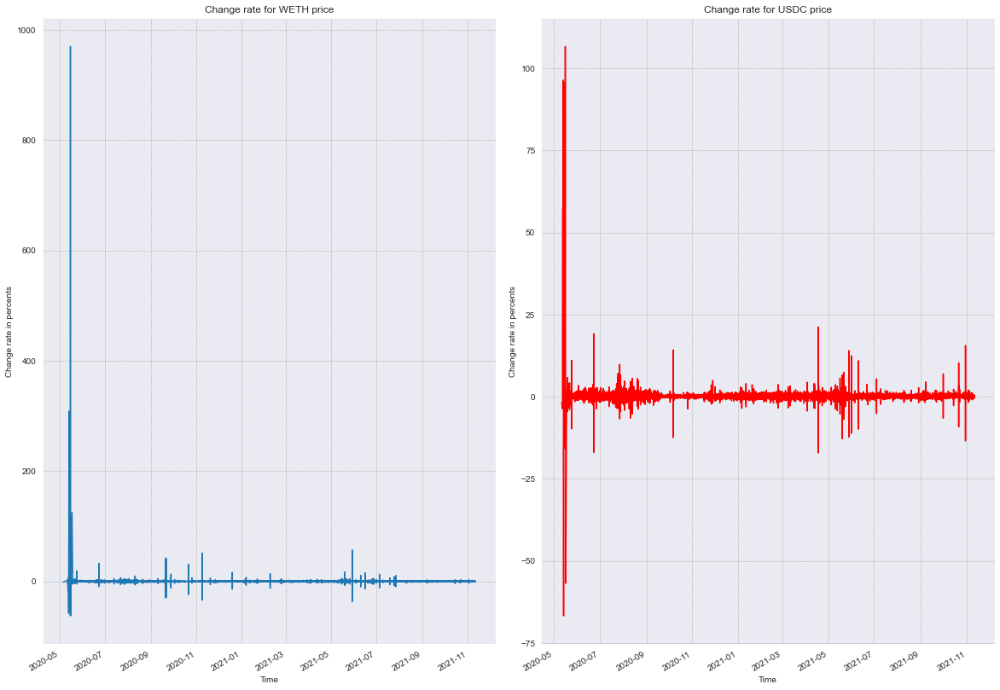

In [48]:
pyplot_line_swap_change_rate(df=weth_usdc_df[(weth_usdc_df.price_change_rate < 1000) & (weth_usdc_df.price_change_rate > -90)], first_token='WETH', second_token='USDC', xsize=20, ysize=15, wspace=0.1, hspace=0.1)

In [105]:
# weth_usdc_df[(weth_usdc_df.price_change_rate <= -100) | (weth_usdc_df.price_change_rate > 100)]
weth_usdc_df[(weth_usdc_df.timestamp > datetime(2021, 8, 12, 3, 16)) & 
             (weth_usdc_df.timestamp < datetime(2021, 8, 12, 3, 39))].head(10)

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
2614151,WETH,USDC,4.611514,14869.611444,14878.586986,2021-08-12 03:16:08,3224.453173,-0.008276
2614152,USDC,WETH,1989.672914,0.613412,1984.972399,2021-08-12 03:16:16,0.000308,0.015614
2614153,WETH,USDC,0.033000,106.399318,106.473219,2021-08-12 03:16:38,3224.221758,-0.007177
2614154,WETH,USDC,0.200000,644.857938,645.292366,2021-08-12 03:17:45,3224.289690,0.002107
2614155,USDC,WETH,2000.000000,0.616581,1995.368519,2021-08-12 03:17:45,0.000308,-0.002450
2614156,USDC,WETH,54.906921,0.016927,54.779183,2021-08-12 03:17:45,0.000308,-0.000496
2614157,USDC,WETH,10000.000000,3.082689,9976.372517,2021-08-12 03:17:46,0.000308,-0.006512
2614158,WETH,USDC,0.306000,986.032813,987.085857,2021-08-12 03:18:56,3222.329454,-0.060796
2614159,WETH,USDC,17.352819,55937.245863,55986.439846,2021-08-12 03:18:56,3223.524979,0.037101
2614160,WETH,USDC,0.215488,694.366414,695.083233,2021-08-12 03:19:19,3222.294204,-0.038181


In [23]:
weth_usdc_df[weth_usdc_df.price_change_rate > 100000000]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
502079,USDC,WETH,25403.957731,67.384601,25303.903172,2020-10-14 21:15:29,0.002653,inf
502238,USDC,WETH,1000.000000,2.646011,995.416847,2020-10-14 21:59:03,0.002646,inf
502241,USDC,WETH,14.000000,0.037044,13.936044,2020-10-14 22:00:08,0.002646,inf
502419,USDC,WETH,5072.010956,13.418694,5048.776898,2020-10-14 22:47:29,0.002646,inf
512451,WETH,USDC,0.273044,100.000000,99.649901,2020-10-16 23:10:34,366.241594,inf
...,...,...,...,...,...,...,...,...
2464194,WETH,USDC,0.020000,38.738358,38.818548,2021-07-13 21:59:43,1936.917900,inf
2464244,WETH,USDC,0.375316,726.387710,728.089589,2021-07-13 22:07:28,1935.400929,inf
2490888,USDC,WETH,21815.031696,11.826628,21779.368322,2021-07-19 12:33:28,0.000542,inf
2600374,WETH,USDC,0.300000,915.134082,916.028055,2021-08-08 22:18:46,3050.446940,3.047395e+08


In [28]:
0.000000/0.002646 * 100

0.0

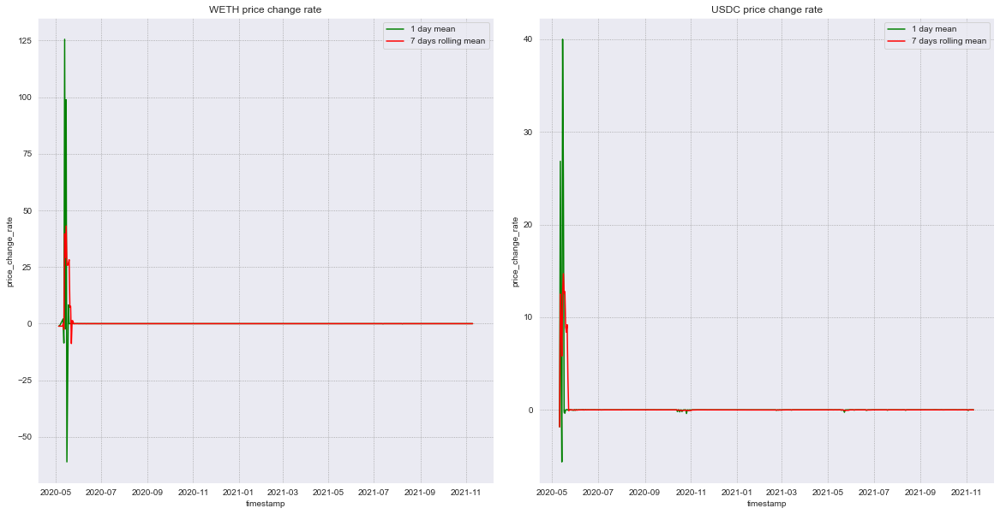

In [106]:
swaps_price_increase_rates_moving_averages(weth_usdc_df[weth_usdc_df.price_change_rate < 1000], first_token='WETH', second_token='USDC', 
                                           first_plot_name='WETH price change rate', second_plot_name='USDC price change rate', 
                                           x_size=20, y_size=10)

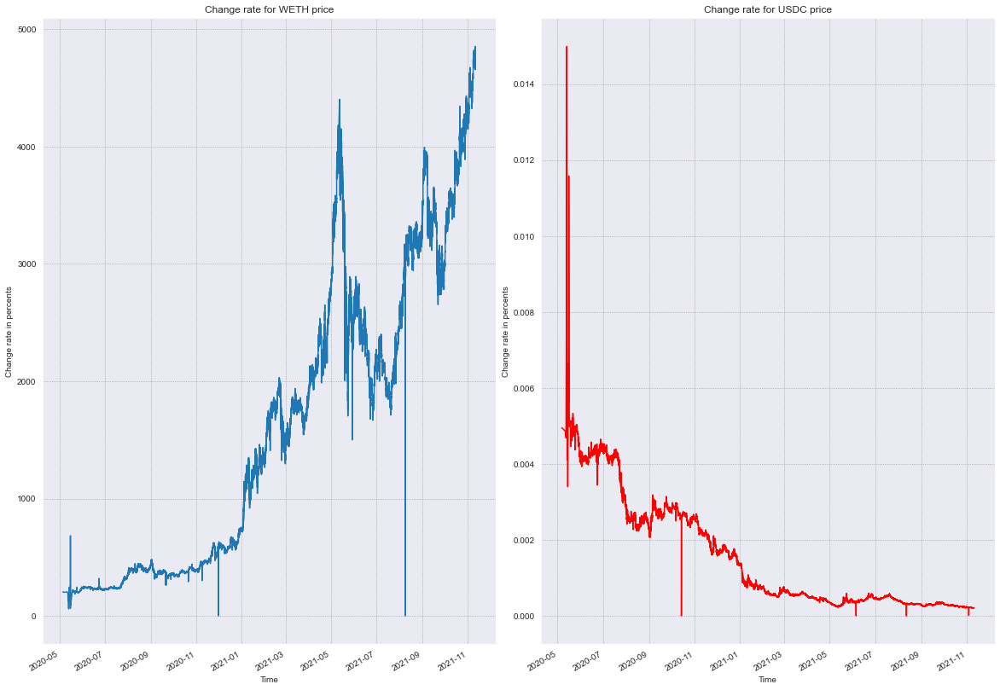

In [35]:
pyplot_line_swap_prices(df=weth_usdc_df[weth_usdc_df.first_to_second_price != 0], first_token='WETH', second_token='USDC', xsize=20, ysize=15, wspace=0.1, hspace=0.1)

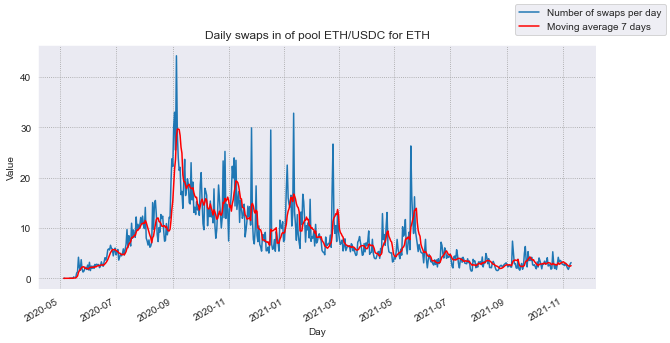

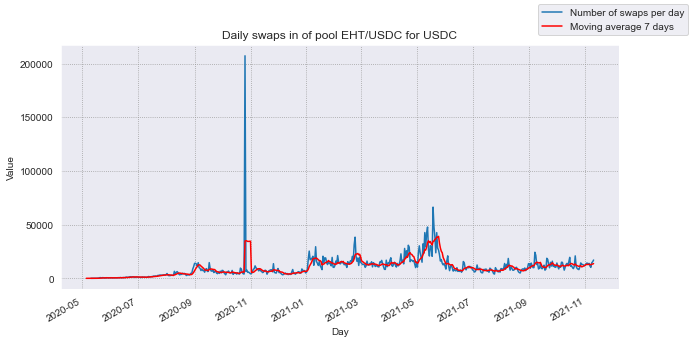

In [107]:
show_swaps_amount_in_moving_averages(swaps_df=weth_usdc_df[(weth_usdc_df.token_in == 'WETH')], pool_name="ETH/USDC for ETH")
show_swaps_amount_in_moving_averages(swaps_df=weth_usdc_df[(weth_usdc_df.token_in == 'USDC')], pool_name="EHT/USDC for USDC")

### Swaps value histograms

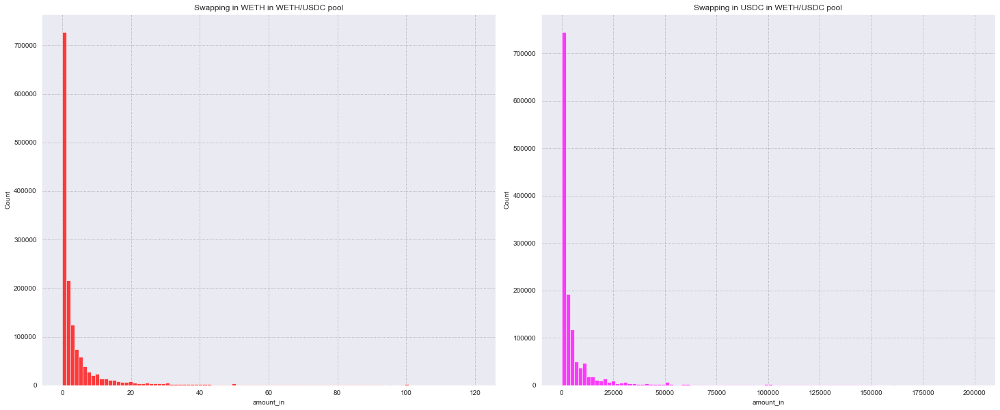

In [108]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=weth_usdc_df[weth_usdc_df.token_in == 'WETH'], x='amount_in', bins=100, color='red', binrange=[0, 120]).set_title("Swapping in WETH in WETH/USDC pool")
plt.subplot(1, 2, 2)
sns.histplot(data=weth_usdc_df[weth_usdc_df.token_in == 'USDC'], x='amount_in', bins=100, color='magenta', binrange=[0, 200000]).set_title("Swapping in USDC in WETH/USDC pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

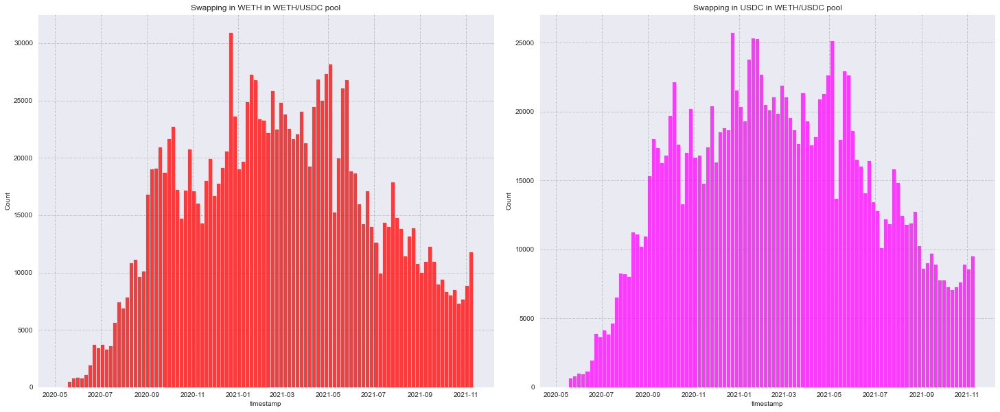

In [39]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=weth_usdc_df[weth_usdc_df.token_in == 'WETH'], x='timestamp', bins=100, color='red').set_title("Swapping in WETH in WETH/USDC pool")
plt.subplot(1, 2, 2)
sns.histplot(data=weth_usdc_df[weth_usdc_df.token_in == 'USDC'], x='timestamp', bins=100, color='magenta').set_title("Swapping in USDC in WETH/USDC pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

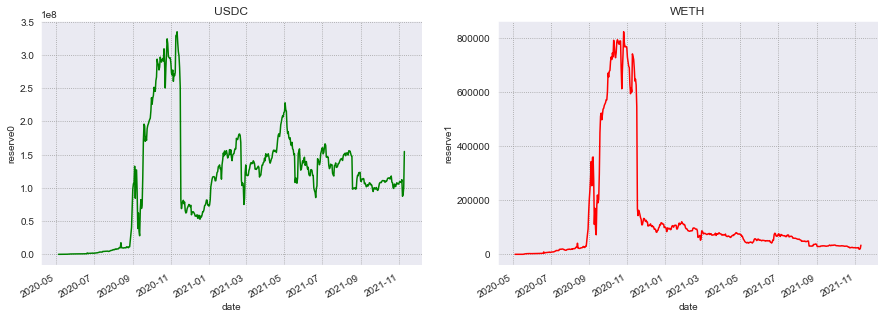

In [109]:
show_swaps_reserves_evolution_through_time(weth_usdc_reserves_df, first_token_reserve_name="USDC", second_token_reserve_name="WETH", x=15)

### Plottting price distribution for pool

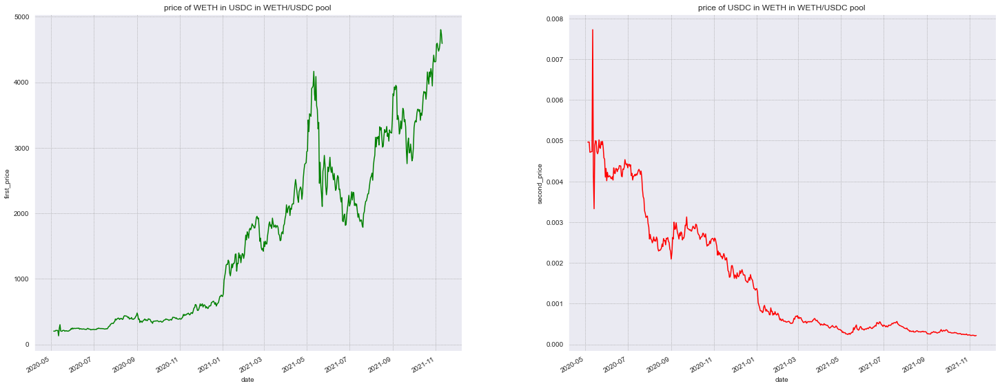

In [110]:
show_pool_price_evolution_from_reserves(weth_usdc_reserves_df, first_token_price_name="price of WETH in USDC in WETH/USDC pool", 
                                        second_token_price_name="price of USDC in WETH in WETH/USDC pool", x=25, y=10)

### Plotting price change rates and their mean distributions

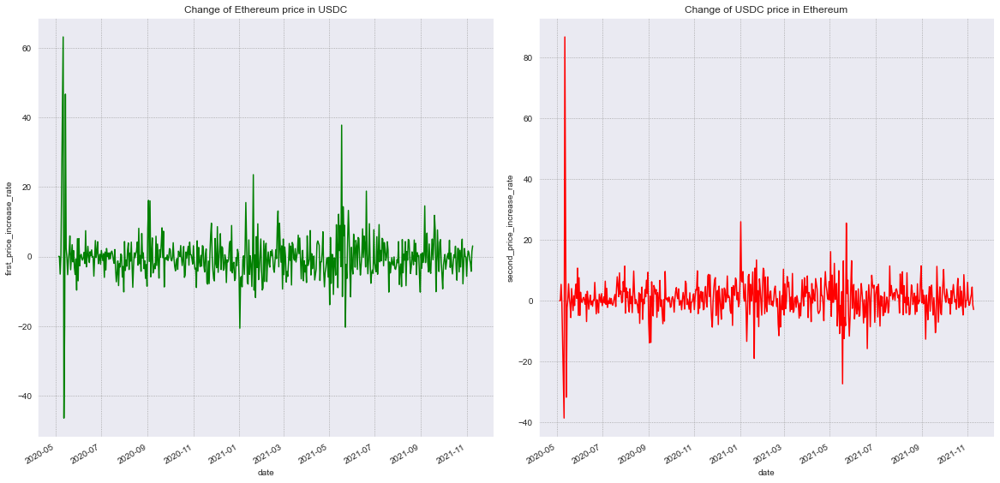

In [111]:
calc_price_and_increase_rates(weth_usdc_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=weth_usdc_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in USDC')
plt.subplot(1, 2, 2)
sns.lineplot(data=weth_usdc_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of USDC price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

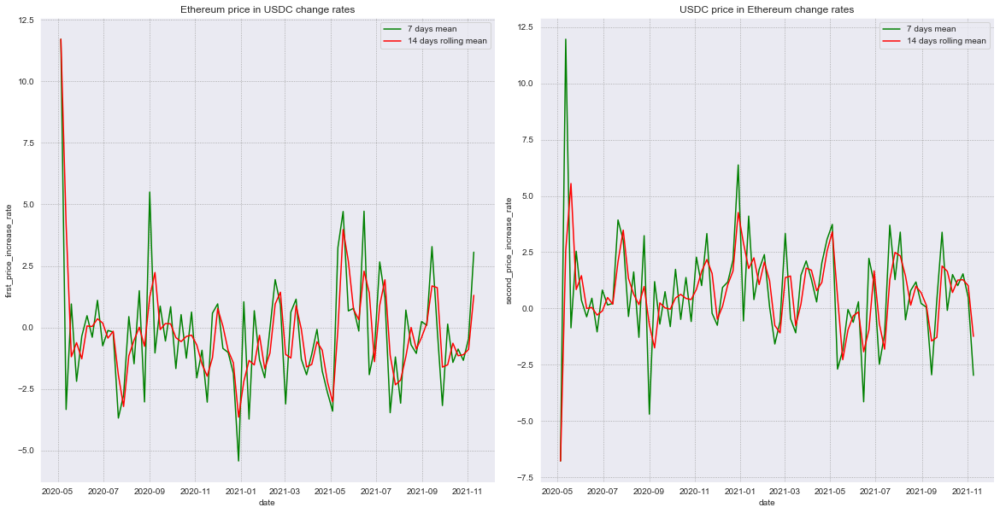

In [112]:
increase_rate_moving_averages(weth_usdc_reserves_df, 'Ethereum price in USDC change rates', 'USDC price in Ethereum change rates', x_size=20, y_size=10)

## WBTC/DAI (fixed pickle)

In [86]:
wbtc_dai_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\wbtc_dai_swaps.pkl')
wbtc_dai_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_dai_mints.pkl")
wbtc_dai_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_dai_burns.pkl")
wbtc_dai_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\wbtc_dai_reserves.pkl")

In [89]:
wbtc_dai_df.loc[4200:4240]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
4200,DAI,WBTC,0.403913,0.000012,0.405726,2021-02-01 20:52:15,0.000030,1.581966
4201,DAI,WBTC,17.383211,0.000515,17.430428,2021-02-01 21:18:48,0.000030,-0.456819
4202,DAI,WBTC,51.968815,0.001514,51.982058,2021-02-02 08:53:35,0.000029,-1.757533
4203,DAI,WBTC,5.611220,0.000161,5.647344,2021-02-02 09:33:11,0.000029,-1.459443
4204,DAI,WBTC,2.144614,0.000061,2.141867,2021-02-02 13:35:44,0.000029,-0.200589
4205,DAI,WBTC,37.835308,0.001073,37.895029,2021-02-02 16:48:38,0.000028,-0.997358
4206,WBTC,DAI,0.000215,7.598125,7.537107,2021-02-02 17:50:56,35320.400352,4.737884
4207,WBTC,DAI,0.000042,1.488874,1.480510,2021-02-02 18:24:36,35239.616680,-0.228717
4208,DAI,WBTC,23.169225,0.000650,23.153448,2021-02-02 21:20:12,0.000028,-1.070986
4209,DAI,WBTC,12.259807,0.000341,12.287588,2021-02-03 03:14:03,0.000028,-0.872882


### Plotting swapping in moving averages

In [88]:
wbtc_dai_df = get_df_with_swap_prices_and_change_rates(df=wbtc_dai_df, first_token='WBTC', second_token='DAI')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


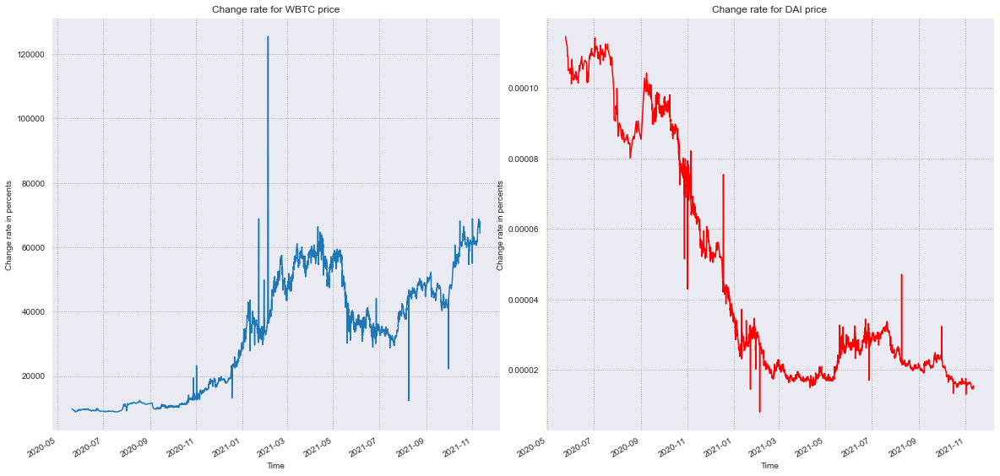

In [90]:
pyplot_line_swap_prices(wbtc_dai_df, first_token='WBTC', second_token='DAI', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

In [91]:
wbtc_dai_df.loc[4200:4240]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,first_to_second_price,price_change_rate
4200,DAI,WBTC,0.403913,0.000012,0.405726,2021-02-01 20:52:15,0.000030,1.581966
4201,DAI,WBTC,17.383211,0.000515,17.430428,2021-02-01 21:18:48,0.000030,-0.456819
4202,DAI,WBTC,51.968815,0.001514,51.982058,2021-02-02 08:53:35,0.000029,-1.757533
4203,DAI,WBTC,5.611220,0.000161,5.647344,2021-02-02 09:33:11,0.000029,-1.459443
4204,DAI,WBTC,2.144614,0.000061,2.141867,2021-02-02 13:35:44,0.000029,-0.200589
4205,DAI,WBTC,37.835308,0.001073,37.895029,2021-02-02 16:48:38,0.000028,-0.997358
4206,WBTC,DAI,0.000215,7.598125,7.537107,2021-02-02 17:50:56,35320.400352,4.737884
4207,WBTC,DAI,0.000042,1.488874,1.480510,2021-02-02 18:24:36,35239.616680,-0.228717
4208,DAI,WBTC,23.169225,0.000650,23.153448,2021-02-02 21:20:12,0.000028,-1.070986
4209,DAI,WBTC,12.259807,0.000341,12.287588,2021-02-03 03:14:03,0.000028,-0.872882


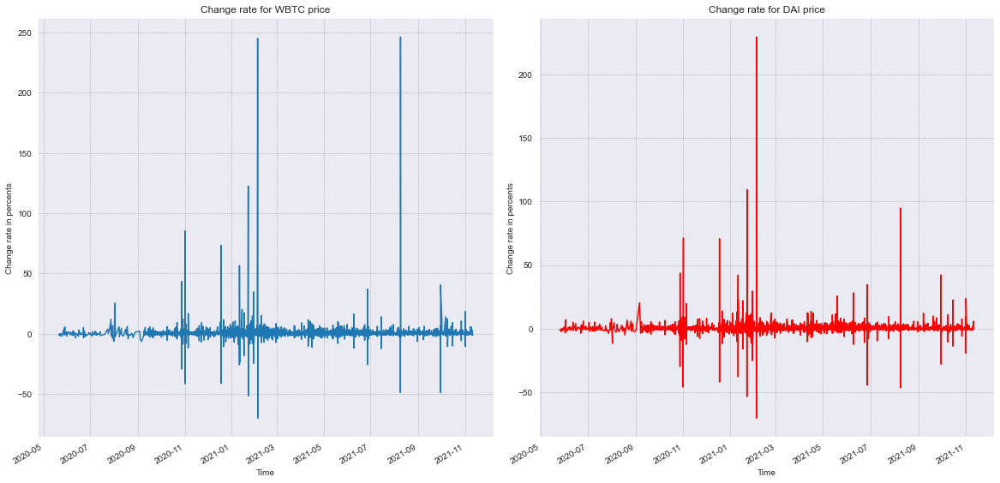

In [92]:
pyplot_line_swap_change_rate(wbtc_dai_df, first_token='WBTC', second_token='DAI', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

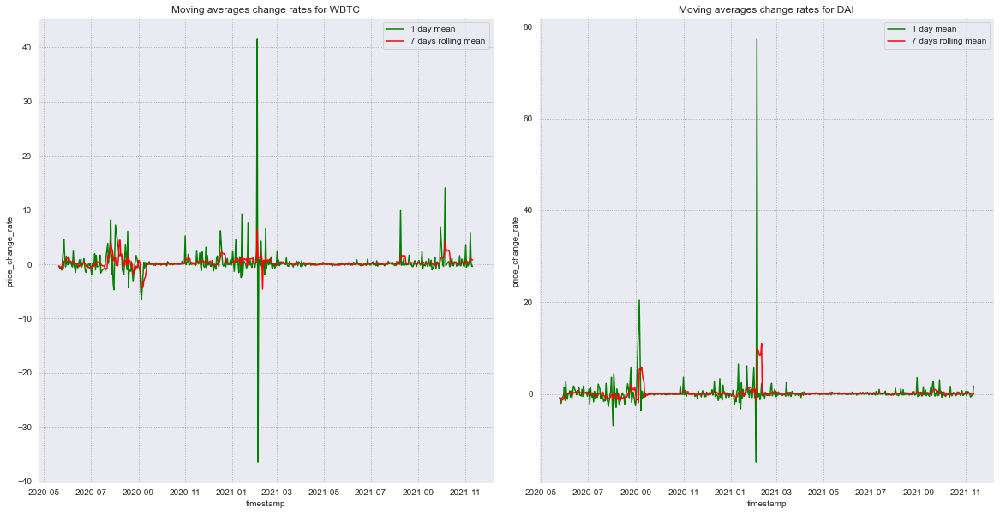

In [141]:
swaps_price_increase_rates_moving_averages(df=wbtc_dai_df, first_token='WBTC', second_token='DAI', first_plot_name='Moving averages change rates for WBTC', second_plot_name='Moving averages change rates for DAI',
                                           x_size=20, y_size=10, wspace=0.1, hspace=0.1)

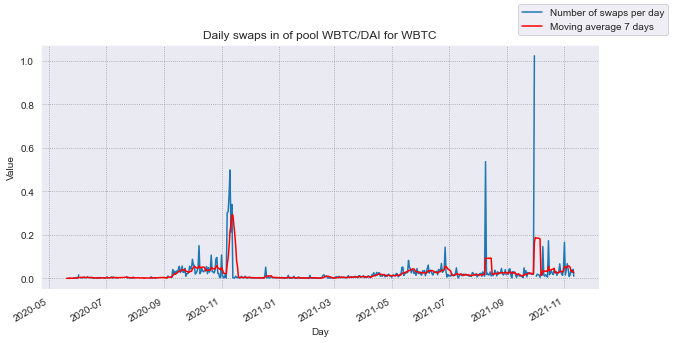

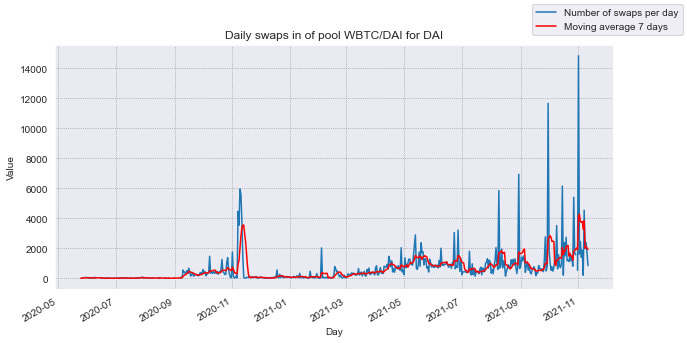

In [271]:
show_swaps_amount_in_moving_averages(swaps_df=wbtc_dai_df[(wbtc_dai_df.token_in == 'WBTC')], pool_name="WBTC/DAI for WBTC")
show_swaps_amount_in_moving_averages(swaps_df=wbtc_dai_df[(wbtc_dai_df.token_in == 'DAI')], pool_name="WBTC/DAI for DAI")

### Swaps values histograms

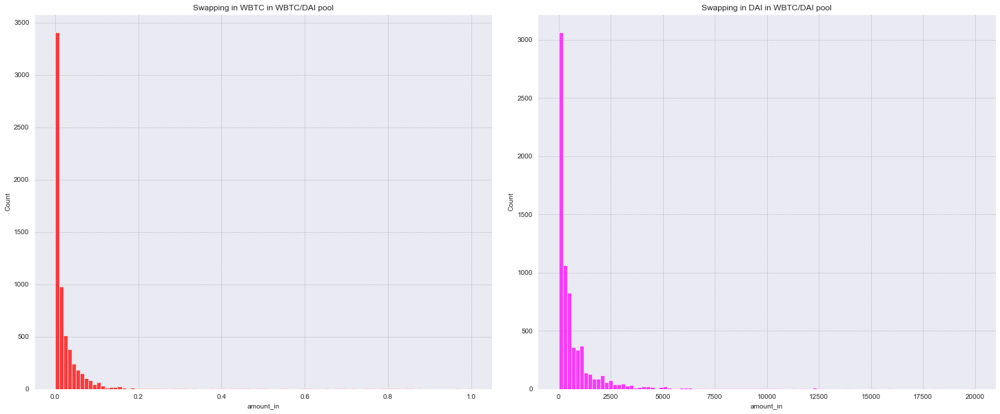

In [272]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=wbtc_dai_df[wbtc_dai_df.token_in == 'WBTC'], x='amount_in', bins=100, color='red', binrange=[0, 1]).set_title("Swapping in WBTC in WBTC/DAI pool")
plt.subplot(1, 2, 2)
sns.histplot(data=wbtc_dai_df[wbtc_dai_df.token_in == 'DAI'], x='amount_in', bins=100, color='magenta', binrange=[0, 20000]).set_title("Swapping in DAI in WBTC/DAI pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

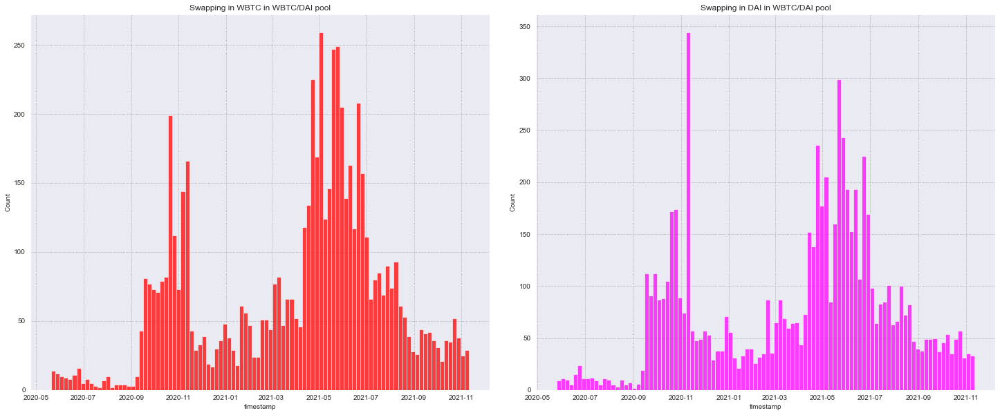

In [94]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=wbtc_dai_df[wbtc_dai_df.token_in == 'WBTC'], x='timestamp', bins=100, color='red').set_title("Swapping in WBTC in WBTC/DAI pool")
plt.subplot(1, 2, 2)
sns.histplot(data=wbtc_dai_df[wbtc_dai_df.token_in == 'DAI'], x='timestamp', bins=100, color='magenta').set_title("Swapping in DAI in WBTC/DAI pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

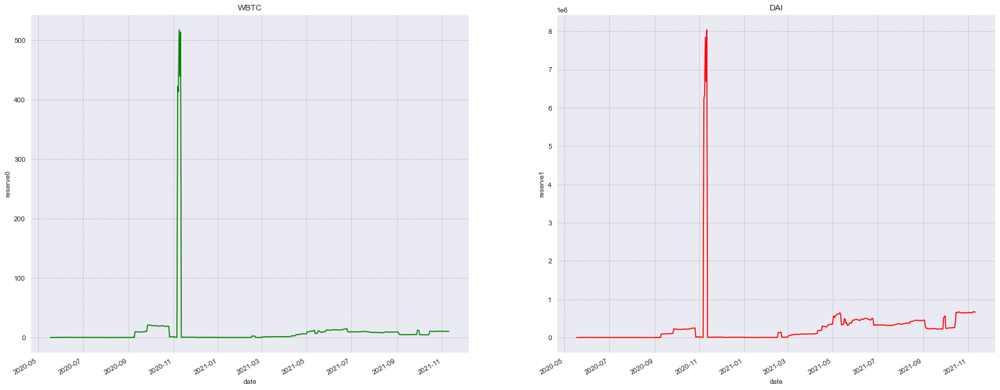

In [273]:
show_swaps_reserves_evolution_through_time(wbtc_dai_reserves_df, first_token_reserve_name="WBTC", second_token_reserve_name="DAI", x=25, y=10)

### Plotting price distribution in pool

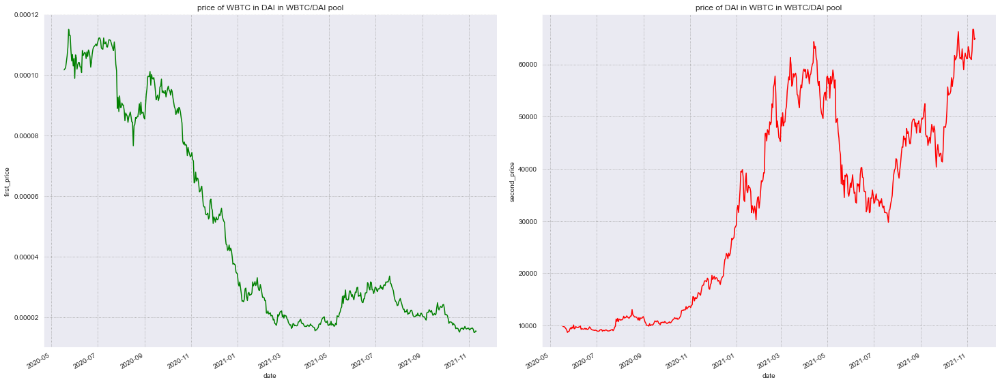

In [274]:
show_pool_price_evolution_from_reserves(wbtc_dai_reserves_df, first_token_price_name="price of WBTC in DAI in WBTC/DAI pool", 
                                        second_token_price_name="price of DAI in WBTC in WBTC/DAI pool", x=25, y=10, wspace=0.1)

### Plotting price changes rates and their mean distribution

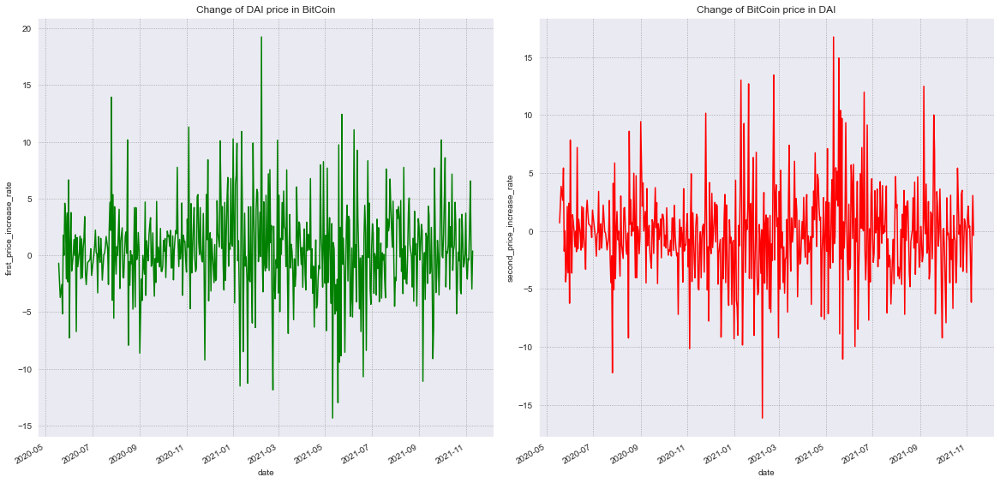

In [275]:
calc_price_and_increase_rates(wbtc_dai_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=wbtc_dai_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of DAI price in BitCoin')
plt.subplot(1, 2, 2)
sns.lineplot(data=wbtc_dai_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of BitCoin price in DAI')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

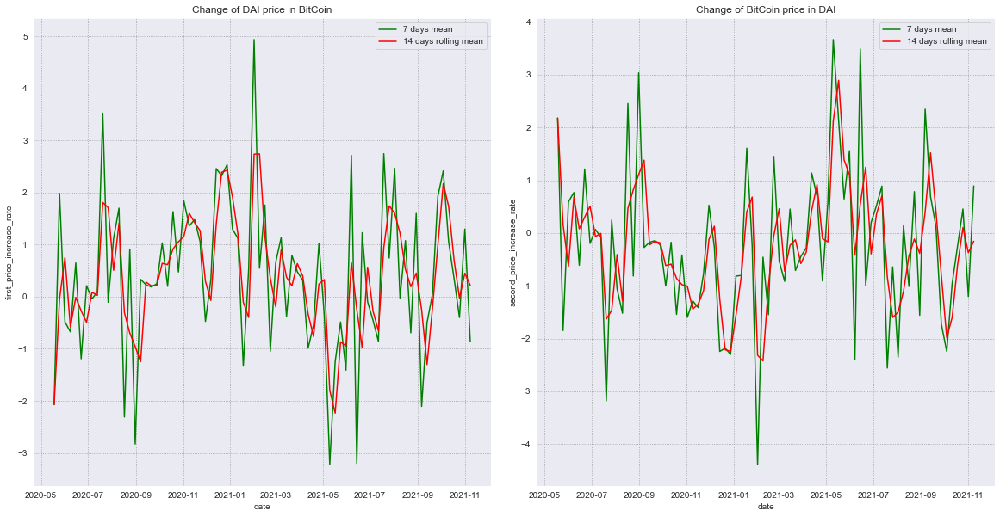

In [276]:
increase_rate_moving_averages(wbtc_dai_reserves_df, 'Change of DAI price in BitCoin', 'Change of BitCoin price in DAI', x_size=20, y_size=10)

## IXS/ETH

In [95]:
ixs_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\ixs_weth_swaps.pkl')
ixs_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\ixs_weth_mints.pkl")
ixs_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\ixs_weth_burns.pkl")
ixs_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\ixs_weth_reserves.pkl")

### Plotting swapping in moving averages

In [96]:
ixs_weth_df = get_df_with_swap_prices_and_change_rates(df=ixs_weth_df, first_token='IXS', second_token='WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


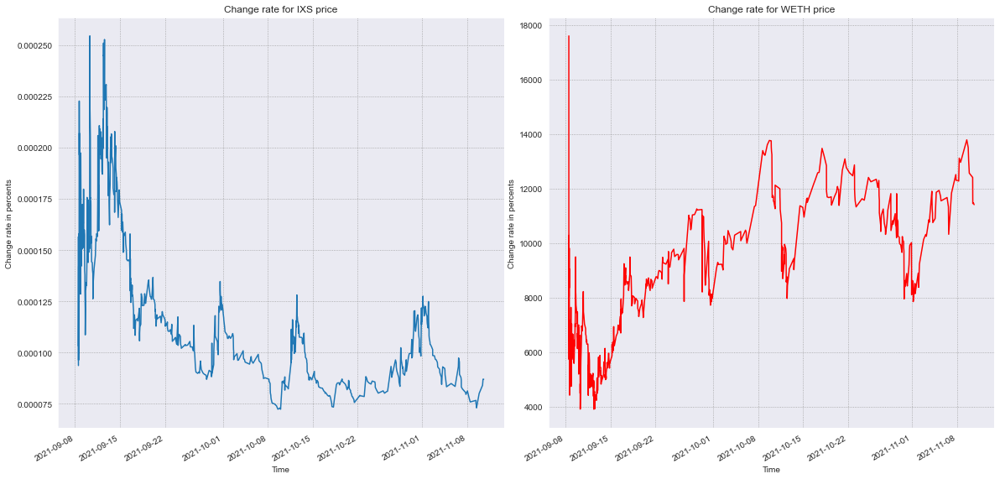

In [97]:
pyplot_line_swap_prices(df=ixs_weth_df, first_token='IXS', second_token='WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

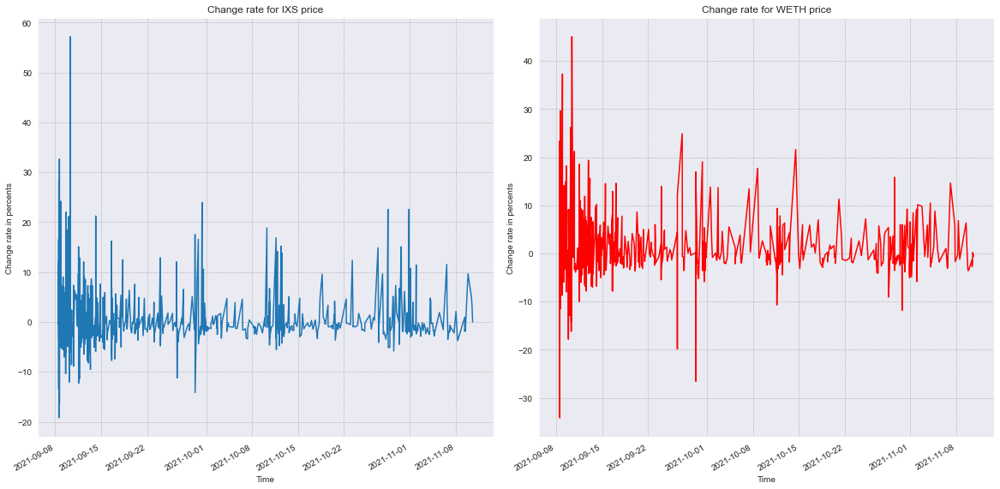

In [145]:
pyplot_line_swap_change_rate(df=ixs_weth_df, first_token='IXS', second_token='WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

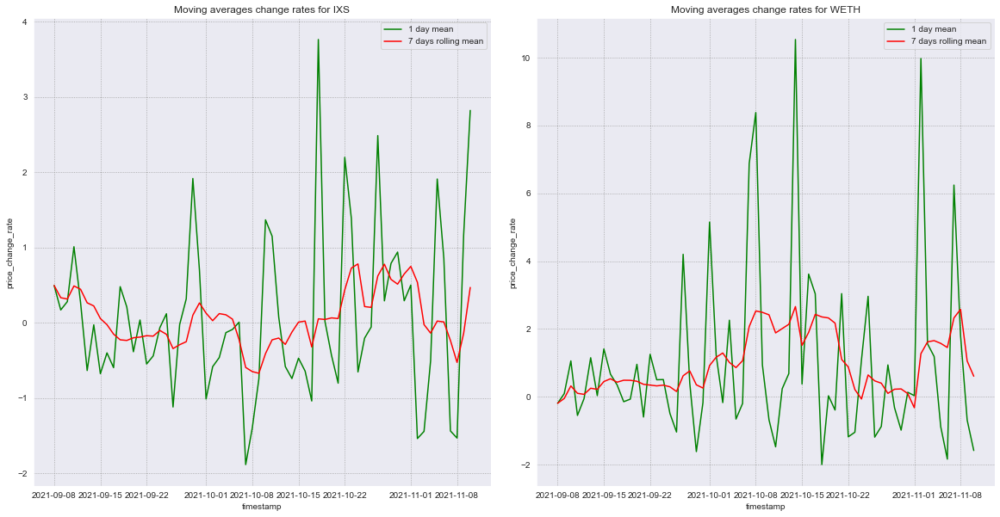

In [146]:
swaps_price_increase_rates_moving_averages(ixs_weth_df, first_token='IXS', second_token='WETH', first_plot_name='Moving averages change rates for IXS', 
                                           second_plot_name='Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

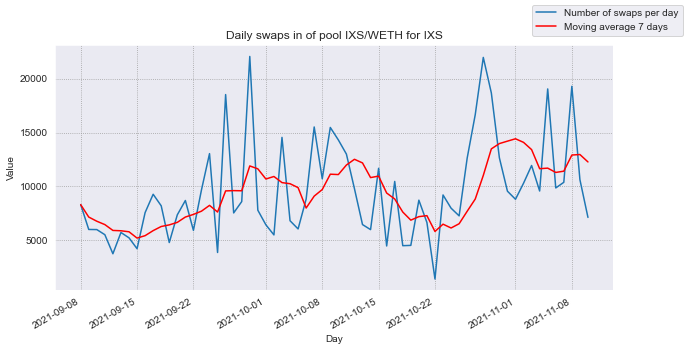

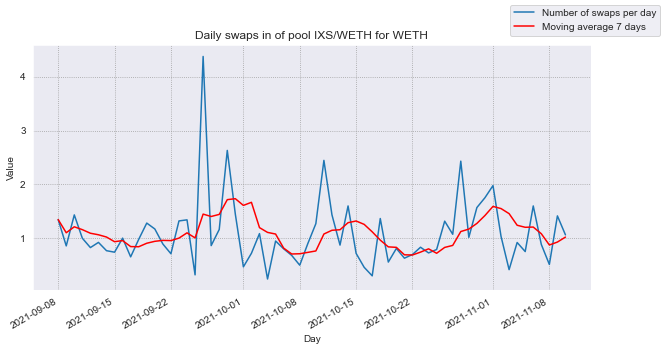

In [265]:
show_swaps_amount_in_moving_averages(swaps_df=ixs_weth_df[(ixs_weth_df.token_in == 'IXS')], pool_name="IXS/WETH for IXS")
show_swaps_amount_in_moving_averages(swaps_df=ixs_weth_df[(ixs_weth_df.token_in == 'WETH')], pool_name="IXS/WETH for WETH")

### Swaps values histograms

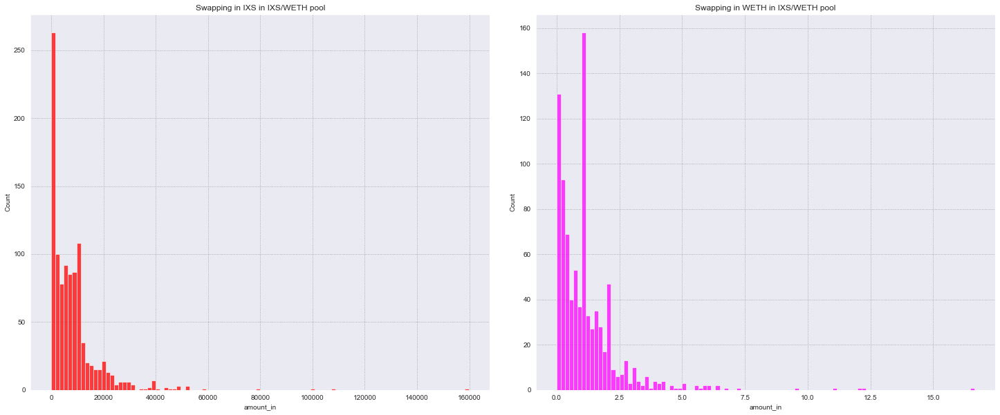

In [266]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=ixs_weth_df[ixs_weth_df.token_in == 'IXS'], x='amount_in', bins=100, color='red').set_title("Swapping in IXS in IXS/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=ixs_weth_df[ixs_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta').set_title("Swapping in WETH in IXS/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

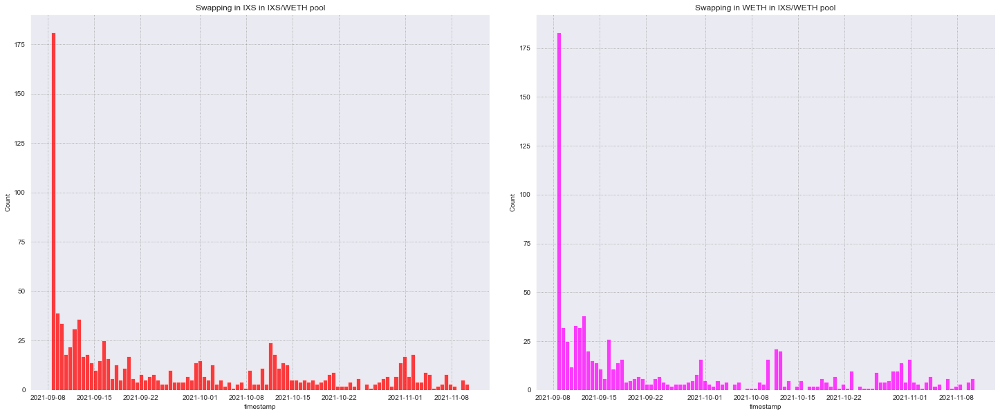

In [100]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=ixs_weth_df[ixs_weth_df.token_in == 'IXS'], x='timestamp', bins=100, color='red').set_title("Swapping in IXS in IXS/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=ixs_weth_df[ixs_weth_df.token_in == 'WETH'], x='timestamp', bins=100, color='magenta').set_title("Swapping in WETH in IXS/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Pool reserves distribution

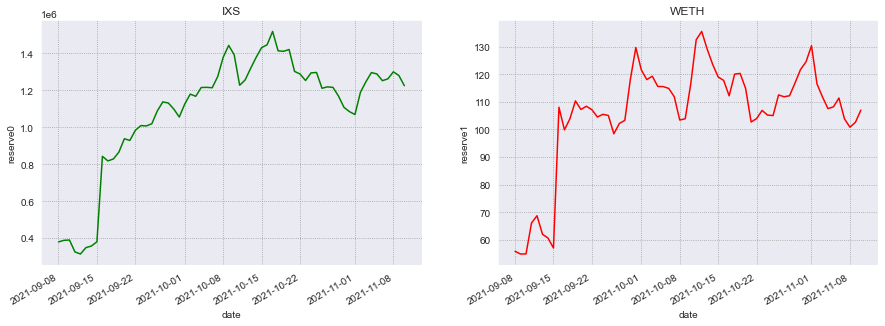

In [267]:
show_swaps_reserves_evolution_through_time(ixs_weth_reserves_df, first_token_reserve_name="IXS", second_token_reserve_name="WETH", x=15)

### Price distribution in pool

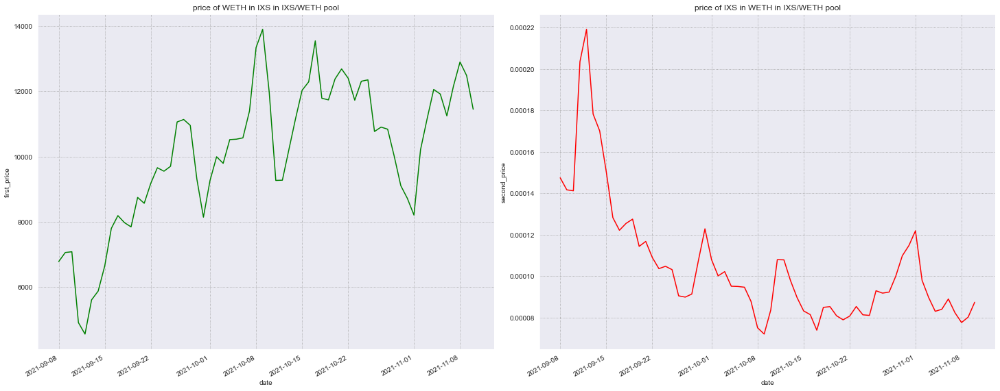

In [268]:
show_pool_price_evolution_from_reserves(ixs_weth_reserves_df, first_token_price_name="price of WETH in IXS in IXS/WETH pool", 
                                        second_token_price_name="price of IXS in WETH in IXS/WETH pool", x=25, y=10, wspace=0.1)

In [59]:
ixs_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,3.794422e+05,55.944001,3.907889e+05,3.245787e+06,425.302832,2021-09-08,6782.535597,0.000147,-3.937551,4.098949
1,3.880956e+05,54.966786,3.762270e+05,6.385440e+05,93.661413,2021-09-09,7060.548292,0.000142,-0.323291,0.324340
2,3.895395e+05,54.992914,3.521057e+05,5.129601e+05,85.994939,2021-09-10,7083.448476,0.000141,44.176365,-30.640504
3,3.251391e+05,66.178741,4.314507e+05,5.158716e+05,94.863760,2021-09-11,4913.044172,0.000204,7.674349,-7.127370
4,3.138946e+05,68.793197,4.722017e+05,3.769885e+05,81.732506,2021-09-12,4562.873332,0.000219,-18.680692,22.972025
...,...,...,...,...,...,...,...,...,...,...
59,1.252272e+06,111.369945,9.959401e+05,1.743100e+05,16.011554,2021-11-06,11244.255455,0.000089,-7.470730,8.073910
60,1.262068e+06,103.855905,9.562487e+05,1.157668e+05,9.582805,2021-11-07,12152.106556,0.000082,-5.758061,6.109871
61,1.300168e+06,100.830539,9.533918e+05,7.774344e+04,6.108676,2021-11-08,12894.584609,0.000078,3.329074,-3.221817
62,1.280204e+06,102.587502,9.790004e+05,1.272239e+05,9.640691,2021-11-09,12479.144669,0.000080,9.008401,-8.263951


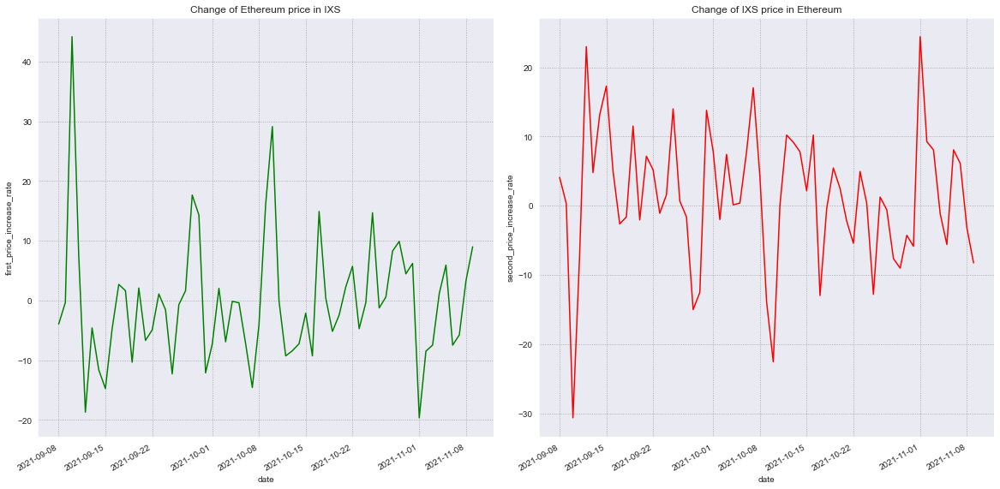

In [269]:
calc_price_and_increase_rates(ixs_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=ixs_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in IXS')
plt.subplot(1, 2, 2)
sns.lineplot(data=ixs_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of IXS price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

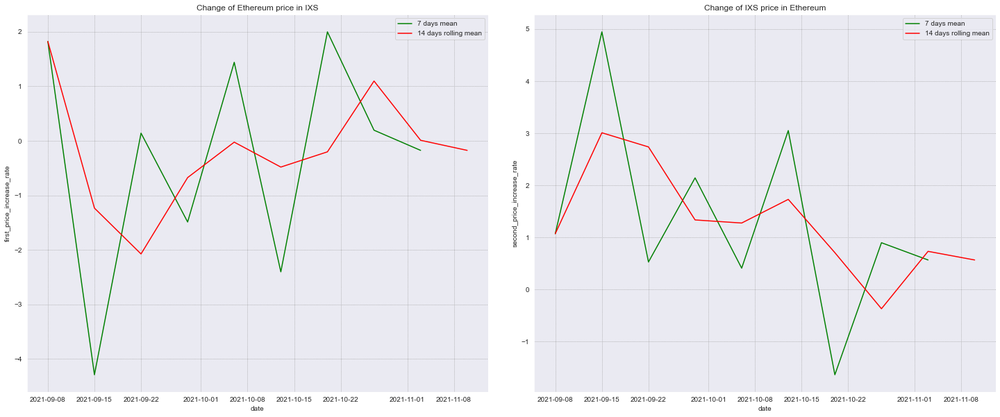

In [270]:
increase_rate_moving_averages(ixs_weth_reserves_df, 'Change of Ethereum price in IXS', 'Change of IXS price in Ethereum', x_size=25, y_size=10)

## SQUID/ETH

In [147]:
squid_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\squid_weth_swaps.pkl')
squid_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\squid_weth_mints.pkl")
squid_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\squid_weth_reserves.pkl")

### Plotting swapping in moving averages

In [148]:
squid_weth_df = get_df_with_swap_prices_and_change_rates(df=squid_weth_df, first_token='SQUID', second_token='WETH')

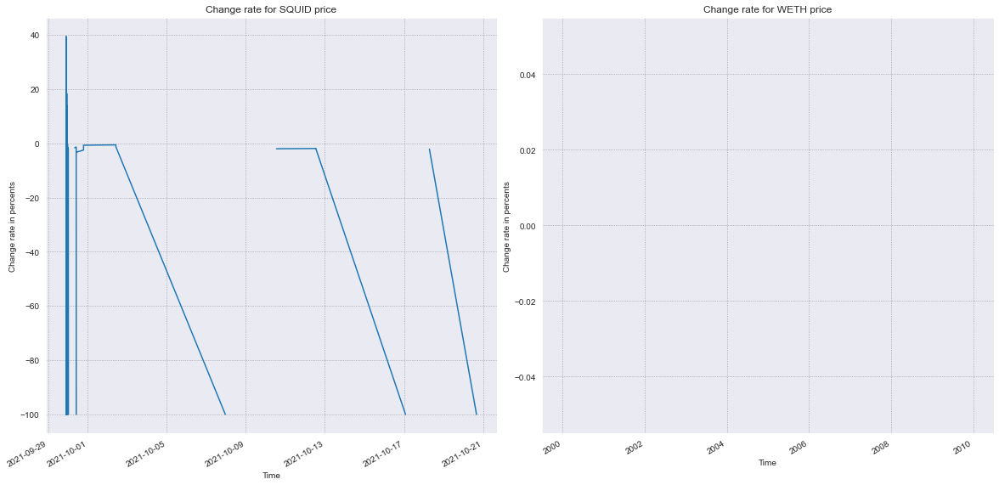

In [149]:
pyplot_line_swap_change_rate(squid_weth_df, first_token='SQUID', second_token='WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

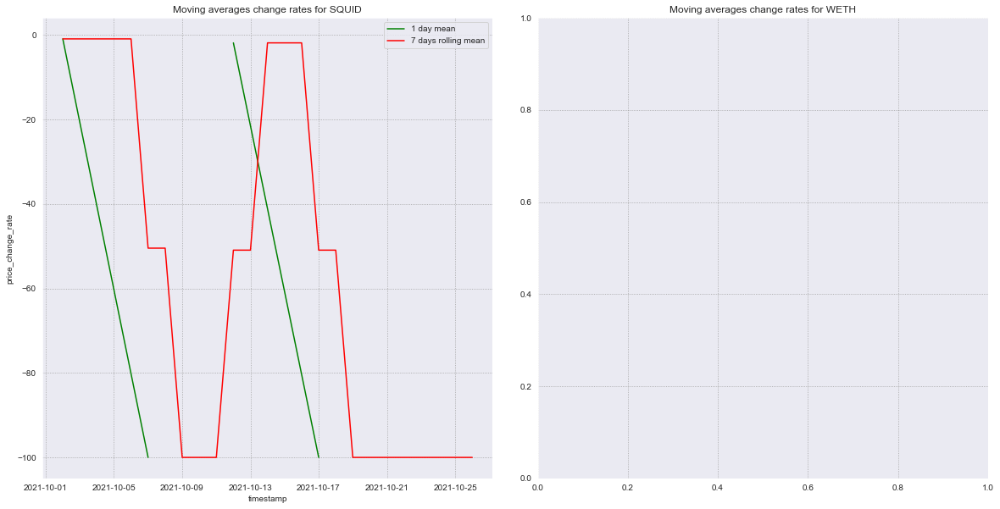

In [150]:
swaps_price_increase_rates_moving_averages(squid_weth_df, first_token='SQUID', second_token='WETH', first_plot_name='Moving averages change rates for SQUID', 
                                           second_plot_name='Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

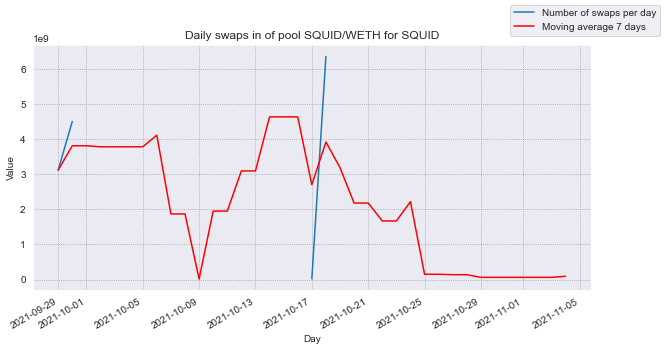

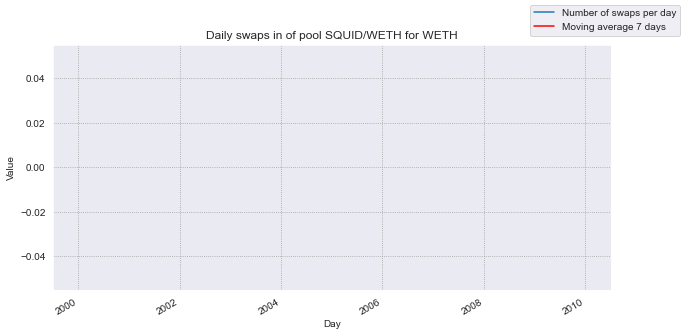

In [259]:
show_swaps_amount_in_moving_averages(swaps_df=squid_weth_df[(squid_weth_df.token_in == 'SQUID')], pool_name="SQUID/WETH for SQUID")
show_swaps_amount_in_moving_averages(swaps_df=squid_weth_df[(squid_weth_df.token_in == 'WETH')], pool_name="SQUID/WETH for WETH")

### Swaps values histograms

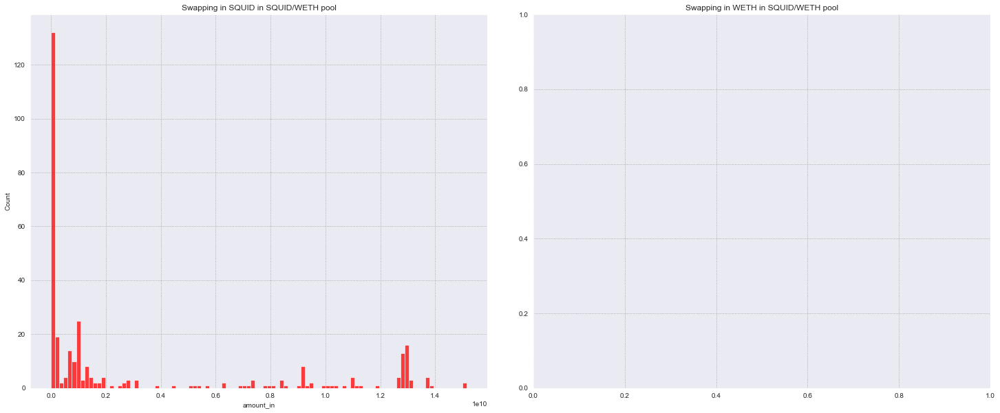

In [260]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=squid_weth_df[squid_weth_df.token_in == 'SQUID'], x='amount_in', bins=100, color='red').set_title("Swapping in SQUID in SQUID/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=squid_weth_df[squid_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta').set_title("Swapping in WETH in SQUID/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

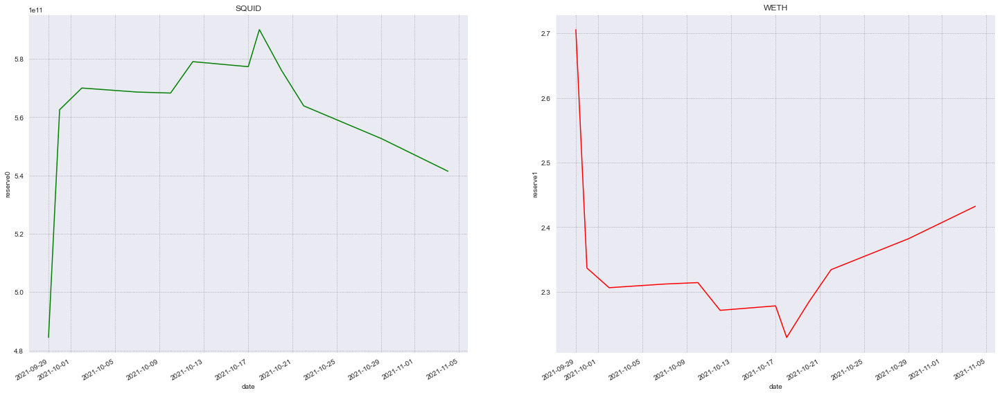

In [261]:
show_swaps_reserves_evolution_through_time(squid_weth_reserves_df, first_token_reserve_name="SQUID", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool prices

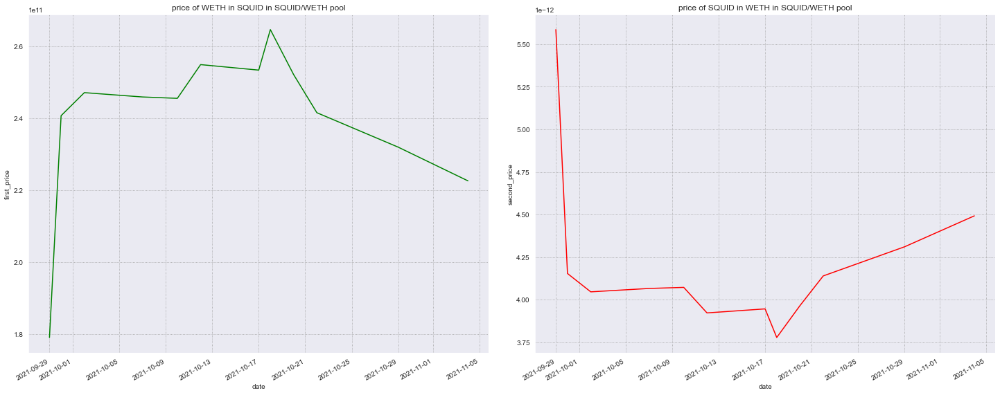

In [262]:
show_pool_price_evolution_from_reserves(squid_weth_reserves_df, first_token_price_name="price of WETH in SQUID in SQUID/WETH pool", 
                                        second_token_price_name="price of SQUID in WETH in SQUID/WETH pool", x=25, y=10, wspace=0.1)

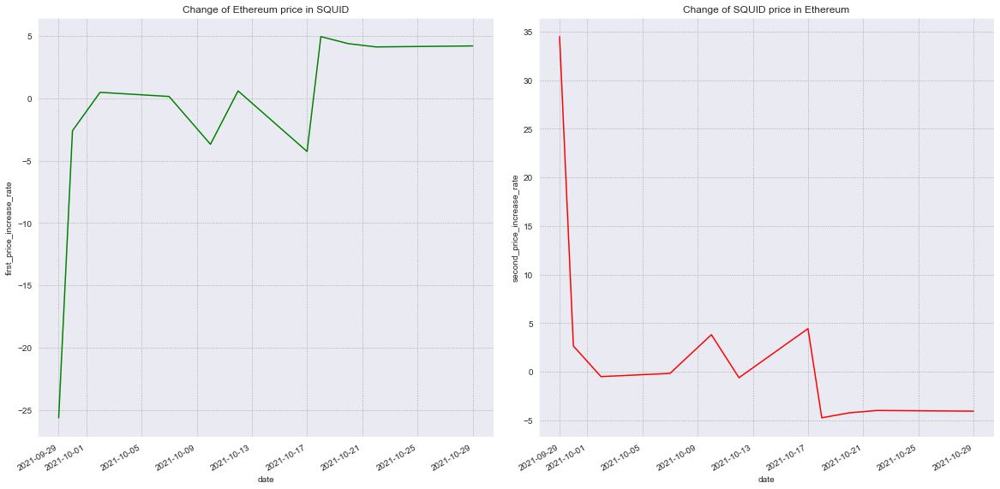

In [263]:
calc_price_and_increase_rates(squid_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=squid_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in SQUID')
plt.subplot(1, 2, 2)
sns.lineplot(data=squid_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of SQUID price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

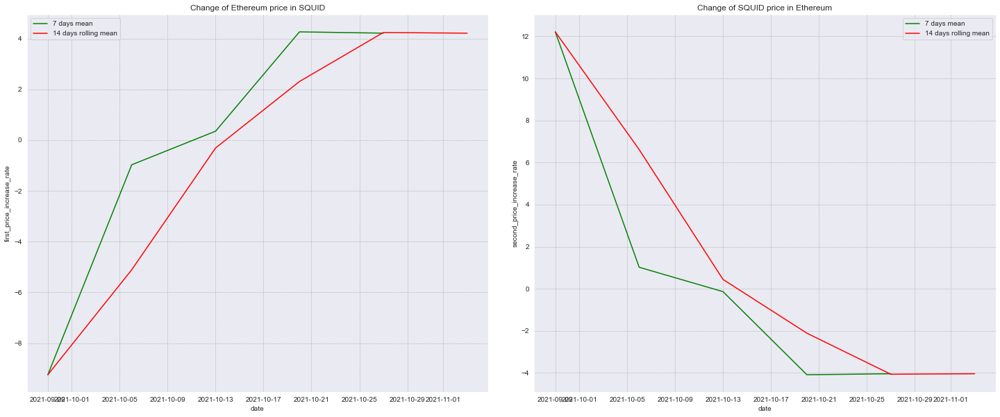

In [264]:
increase_rate_moving_averages(squid_weth_reserves_df, 'Change of Ethereum price in SQUID', 'Change of SQUID price in Ethereum', x_size=25, y_size=10)

## HKMT/USDT

In [151]:
hkmt_usdt_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\hkmt_usdt_swaps.pkl')
hkmt_usdt_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\hkmt_usdt_mints.pkl")
hkmt_usdt_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\hkmt_usdt_burns.pkl")
hkmt_usdt_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\hkmt_usdt_reserves.pkl")

### Plotting swapping in moving averages

In [152]:
hkmt_usdt_df = get_df_with_swap_prices_and_change_rates(df=hkmt_usdt_df, first_token='HKMT', second_token='USDT')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


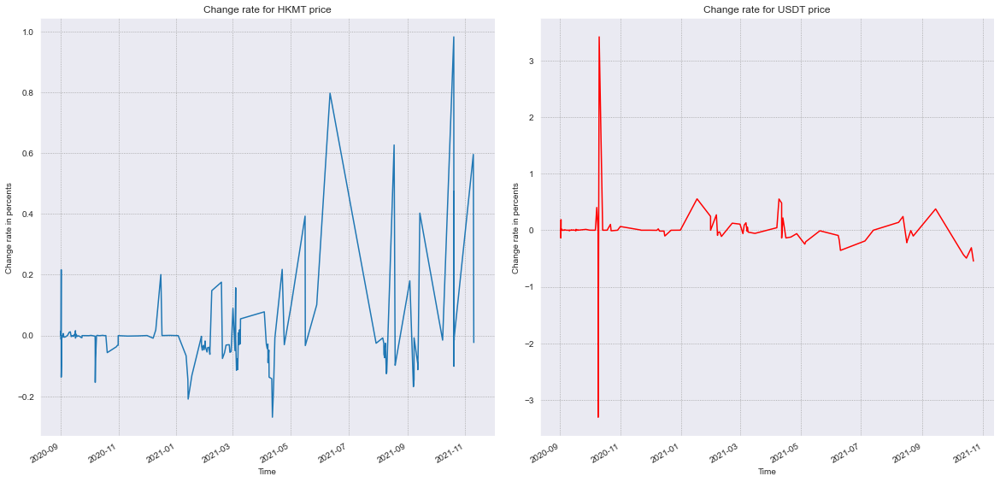

In [153]:
pyplot_line_swap_change_rate(df=hkmt_usdt_df, first_token='HKMT', second_token='USDT', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

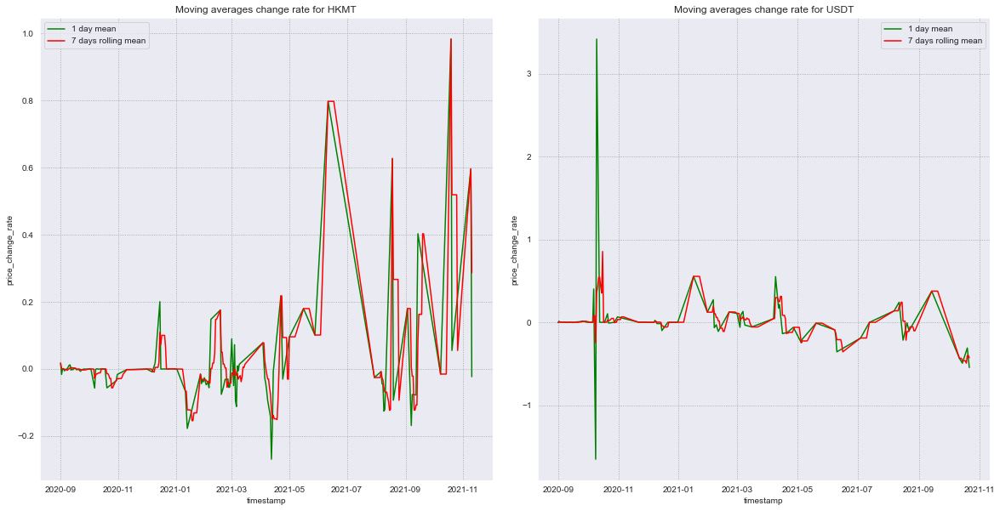

In [154]:
swaps_price_increase_rates_moving_averages(df=hkmt_usdt_df, first_token='HKMT', second_token='USDT',
                                           first_plot_name='Moving averages change rate for HKMT',
                                           second_plot_name='Moving averages change rate for USDT',
                                           x_size=20, y_size=10, wspace=0.1, hspace=0.1)

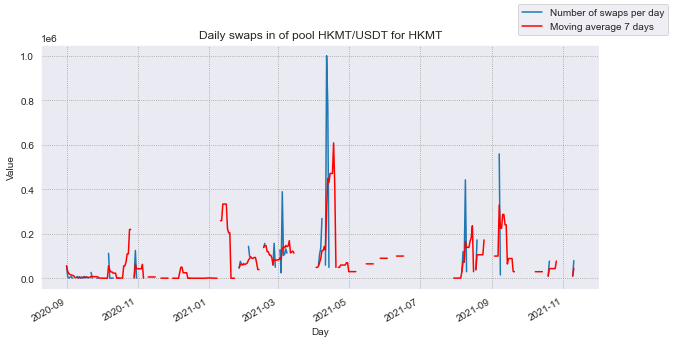

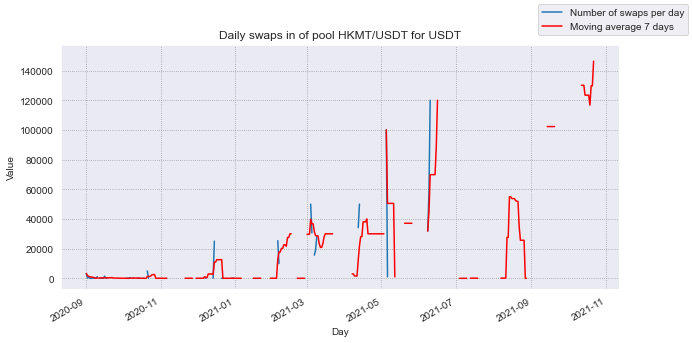

In [252]:
show_swaps_amount_in_moving_averages(swaps_df=hkmt_usdt_df[(hkmt_usdt_df.token_in == 'HKMT')], pool_name="HKMT/USDT for HKMT")
show_swaps_amount_in_moving_averages(swaps_df=hkmt_usdt_df[(hkmt_usdt_df.token_in == 'USDT')], pool_name="HKMT/USDT for USDT")

### Swaps values histograms

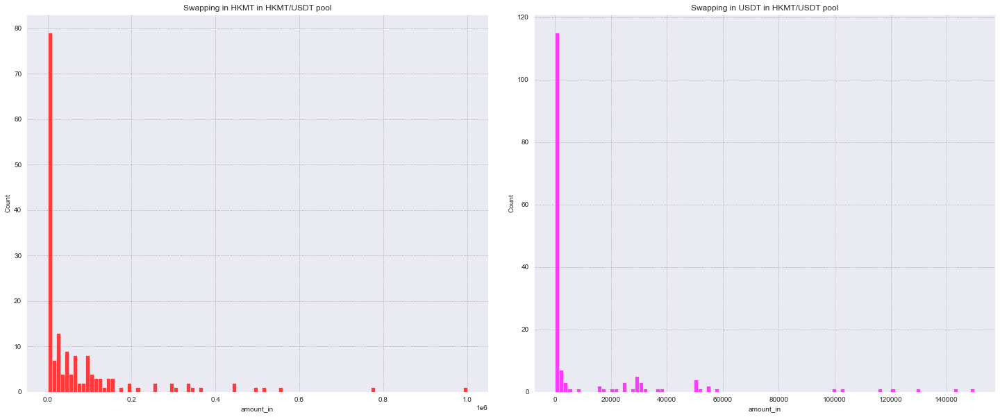

In [253]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=hkmt_usdt_df[hkmt_usdt_df.token_in == 'HKMT'], x='amount_in', bins=100, color='red').set_title("Swapping in HKMT in HKMT/USDT pool")
plt.subplot(1, 2, 2)
sns.histplot(data=hkmt_usdt_df[hkmt_usdt_df.token_in == 'USDT'], x='amount_in', bins=100, color='magenta').set_title("Swapping in USDT in HKMT/USDT pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

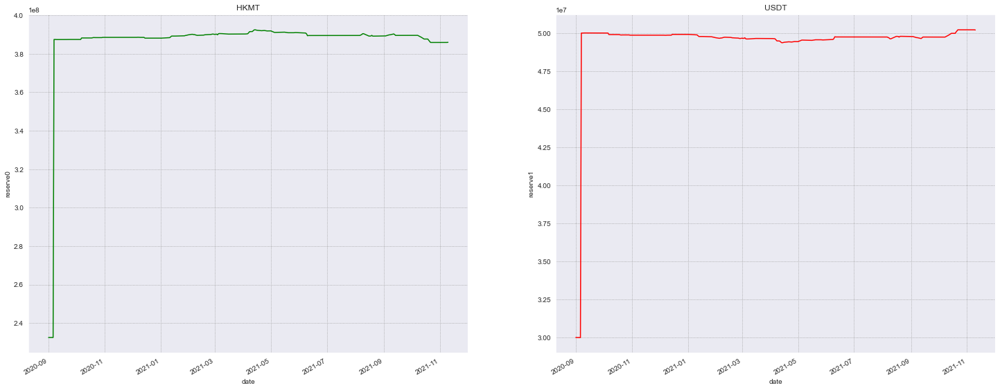

In [254]:
show_swaps_reserves_evolution_through_time(hkmt_usdt_reserves_df, first_token_reserve_name="HKMT", second_token_reserve_name="USDT", x=25, y=10)

### Plotting pool price

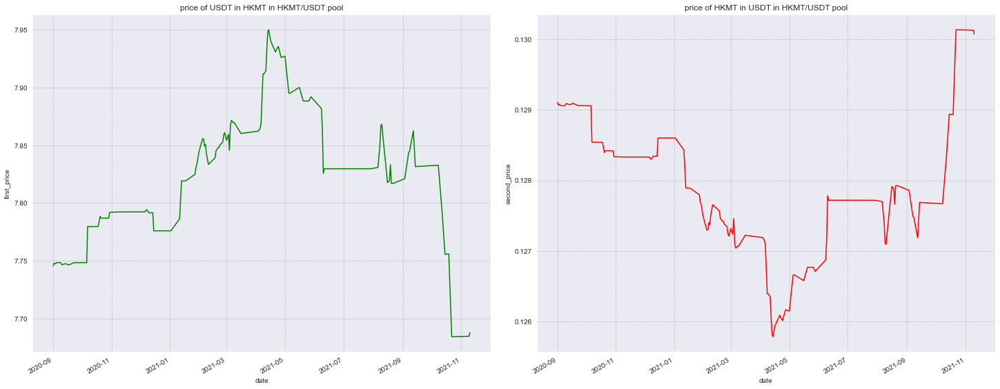

In [255]:
show_pool_price_evolution_from_reserves(hkmt_usdt_reserves_df, first_token_price_name="price of USDT in HKMT in HKMT/USDT pool", 
                                        second_token_price_name="price of HKMT in USDT in HKMT/USDT pool", x=25, y=10, wspace=0.1)

In [75]:
hkmt_usdt_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,2.324374e+08,3.000841e+07,5.962596e+07,8.411800e+05,108718.139712,2020-09-01,7.745741,0.129103,-0.029711,0.029720
1,2.324720e+08,3.000396e+07,5.998884e+07,3.968598e+04,5109.376059,2020-09-02,7.748043,0.129065,0.008619,-0.008619
2,2.324620e+08,3.000526e+07,5.980636e+07,1.213620e+04,1570.298902,2020-09-03,7.747375,0.129076,-0.009279,0.009279
3,2.324728e+08,3.000387e+07,5.974688e+07,1.126615e+04,1449.936710,2020-09-04,7.748094,0.129064,-0.005809,0.005809
4,2.324795e+08,3.000300e+07,5.981387e+07,7.698807e+03,990.995574,2020-09-05,7.748544,0.129057,-0.000353,0.000353
...,...,...,...,...,...,...,...,...,...,...
149,3.876795e+08,4.998382e+07,9.987336e+07,1.000000e+04,1285.473001,2021-10-19,7.756100,0.128931,0.331581,-0.330485
150,3.870407e+08,5.006692e+07,1.001026e+08,1.566792e+06,202352.471319,2021-10-20,7.730467,0.129358,0.599098,-0.595530
151,3.858882e+08,5.021690e+07,1.003717e+08,1.152465e+06,149976.000000,2021-10-22,7.684430,0.130133,-0.005175,0.005175
152,3.858982e+08,5.021560e+07,1.002498e+08,1.000000e+04,1297.395174,2021-11-09,7.684828,0.130127,-0.041076,0.041093


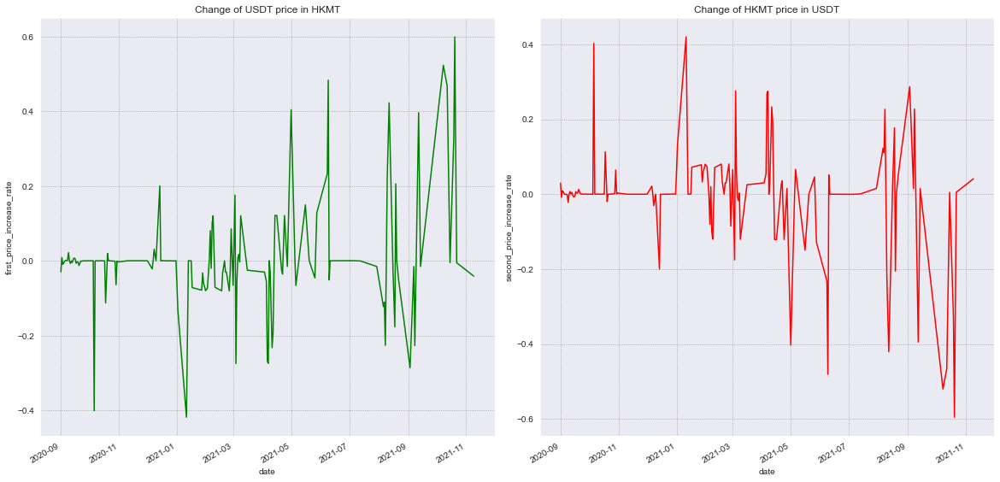

In [256]:
calc_price_and_increase_rates(hkmt_usdt_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=hkmt_usdt_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of USDT price in HKMT')
plt.subplot(1, 2, 2)
sns.lineplot(data=hkmt_usdt_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of HKMT price in USDT')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

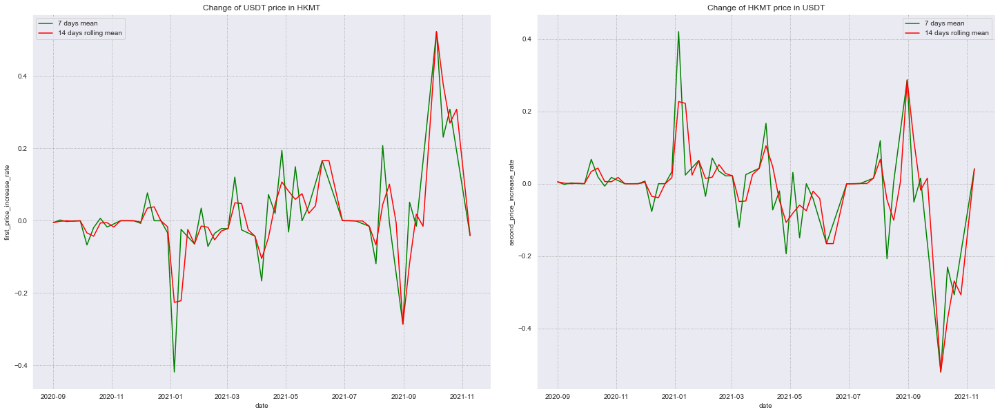

In [258]:
increase_rate_moving_averages(hkmt_usdt_reserves_df, 'Change of USDT price in HKMT', 'Change of HKMT price in USDT', x_size=25, y_size=10)

## FEI/ETH

In [156]:
fei_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\fei_weth_swaps.pkl')
fei_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\fei_weth_mints.pkl")
fei_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\fei_weth_burns.pkl")
fei_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\fei_weth_reserves.pkl")

### Plotting swapping in moving averages

In [157]:
fei_weth_df = get_df_with_swap_prices_and_change_rates(df=fei_weth_df, first_token='FEI', second_token='WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


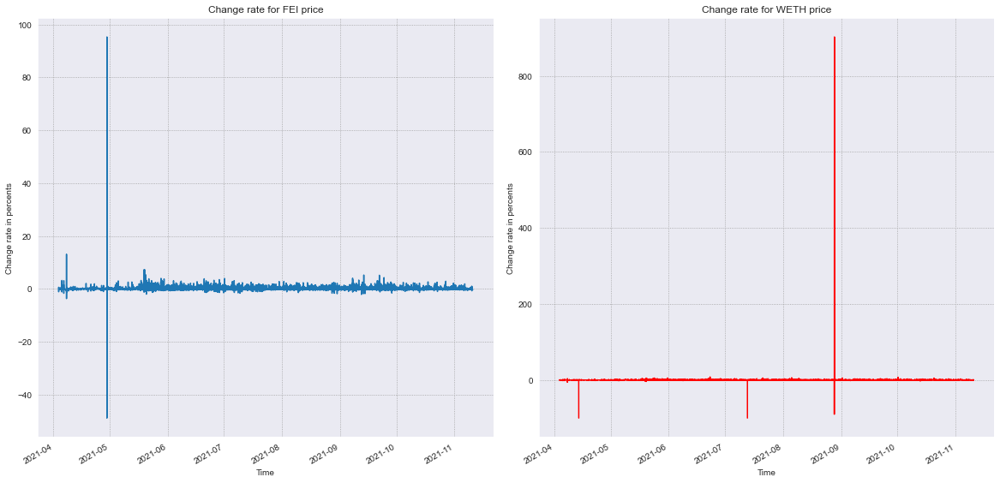

In [158]:
pyplot_line_swap_change_rate(df=fei_weth_df, first_token='FEI', second_token='WETH',
                             xsize=20, ysize=10, wspace=0.1, hspace=0.1)

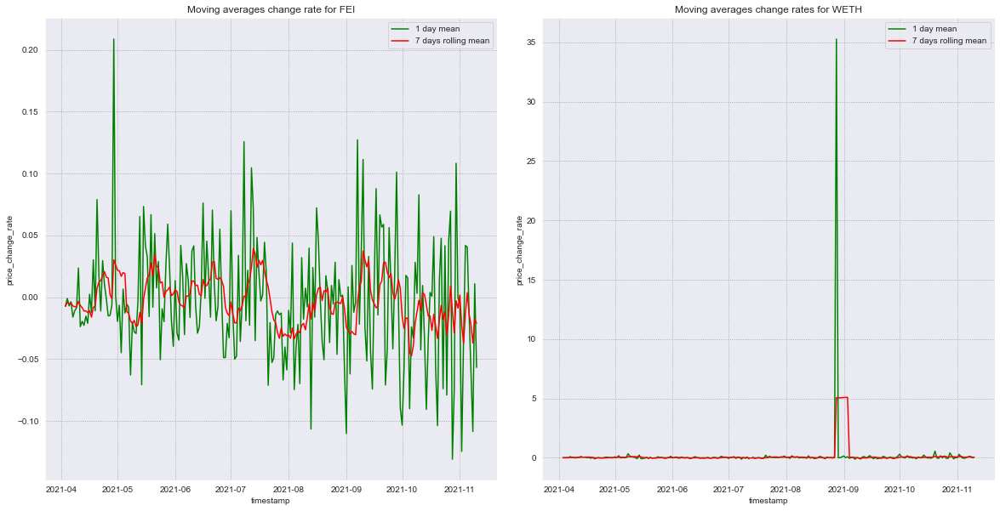

In [159]:
swaps_price_increase_rates_moving_averages(fei_weth_df, first_token='FEI', second_token='WETH',
                                           first_plot_name='Moving averages change rate for FEI',
                                           second_plot_name='Moving averages change rates for WETH',
                                           x_size=20, y_size=10, wspace=0.1, hspace=0.1)

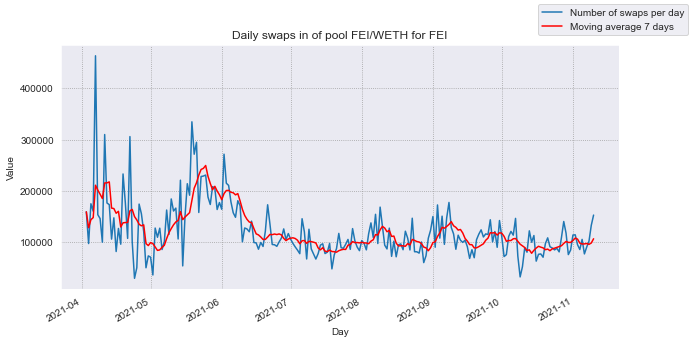

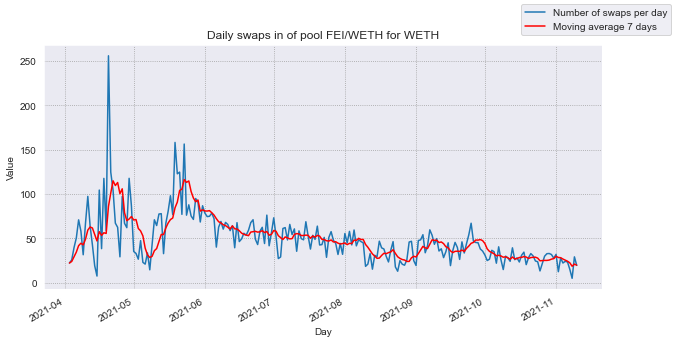

In [246]:
show_swaps_amount_in_moving_averages(swaps_df=fei_weth_df[(fei_weth_df.token_in == 'FEI')], pool_name="FEI/WETH for FEI")
show_swaps_amount_in_moving_averages(swaps_df=fei_weth_df[(fei_weth_df.token_in == 'WETH')], pool_name="FEI/WETH for WETH")

### Swaps values histograms

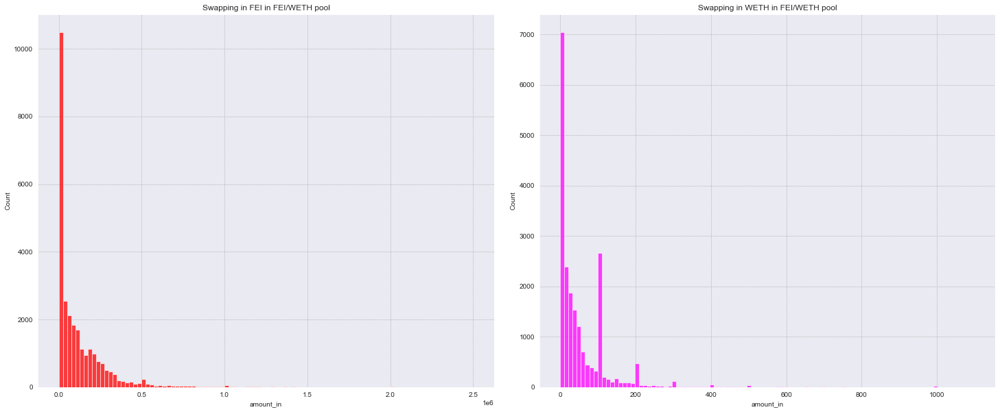

In [247]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=fei_weth_df[fei_weth_df.token_in == 'FEI'], x='amount_in', bins=100, color='red', binrange=[0, 2500000]).set_title("Swapping in FEI in FEI/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=fei_weth_df[fei_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 1100]).set_title("Swapping in WETH in FEI/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

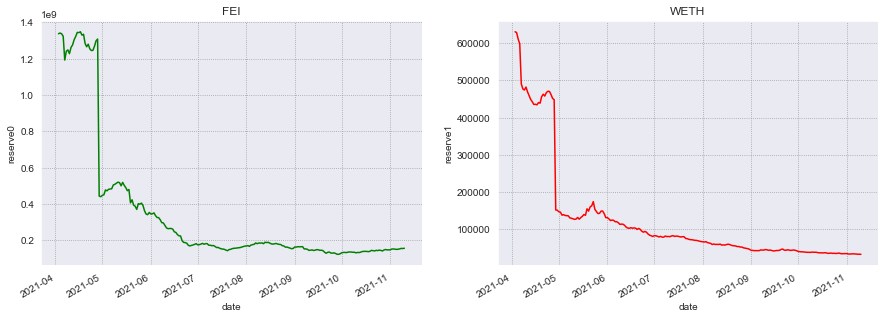

In [248]:
show_swaps_reserves_evolution_through_time(fei_weth_reserves_df, first_token_reserve_name="FEI", second_token_reserve_name="WETH", x=15)

### Plotting pool price

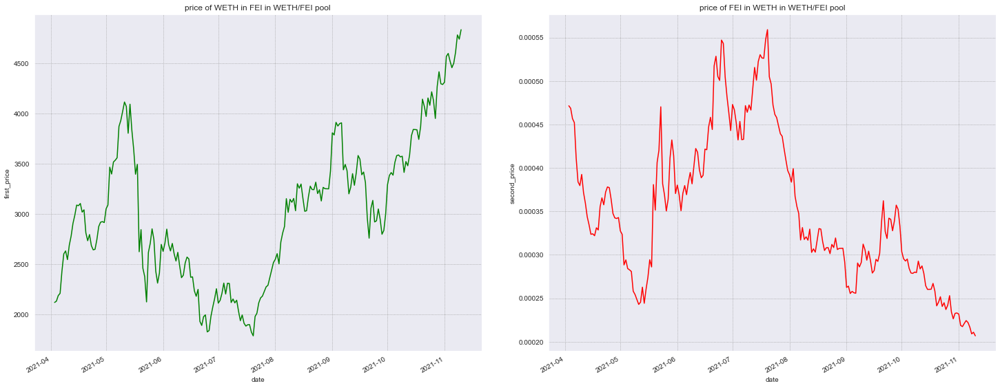

In [249]:
show_pool_price_evolution_from_reserves(fei_weth_reserves_df, first_token_price_name="price of WETH in FEI in WETH/FEI pool", 
                                        second_token_price_name="price of FEI in WETH in WETH/FEI pool", x=25, y=10, wspace=0.15)

In [80]:
fei_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,1.337230e+09,630522.677036,2.537871e+09,5.830436e+07,27452.763852,2021-04-03,2120.828163,0.000472,-0.611954,0.615722
1,1.341220e+09,628533.678068,2.604474e+09,6.647175e+07,31306.853434,2021-04-04,2133.886561,0.000469,-2.543805,2.610203
2,1.337334e+09,610770.369281,2.561514e+09,8.717716e+07,40829.752667,2021-04-05,2189.585332,0.000457,-0.996903,1.006941
3,1.323221e+09,598300.386209,2.531489e+09,5.256349e+07,24003.259833,2021-04-06,2211.633163,0.000452,-9.048616,9.948849
4,1.192320e+09,490330.663557,1.925378e+09,2.657121e+08,122248.657720,2021-04-07,2431.665205,0.000411,-6.626643,7.096931
...,...,...,...,...,...,...,...,...,...,...
217,1.501845e+08,33358.812751,3.008810e+08,9.439718e+06,2129.006495,2021-11-06,4502.093383,0.000222,-2.378791,2.436756
218,1.520115e+08,32961.427400,3.038065e+08,5.412572e+06,1185.020670,2021-11-07,4611.798435,0.000217,-3.600164,3.734616
219,1.548270e+08,32363.289968,3.102908e+08,3.921755e+06,831.158745,2021-11-08,4784.031407,0.000209,0.887535,-0.879727
220,1.541618e+08,32510.246132,3.081654e+08,1.157095e+07,2429.260301,2021-11-09,4741.945001,0.000211,-1.956701,1.995752


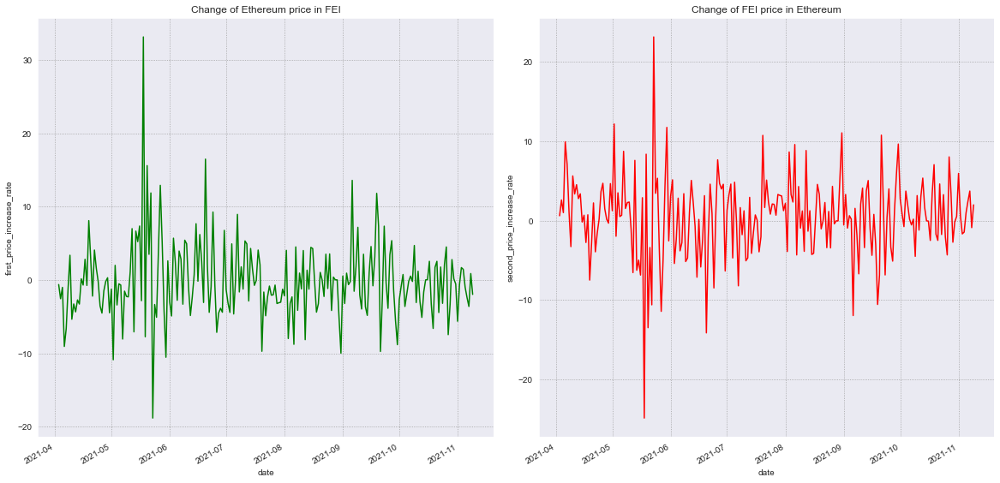

In [250]:
calc_price_and_increase_rates(fei_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=fei_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in FEI')
plt.subplot(1, 2, 2)
sns.lineplot(data=fei_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of FEI price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

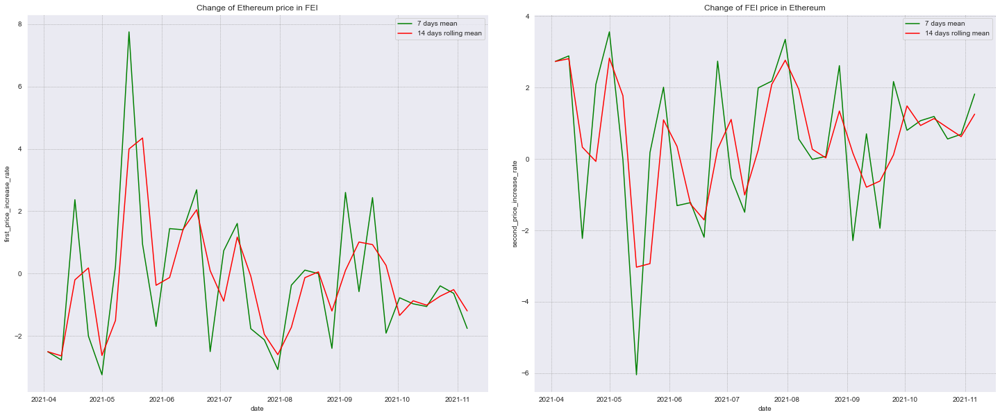

In [251]:
increase_rate_moving_averages(fei_weth_reserves_df, 'Change of Ethereum price in FEI', 'Change of FEI price in Ethereum', x_size=25, y_size=10)

## AXS/ETH

In [160]:
axs_weth_v2_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\axs_weth_v2_swaps.pkl')
axs_weth_v2_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\axs_weth_v2_mints.pkl")
axs_weth_v2_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\axs_weth_v2_burns.pkl")
axs_weth_v2_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\axs_weth_v2_reserves.pkl")

### Plotting swapping in moving averages

In [161]:
axs_weth_v2_df = get_df_with_swap_prices_and_change_rates(axs_weth_v2_df, 'AXS', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


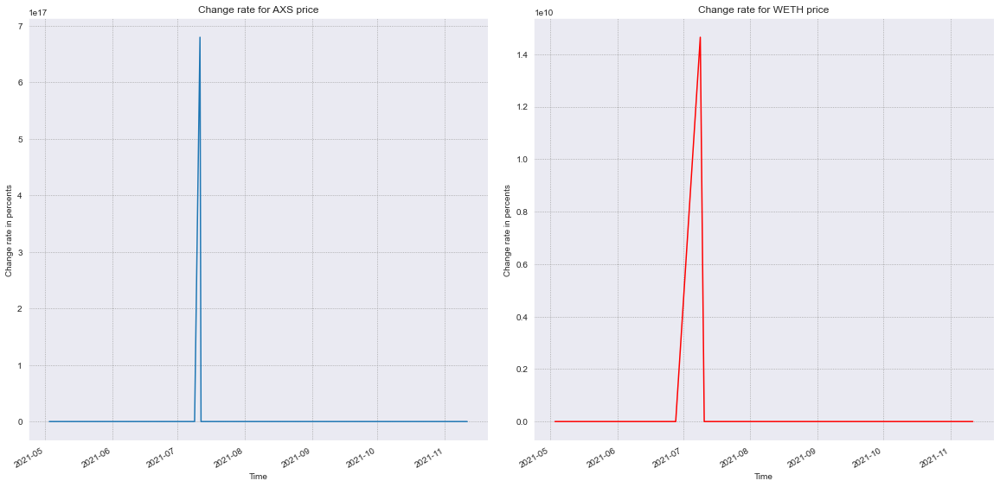

In [162]:
pyplot_line_swap_change_rate(axs_weth_v2_df, 'AXS', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

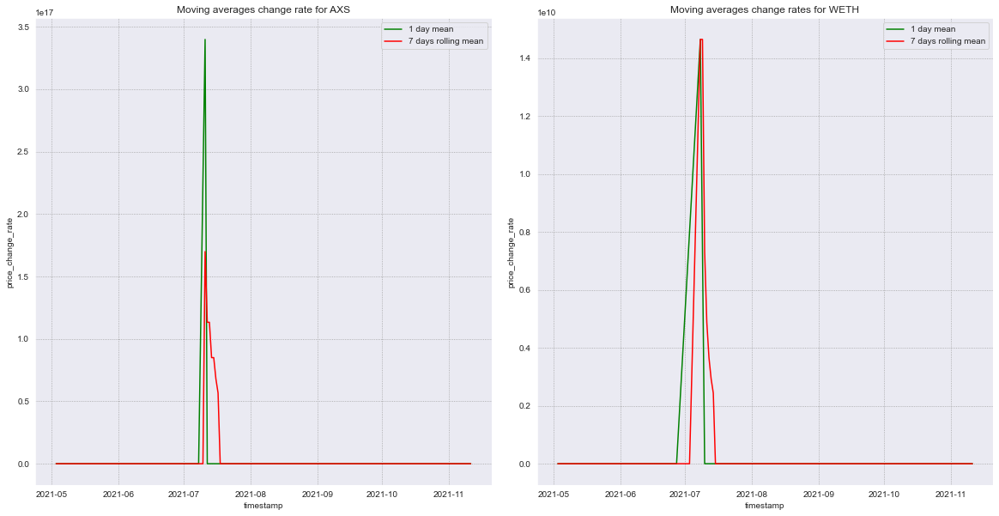

In [163]:
swaps_price_increase_rates_moving_averages(axs_weth_v2_df, "AXS", "WETH", 'Moving averages change rate for AXS',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

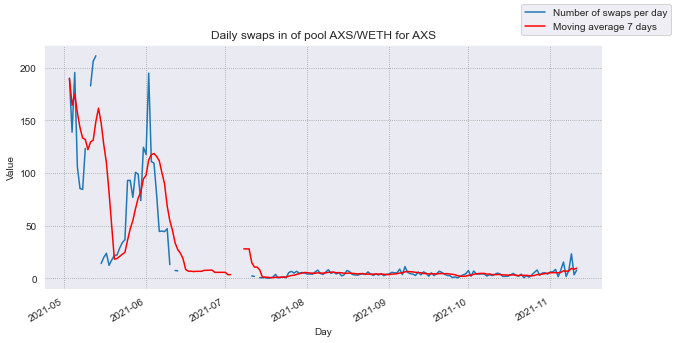

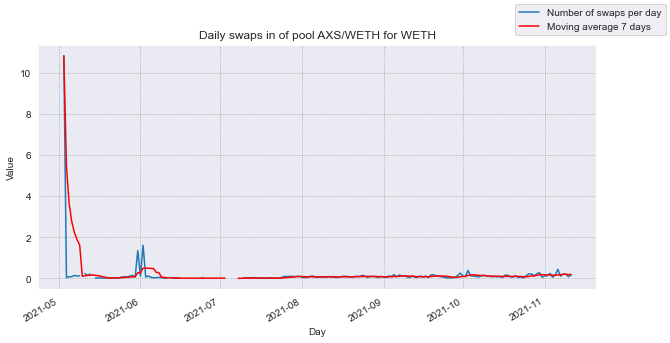

In [240]:
show_swaps_amount_in_moving_averages(swaps_df=axs_weth_v2_df[(axs_weth_v2_df.token_in == 'AXS')], pool_name="AXS/WETH for AXS")
show_swaps_amount_in_moving_averages(swaps_df=axs_weth_v2_df[(axs_weth_v2_df.token_in == 'WETH')], pool_name="AXS/WETH for WETH")

### Swaps values histograms

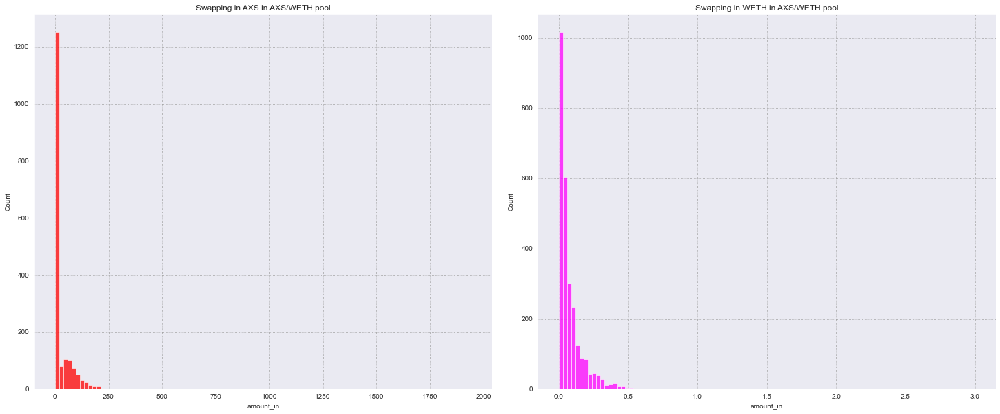

In [241]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=axs_weth_v2_df[axs_weth_v2_df.token_in == 'AXS'], x='amount_in', bins=100, color='red').set_title("Swapping in AXS in AXS/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=axs_weth_v2_df[axs_weth_v2_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 3]).set_title("Swapping in WETH in AXS/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

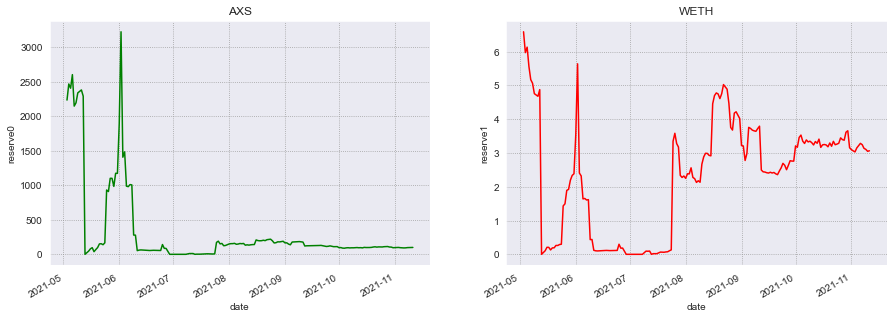

In [242]:
show_swaps_reserves_evolution_through_time(axs_weth_v2_reserves_df, first_token_reserve_name="AXS", second_token_reserve_name="WETH", x=15)

### Plotting pool price

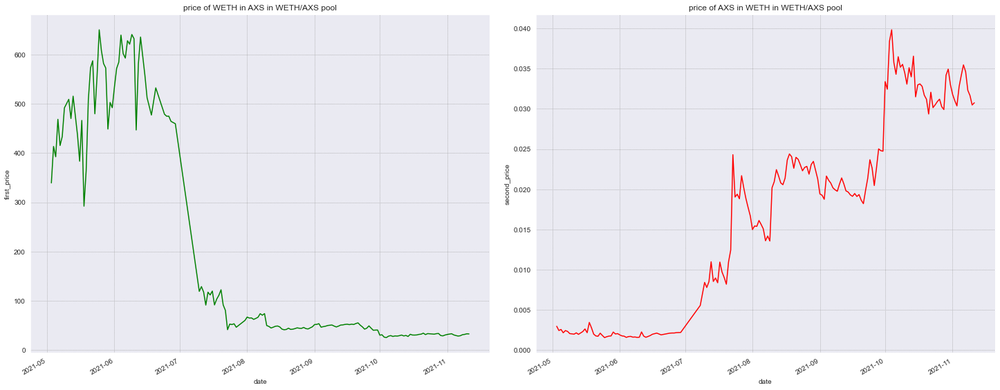

In [243]:
show_pool_price_evolution_from_reserves(axs_weth_v2_reserves_df, first_token_price_name="price of WETH in AXS in WETH/AXS pool", 
                                        second_token_price_name="price of AXS in WETH in WETH/AXS pool", x=25, y=10, wspace=0.1)

In [86]:
axs_weth_v2_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,2235.318021,6.589013,43248.099360,5631.549029,412.261553,2021-05-03,339.249298,0.002948,-17.945009,21.869491
1,2468.971504,5.971757,39933.495620,876.346517,2.191252,2021-05-04,413.441392,0.002419,5.345921,-5.074635
2,2407.284859,6.133823,42093.892594,1233.886645,3.094878,2021-05-05,392.460751,0.002548,-16.243861,19.394233
3,2603.981326,5.557229,38883.103492,1681.480184,4.037121,2021-05-06,468.575505,0.002134,12.820107,-11.363317
4,2148.038360,5.171886,35978.200367,2004.968493,4.749660,2021-05-07,415.329783,0.002408,-4.190249,4.373510
...,...,...,...,...,...,...,...,...,...,...
171,93.720378,3.246412,29904.748186,13.319140,0.446260,2021-11-07,28.868914,0.034639,-6.707836,7.190139
172,97.091996,3.137604,29966.847564,41.115158,1.406405,2021-11-08,30.944630,0.032316,-2.022286,2.064027
173,98.147476,3.107572,29688.149794,45.542305,1.272922,2021-11-09,31.583335,0.031662,-3.726050,3.870258
174,100.055361,3.049939,28068.271846,18.431023,0.554382,2021-11-10,32.805691,0.030483,0.904981,-0.896865


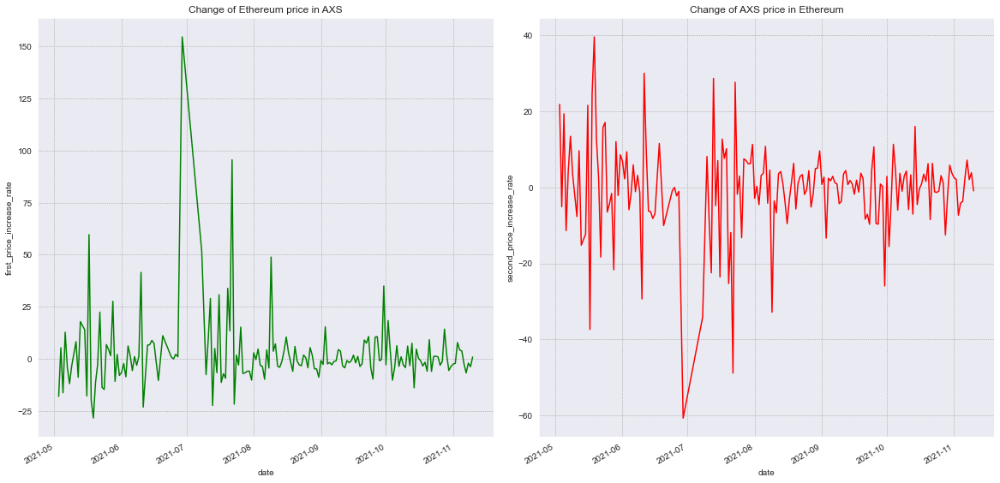

In [244]:
calc_price_and_increase_rates(axs_weth_v2_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=axs_weth_v2_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in AXS')
plt.subplot(1, 2, 2)
sns.lineplot(data=axs_weth_v2_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of AXS price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

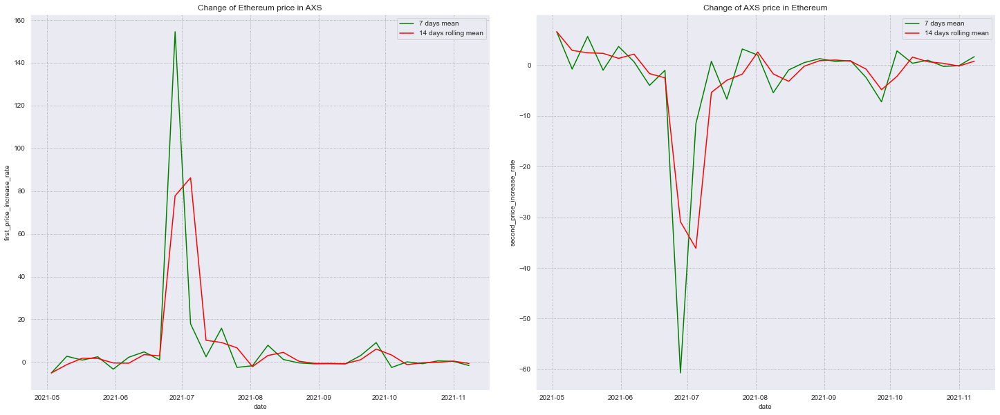

In [245]:
increase_rate_moving_averages(axs_weth_v2_reserves_df, 'Change of Ethereum price in AXS', 'Change of AXS price in Ethereum', x_size=25, y_size=10)

## MANA/ETH

In [165]:
mana_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\mana_weth_swaps.pkl')
mana_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\mana_weth_mints.pkl")
mana_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\mana_weth_burns.pkl")
mana_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\mana_weth_reserves.pkl")

### Plotting swapping in moving averages

In [166]:
mana_weth_df = get_df_with_swap_prices_and_change_rates(mana_weth_df, 'MANA', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


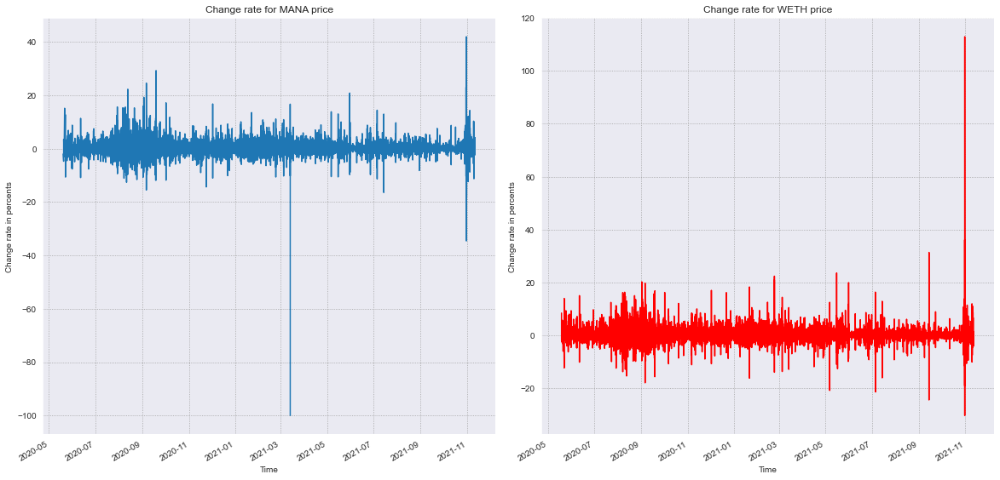

In [167]:
pyplot_line_swap_change_rate(mana_weth_df, 'MANA', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

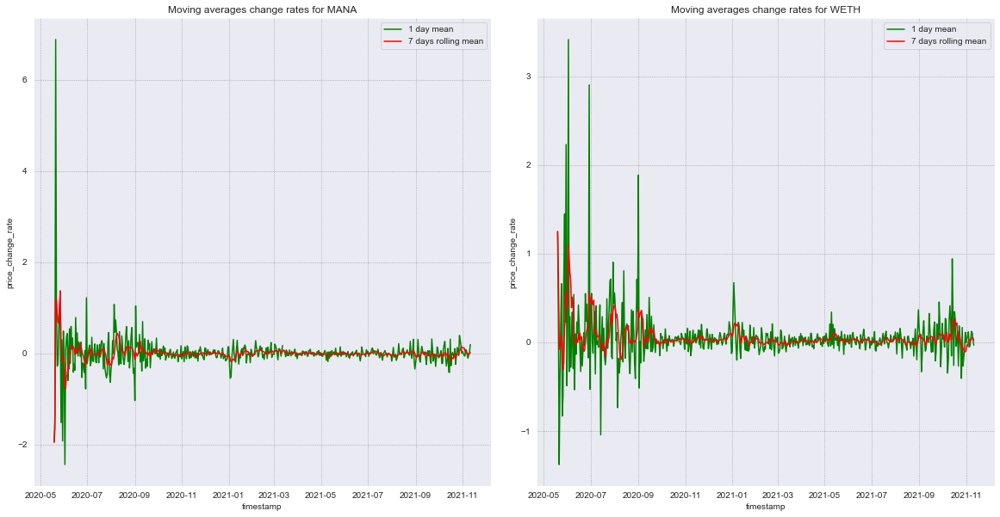

In [168]:
swaps_price_increase_rates_moving_averages(mana_weth_df, 'MANA', 'WETH', 'Moving averages change rates for MANA', 
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

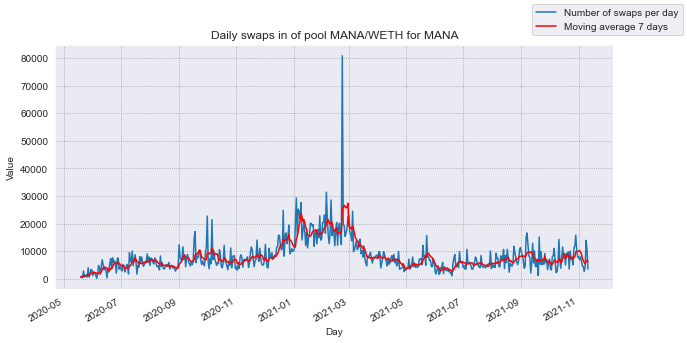

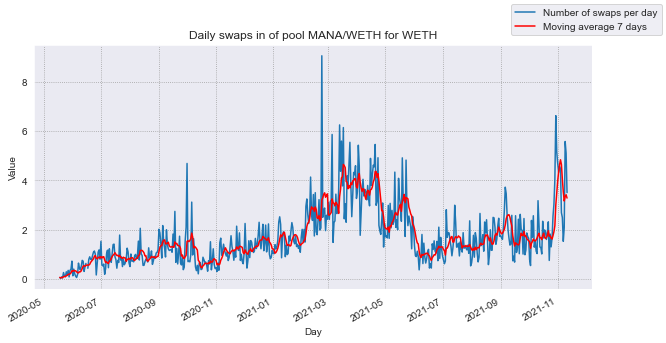

In [234]:
show_swaps_amount_in_moving_averages(swaps_df=mana_weth_df[(mana_weth_df.token_in == 'MANA')], pool_name="MANA/WETH for MANA")
show_swaps_amount_in_moving_averages(swaps_df=mana_weth_df[(mana_weth_df.token_in == 'WETH')], pool_name="MANA/WETH for WETH")

### Swaps values histograms

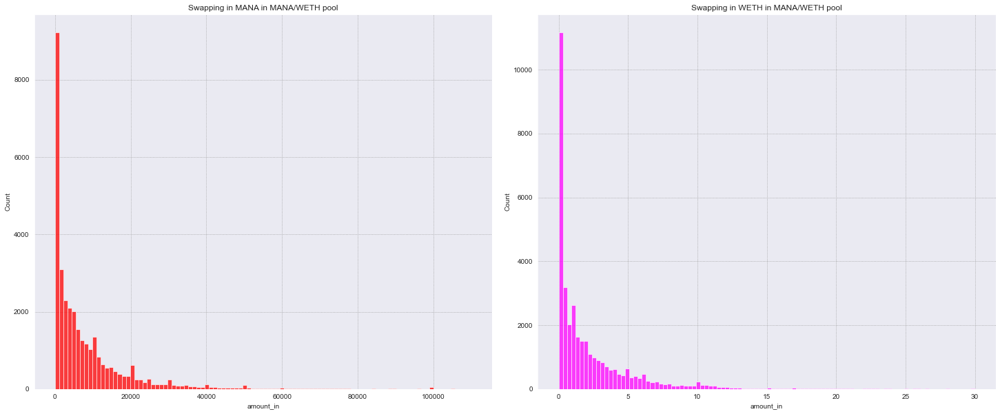

In [235]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=mana_weth_df[mana_weth_df.token_in == 'MANA'], x='amount_in', bins=100, color='red', binrange=[0, 110000]).set_title("Swapping in MANA in MANA/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=mana_weth_df[mana_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 30]).set_title("Swapping in WETH in MANA/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

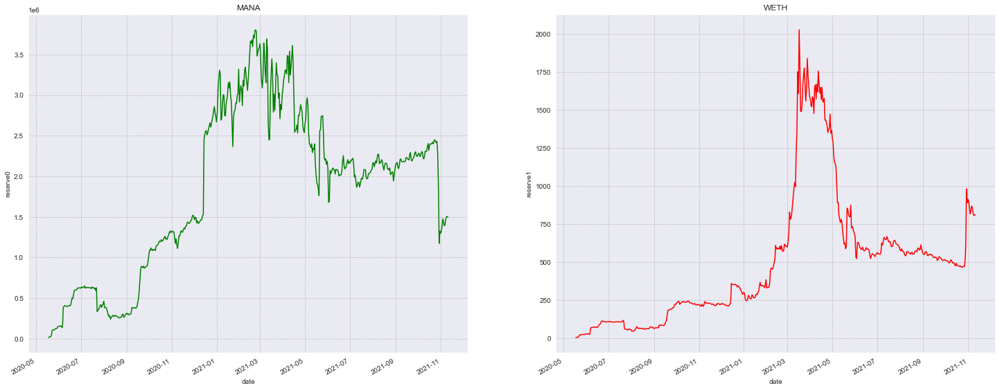

In [236]:
show_swaps_reserves_evolution_through_time(mana_weth_reserves_df, first_token_reserve_name="MANA", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

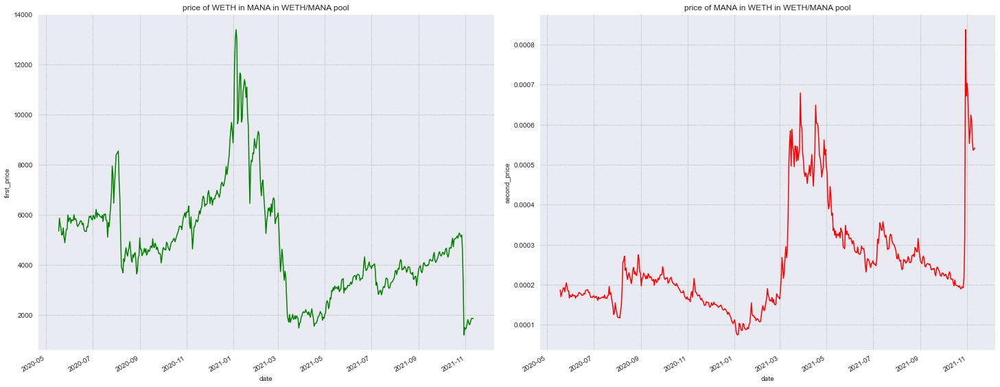

In [237]:
show_pool_price_evolution_from_reserves(mana_weth_reserves_df, first_token_price_name="price of WETH in MANA in WETH/MANA pool", 
                                        second_token_price_name="price of MANA in WETH in WETH/MANA pool", x=25, y=10, wspace=0.1)

In [91]:
mana_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,1.313154e+04,2.455654,5.260017e+02,2.759552e+02,0.050000,2020-05-18,5347.470266,0.000187,-8.824604,9.678713
1,1.995563e+04,3.402474,1.456969e+03,1.545187e+03,0.268593,2020-05-19,5865.036543,0.000171,4.696401,-4.485733
2,2.320825e+04,4.142890,1.747858e+03,5.835603e+03,0.971594,2020-05-20,5601.946650,0.000179,2.945408,-2.861136
3,2.287628e+04,4.203910,1.674104e+03,1.630945e+03,0.304859,2020-05-21,5441.667354,0.000184,4.864001,-4.638390
4,4.713547e+04,9.083270,3.766017e+03,1.150966e+04,2.419877,2020-05-22,5189.261607,0.000193,-0.364112,0.365443
...,...,...,...,...,...,...,...,...,...,...
538,1.406560e+06,858.125110,7.901340e+06,3.750751e+05,231.599542,2021-11-07,1639.108120,0.000610,-8.401532,9.172131
539,1.470613e+06,821.824572,7.896708e+06,6.330063e+05,365.717445,2021-11-08,1789.449269,0.000559,-4.033793,4.203347
540,1.503168e+06,806.132295,7.645894e+06,1.358138e+06,718.900592,2021-11-09,1864.666040,0.000536,0.261140,-0.260460
541,1.503989e+06,808.678993,7.479941e+06,1.843973e+06,1008.822995,2021-11-10,1859.809332,0.000538,0.787572,-0.781418


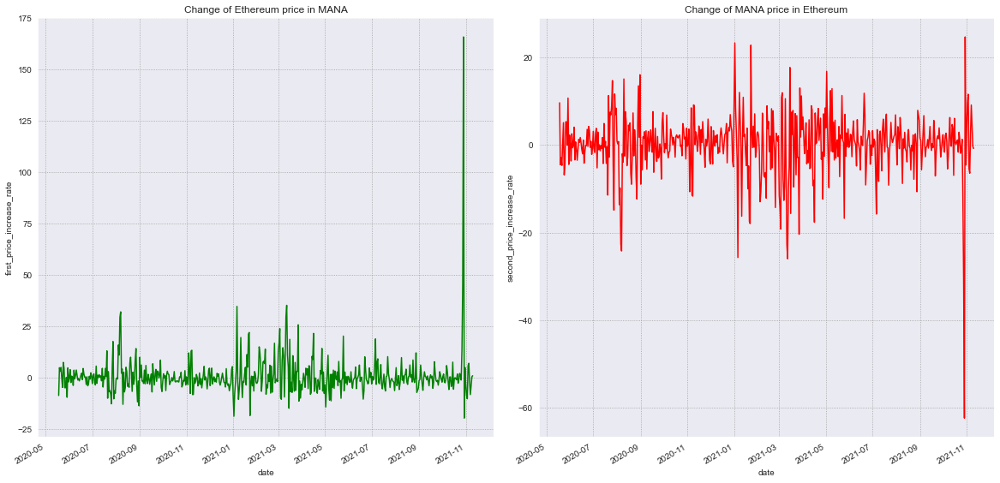

In [238]:
calc_price_and_increase_rates(mana_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=mana_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in MANA')
plt.subplot(1, 2, 2)
sns.lineplot(data=mana_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of MANA price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

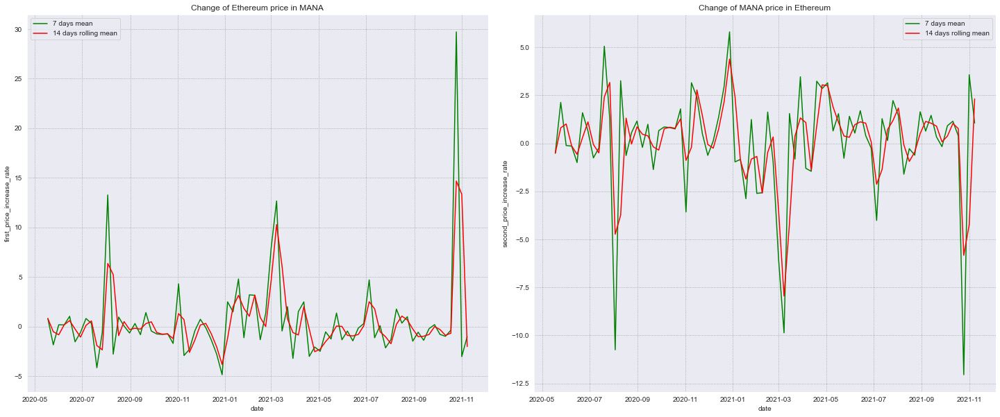

In [239]:
increase_rate_moving_averages(mana_weth_reserves_df, 'Change of Ethereum price in MANA', 'Change of MANA price in Ethereum', x_size=25, y_size=10)

## ENJ/ETH

In [169]:
enj_eth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\enj_eth_swaps.pkl')
enj_eth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\enj_eth_mints.pkl")
enj_eth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\enj_eth_burns.pkl")
enj_eth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\enj_eth_reserves.pkl")

### Plotting swapping in moving averages

In [170]:
enj_eth_df = get_df_with_swap_prices_and_change_rates(enj_eth_df, 'ENJ', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


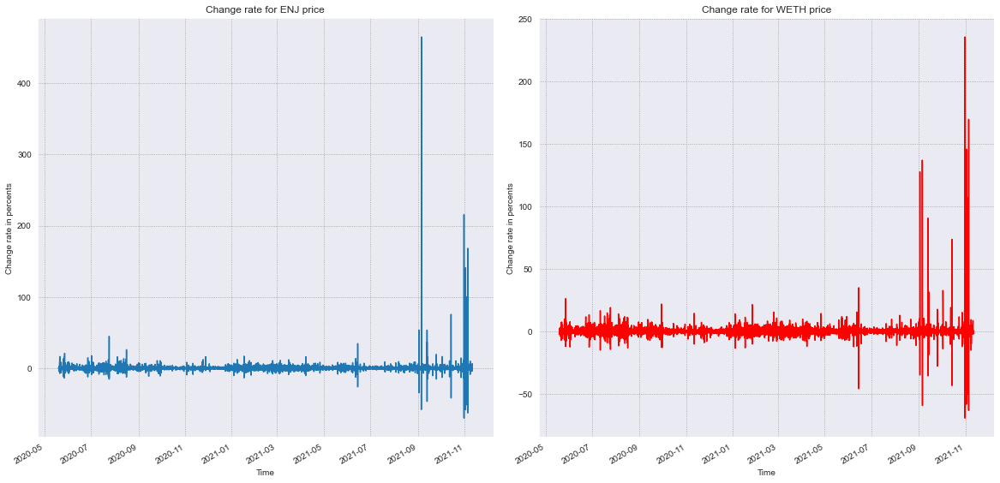

In [171]:
pyplot_line_swap_change_rate(enj_eth_df, 'ENJ', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

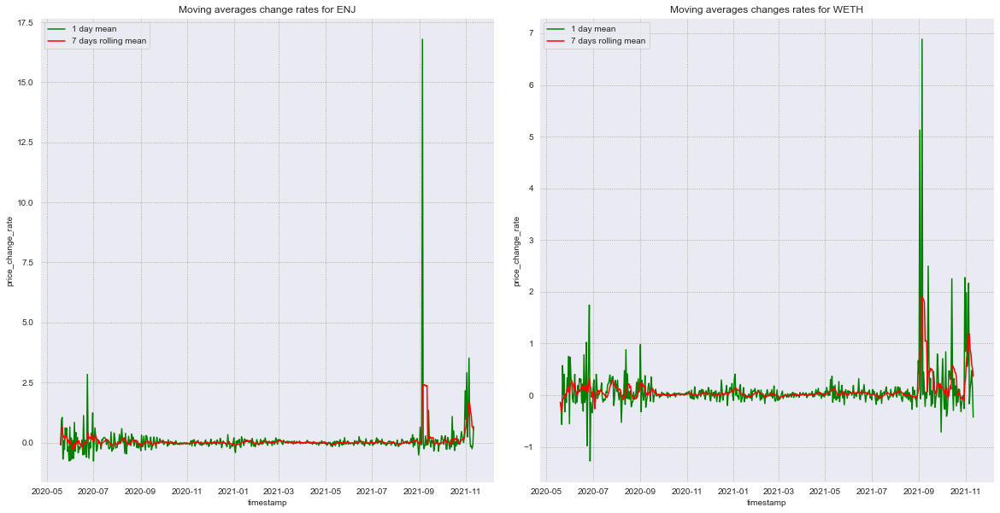

In [172]:
swaps_price_increase_rates_moving_averages(enj_eth_df, 'ENJ', 'WETH', 'Moving averages change rates for ENJ',
                                           'Moving averages changes rates for WETH', x_size=20, y_size=10,
                                           wspace=0.1, hspace=0.1)

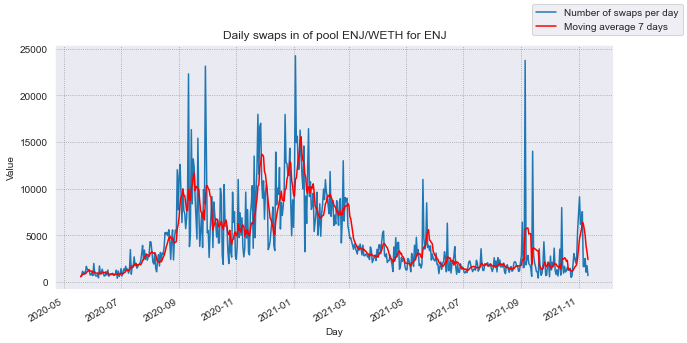

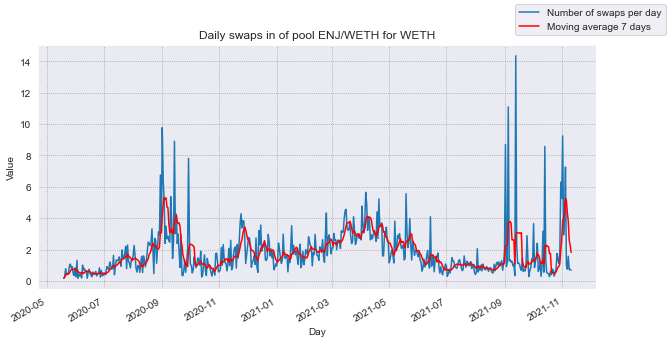

In [228]:
show_swaps_amount_in_moving_averages(swaps_df=enj_eth_df[(enj_eth_df.token_in == 'ENJ')], pool_name="ENJ/WETH for ENJ")
show_swaps_amount_in_moving_averages(swaps_df=enj_eth_df[(enj_eth_df.token_in == 'WETH')], pool_name="ENJ/WETH for WETH")

### Swaps values histograms

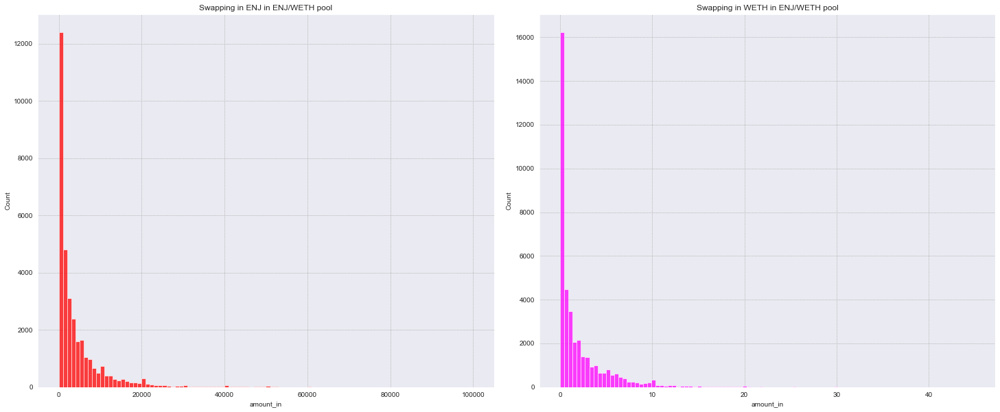

In [229]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=enj_eth_df[enj_eth_df.token_in == 'ENJ'], x='amount_in', bins=100, color='red', binrange=[0, 100000]).set_title("Swapping in ENJ in ENJ/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=enj_eth_df[enj_eth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 45]).set_title("Swapping in WETH in ENJ/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

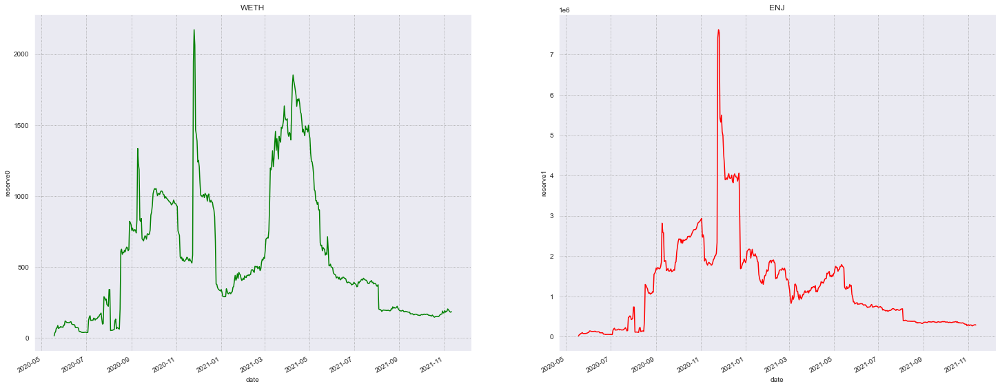

In [230]:
show_swaps_reserves_evolution_through_time(enj_eth_reserves_df, first_token_reserve_name="WETH", second_token_reserve_name="ENJ", x=25, y=10)

### Plotting pool price

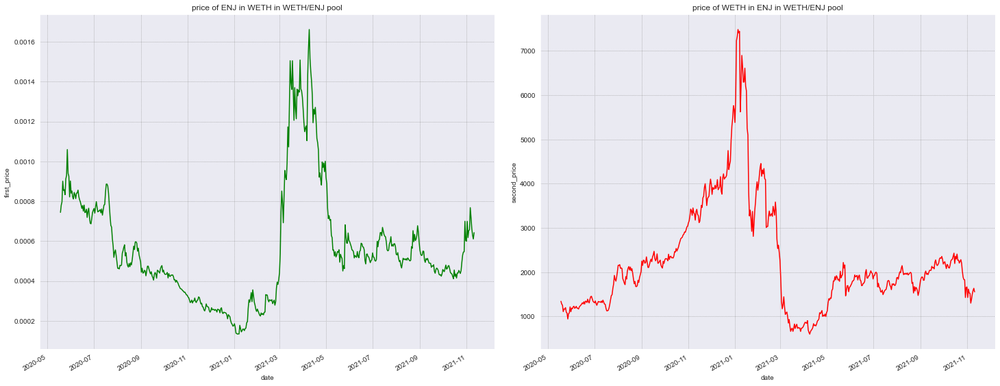

In [231]:
show_pool_price_evolution_from_reserves(enj_eth_reserves_df, first_token_price_name="price of ENJ in WETH in WETH/ENJ pool", 
                                        second_token_price_name="price of WETH in ENJ in WETH/ENJ pool", x=25, y=10, wspace=0.1)

In [96]:
enj_eth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,14.596187,19609.896031,6.256915e+03,0.000000,0.000000,2020-05-18,0.000744,1343.494443,-4.588920,4.809630
1,35.608058,45643.923958,1.503812e+04,4.334663,5636.075761,2020-05-19,0.000780,1281.842554,-2.126011,2.172192
2,44.083044,55306.165361,1.852330e+04,6.154577,8060.401355,2020-05-20,0.000797,1254.590445,-11.528553,13.030818
3,68.513132,76046.446474,2.728367e+04,39.970996,43953.282808,2020-05-21,0.000901,1109.954323,5.427053,-5.147686
4,70.230793,82183.521342,2.917812e+04,15.703982,18107.270743,2020-05-22,0.000855,1170.192137,-0.407991,0.409662
...,...,...,...,...,...,...,...,...,...,...
538,197.158411,274486.674468,1.816373e+06,84.303046,113268.199448,2021-11-07,0.000718,1392.213870,8.359121,-7.714276
539,189.551810,285956.100674,1.816394e+06,104.945458,150403.609035,2021-11-08,0.000663,1508.590717,5.198169,-4.941311
540,183.841111,291757.647168,1.744292e+06,27.593816,43452.417673,2021-11-09,0.000630,1587.009811,3.141844,-3.046139
541,181.090315,296421.520097,1.678366e+06,48.458147,76004.100494,2021-11-10,0.000611,1636.871190,-4.966064,5.225569


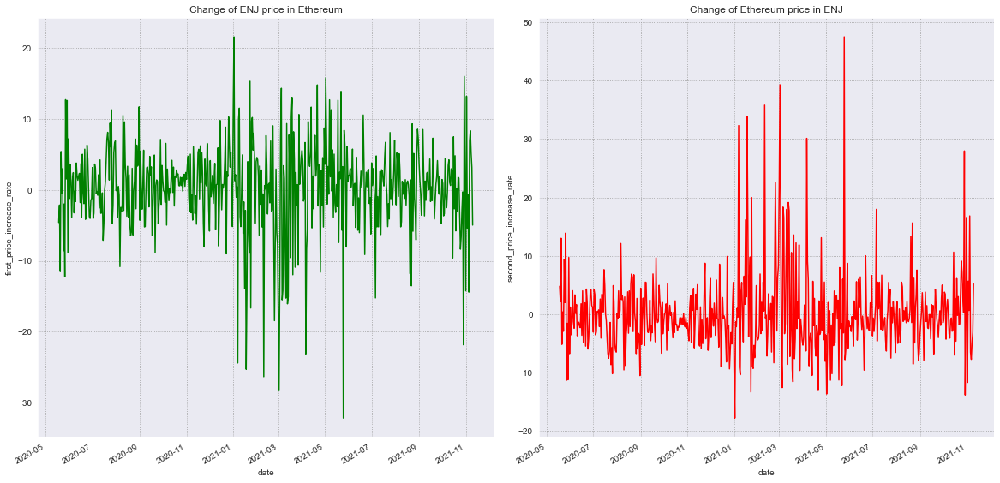

In [232]:
calc_price_and_increase_rates(enj_eth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=enj_eth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of ENJ price in Ethereum')
plt.subplot(1, 2, 2)
sns.lineplot(data=enj_eth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of Ethereum price in ENJ')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

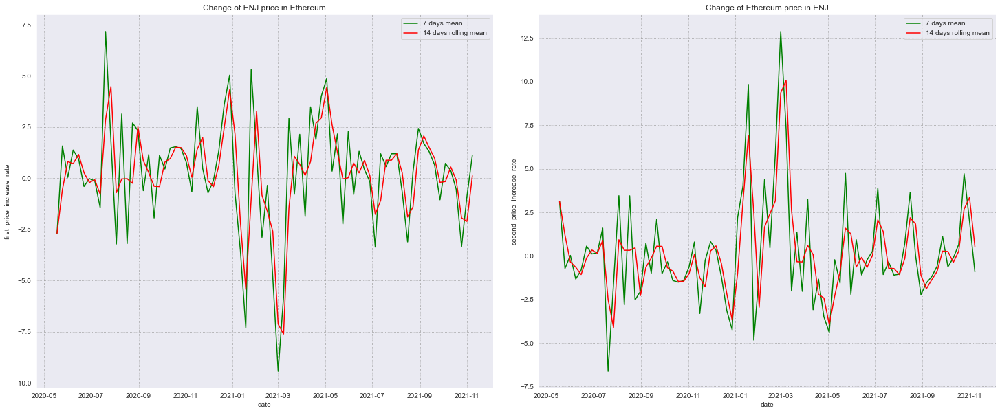

In [233]:
increase_rate_moving_averages(enj_eth_reserves_df, 'Change of ENJ price in Ethereum', 'Change of Ethereum price in ENJ', x_size=25, y_size=10)

## SAND/WETH

In [173]:
sand_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\sand_weth_swaps.pkl')
sand_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\sand_weth_mints.pkl")
sand_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\sand_weth_burns.pkl")
sand_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\sand_weth_reserves.pkl")

### Plotting swapping in moving averages

In [174]:
sand_weth_df = get_df_with_swap_prices_and_change_rates(sand_weth_df, 'SAND', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


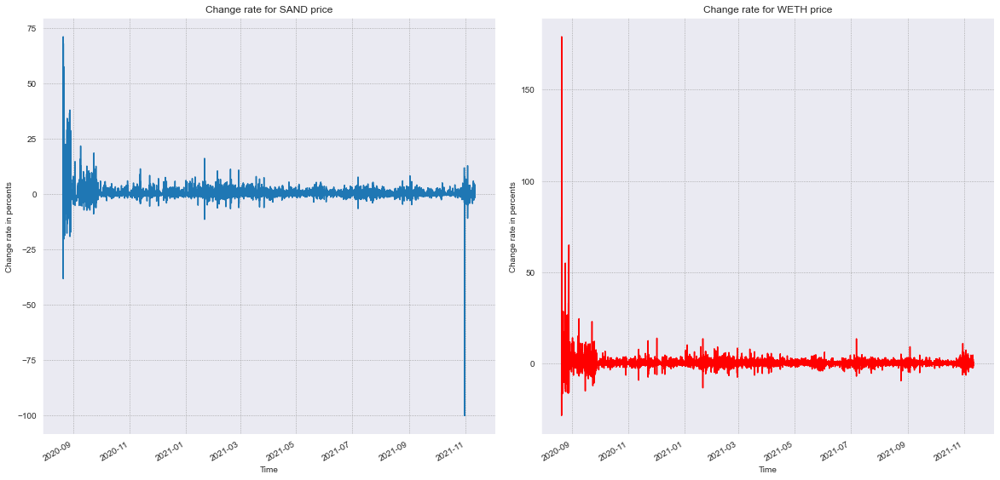

In [175]:
pyplot_line_swap_change_rate(sand_weth_df, 'SAND', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

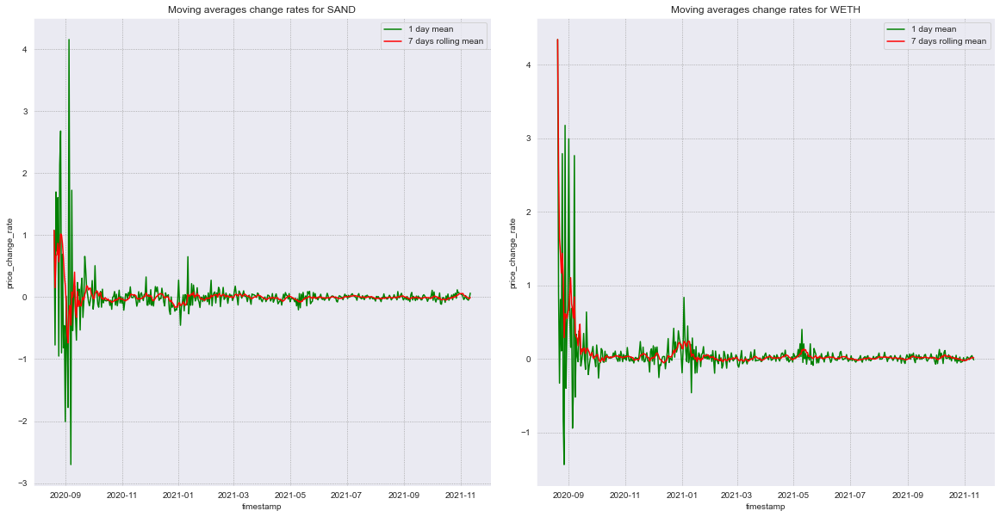

In [176]:
swaps_price_increase_rates_moving_averages(sand_weth_df, 'SAND', 'WETH', 'Moving averages change rates for SAND',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

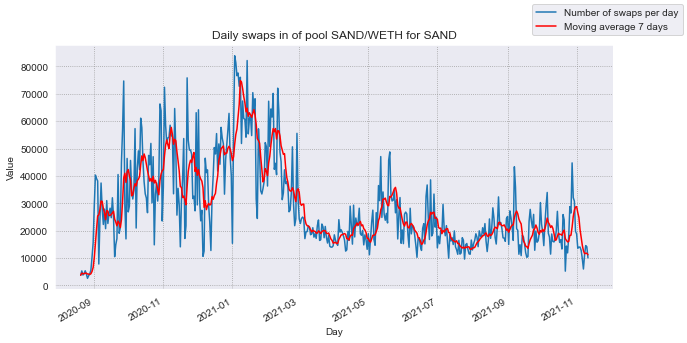

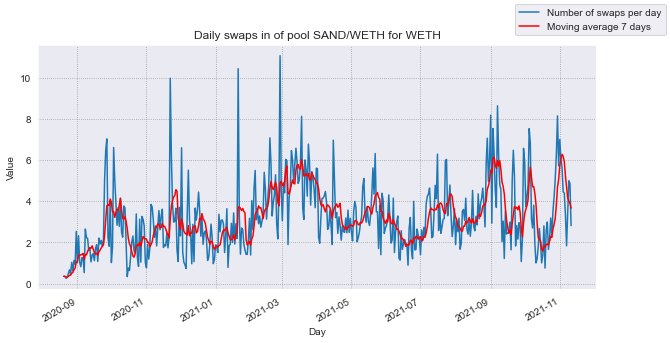

In [222]:
show_swaps_amount_in_moving_averages(swaps_df=sand_weth_df[(sand_weth_df.token_in == 'SAND')], pool_name="SAND/WETH for SAND")
show_swaps_amount_in_moving_averages(swaps_df=sand_weth_df[(sand_weth_df.token_in == 'WETH')], pool_name="SAND/WETH for WETH")

### Swapping values histograms

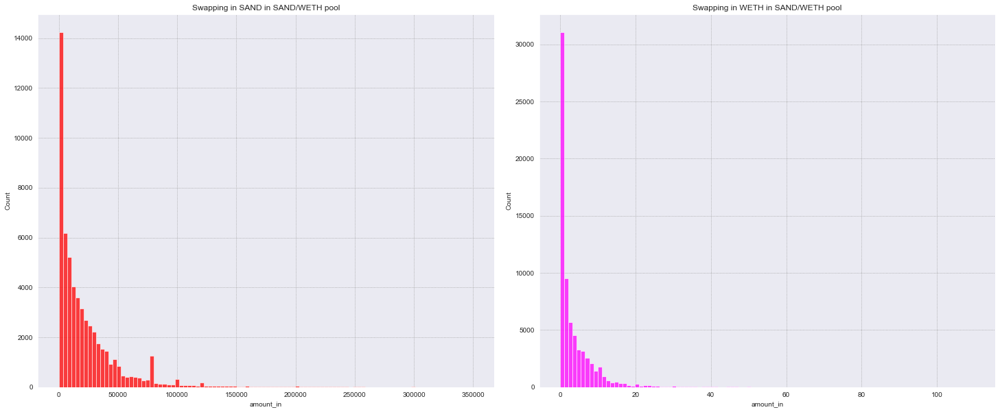

In [223]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=sand_weth_df[sand_weth_df.token_in == 'SAND'], x='amount_in', bins=100, color='red', binrange=[0, 350000]).set_title("Swapping in SAND in SAND/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=sand_weth_df[sand_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 110]).set_title("Swapping in WETH in SAND/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

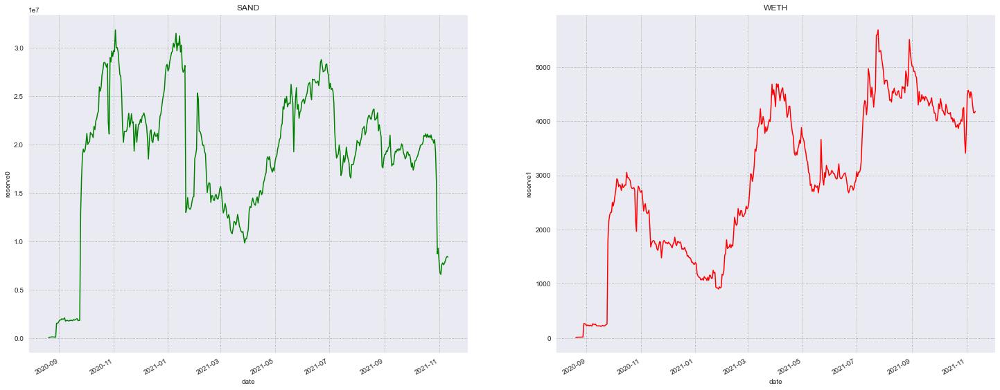

In [224]:
show_swaps_reserves_evolution_through_time(sand_weth_reserves_df, first_token_reserve_name="SAND", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

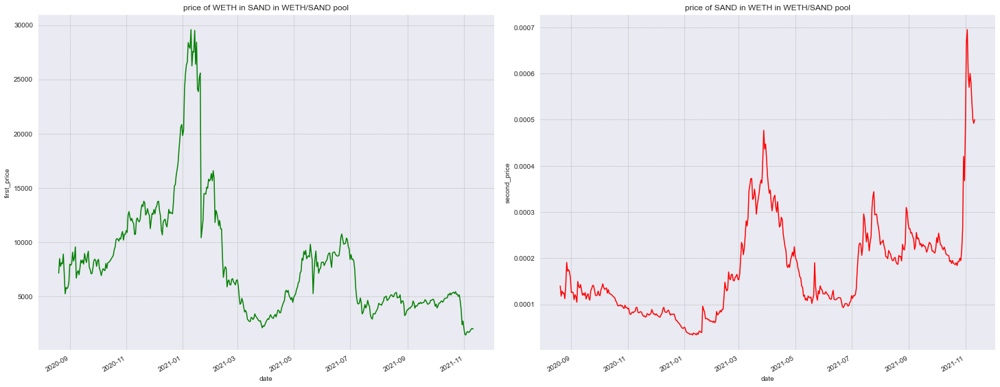

In [225]:
show_pool_price_evolution_from_reserves(sand_weth_reserves_df, first_token_price_name="price of WETH in SAND in WETH/SAND pool", 
                                        second_token_price_name="price of SAND in WETH in WETH/SAND pool", x=25, y=10, wspace=0.1)

In [101]:
sand_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,4.620900e+04,6.473900,5.360654e+03,1.362405e+05,24.472452,2020-08-20,7137.737269,0.000140,-15.877232,18.873881
1,8.011954e+04,9.442597,7.270852e+03,1.862165e+05,26.147471,2020-08-21,8484.905341,0.000118,9.351362,-8.551665
2,8.079633e+04,10.412832,8.245477e+03,7.209562e+04,9.277340,2020-08-22,7759.304691,0.000129,-4.097429,4.272491
3,1.145013e+05,14.152003,1.110878e+04,5.906999e+04,7.473852,2020-08-23,8090.820310,0.000124,1.187059,-1.173133
4,1.199340e+05,14.999432,1.218586e+04,1.398868e+05,20.077351,2020-08-24,7995.904214,0.000125,-10.113940,11.251956
...,...,...,...,...,...,...,...,...,...,...
444,7.709895e+06,4469.703849,4.115774e+07,1.839318e+06,1066.257574,2021-11-07,1724.922907,0.000580,-7.450355,8.050117
445,7.988303e+06,4286.073315,4.118310e+07,3.775639e+06,2023.569226,2021-11-08,1863.781223,0.000537,-6.674564,7.151923
446,8.304657e+06,4158.405242,3.939862e+07,3.644201e+06,1870.775753,2021-11-09,1997.077430,0.000501,-1.752135,1.783382
447,8.435944e+06,4150.132166,3.836007e+07,4.702694e+06,2445.618720,2021-11-10,2032.692947,0.000492,1.682203,-1.654373


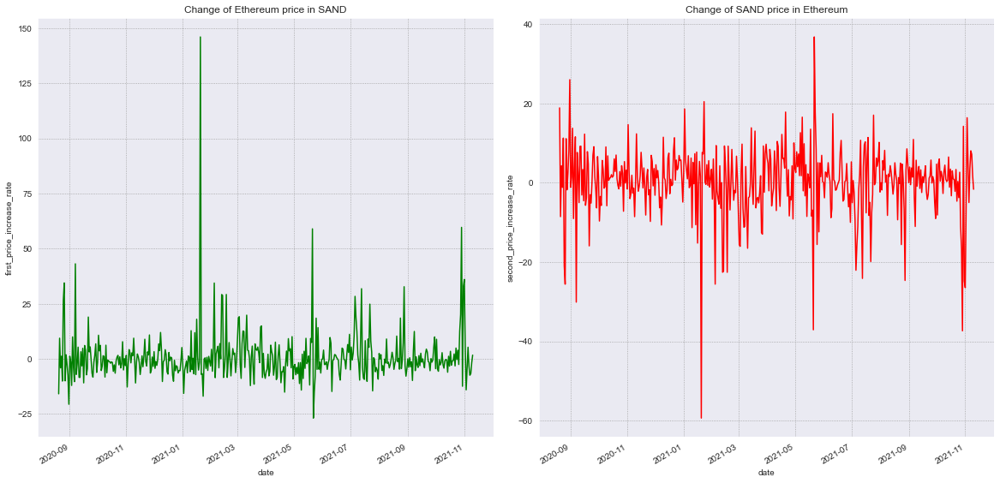

In [226]:
calc_price_and_increase_rates(sand_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=sand_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in SAND')
plt.subplot(1, 2, 2)
sns.lineplot(data=sand_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of SAND price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

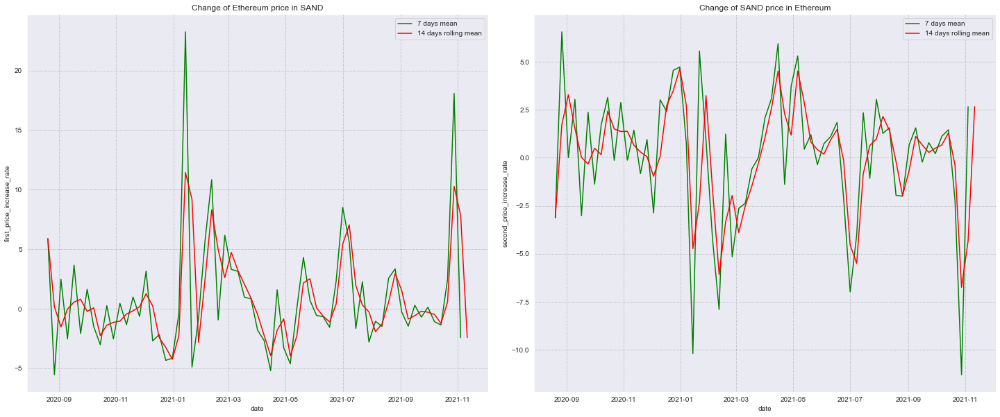

In [227]:
increase_rate_moving_averages(sand_weth_reserves_df, 'Change of Ethereum price in SAND', 'Change of SAND price in Ethereum', x_size=25, y_size=10)

## ALICE/ETH

In [177]:
alice_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\alice_weth_swaps.pkl')
alice_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\alice_weth_mints.pkl")
alice_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\alice_weth_burns.pkl")
alice_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\alice_weth_reserves.pkl")

### Plotting swapping in moving averages

In [178]:
alice_weth_df = get_df_with_swap_prices_and_change_rates(alice_weth_df, 'ALICE', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


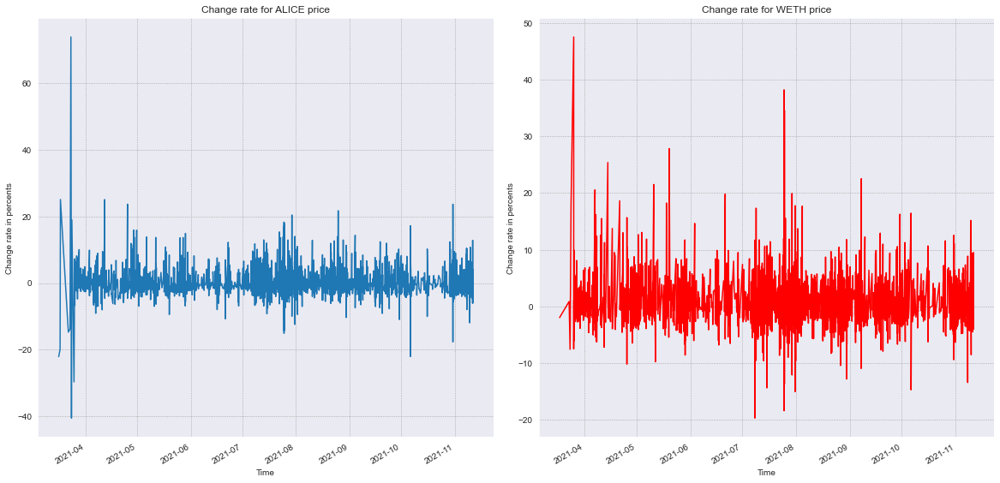

In [179]:
pyplot_line_swap_change_rate(alice_weth_df, 'ALICE', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

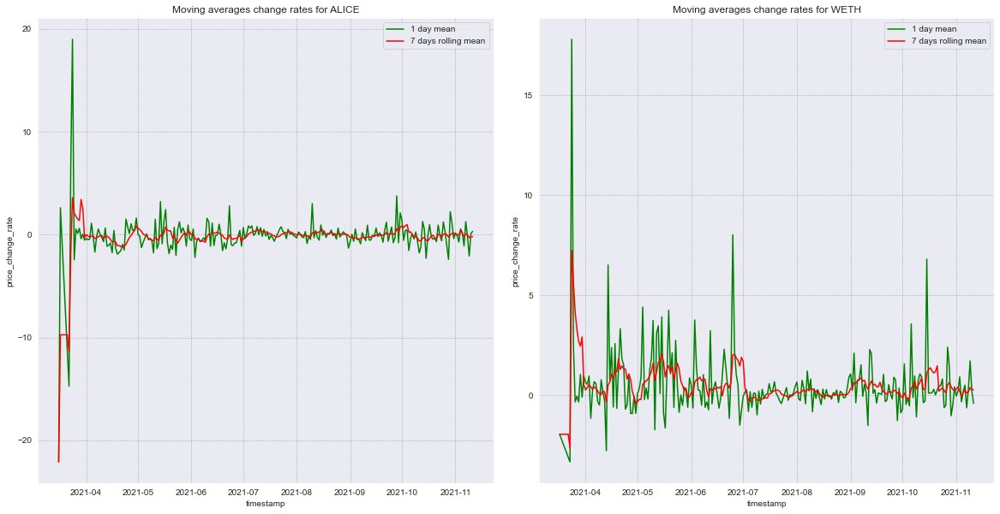

In [180]:
swaps_price_increase_rates_moving_averages(alice_weth_df, 'ALICE', 'WETH', 'Moving averages change rates for ALICE',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

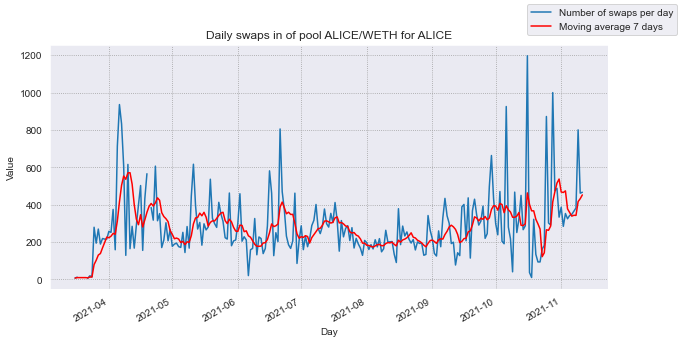

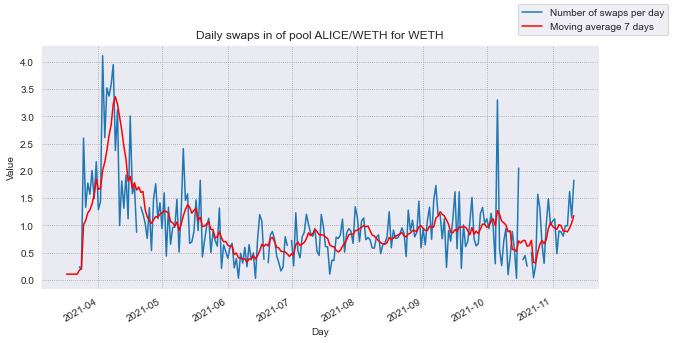

In [216]:
show_swaps_amount_in_moving_averages(swaps_df=alice_weth_df[(alice_weth_df.token_in == 'ALICE')], pool_name="ALICE/WETH for ALICE")
show_swaps_amount_in_moving_averages(swaps_df=alice_weth_df[(alice_weth_df.token_in == 'WETH')], pool_name="ALICE/WETH for WETH")

### Swapping values histograms

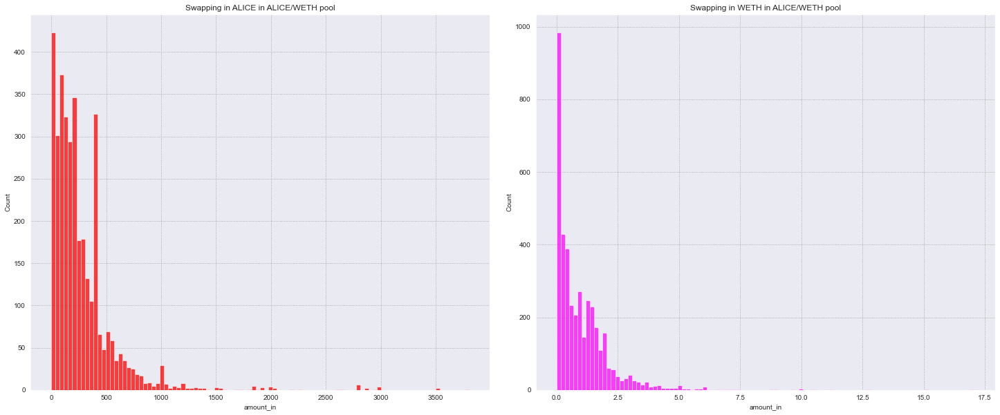

In [217]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=alice_weth_df[alice_weth_df.token_in == 'ALICE'], x='amount_in', bins=100, color='red').set_title("Swapping in ALICE in ALICE/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=alice_weth_df[alice_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta').set_title("Swapping in WETH in ALICE/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

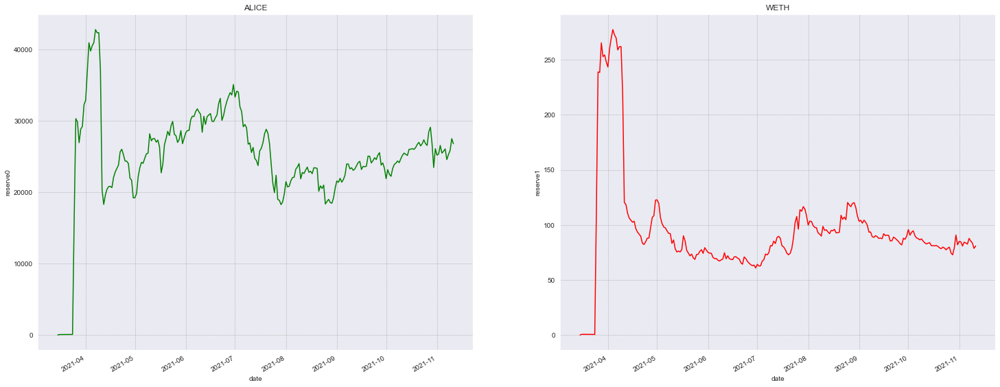

In [218]:
show_swaps_reserves_evolution_through_time(alice_weth_reserves_df, first_token_reserve_name="ALICE", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

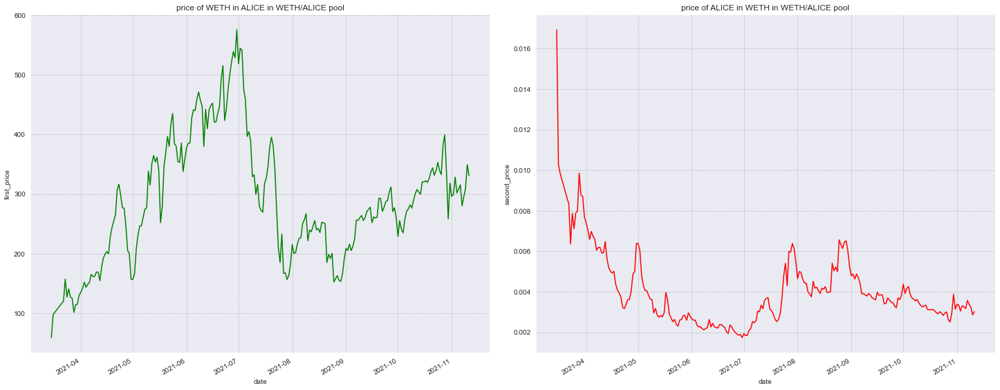

In [219]:
show_pool_price_evolution_from_reserves(alice_weth_reserves_df, first_token_price_name="price of WETH in ALICE in WETH/ALICE pool", 
                                        second_token_price_name="price of ALICE in WETH in WETH/ALICE pool", x=25, y=10, wspace=0.1)

In [106]:
alice_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,6.000000,0.101598,367.355029,0.000000,0.000000,2021-03-15,59.056221,0.016933,-39.297501,64.737864
1,67.100212,0.689707,2430.779070,14.839028,0.195232,2021-03-16,97.287957,0.010279,-4.248471,4.436975
2,68.634374,0.675505,2232.418760,46.915728,0.438203,2021-03-17,101.604599,0.009842,-15.411696,18.219653
3,74.634374,0.621349,2098.103332,6.000000,0.054155,2021-03-22,120.116605,0.008325,-23.600360,30.890669
4,85.550512,0.544140,1817.052880,106.134748,1.034504,2021-03-23,157.221427,0.006360,23.818017,-19.236310
...,...,...,...,...,...,...,...,...,...,...
232,24564.998908,87.756435,809922.648413,10989.471179,38.542690,2021-11-07,279.922481,0.003572,-5.349822,5.652204
233,25269.449095,85.443579,814698.938656,13069.776295,45.963698,2021-11-08,295.744272,0.003381,-4.267745,4.458001
234,25843.637657,83.655710,798216.894229,12234.169168,37.421361,2021-11-09,308.928555,0.003237,-11.563325,13.075259
235,27501.138208,78.727239,726965.361910,13115.328077,39.128551,2021-11-10,349.321764,0.002863,5.572285,-5.278170


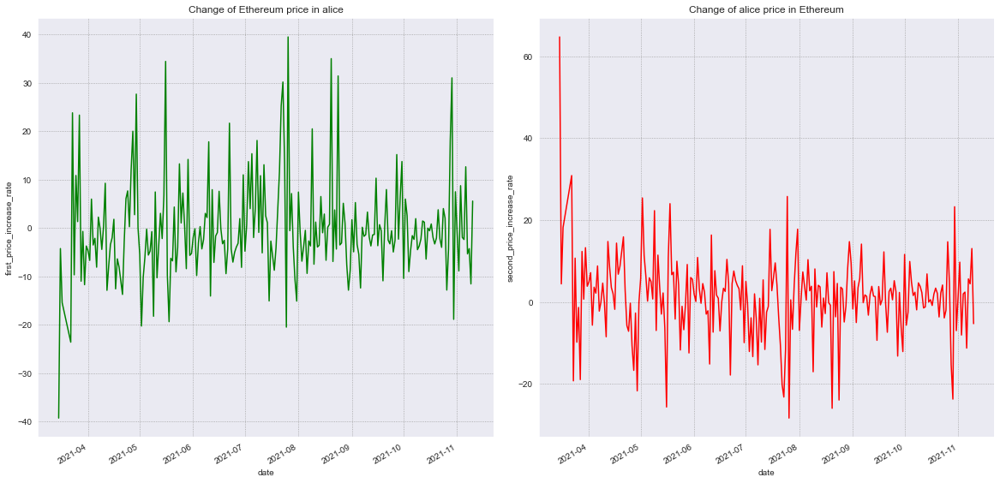

In [220]:
calc_price_and_increase_rates(alice_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=alice_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in alice')
plt.subplot(1, 2, 2)
sns.lineplot(data=alice_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of alice price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

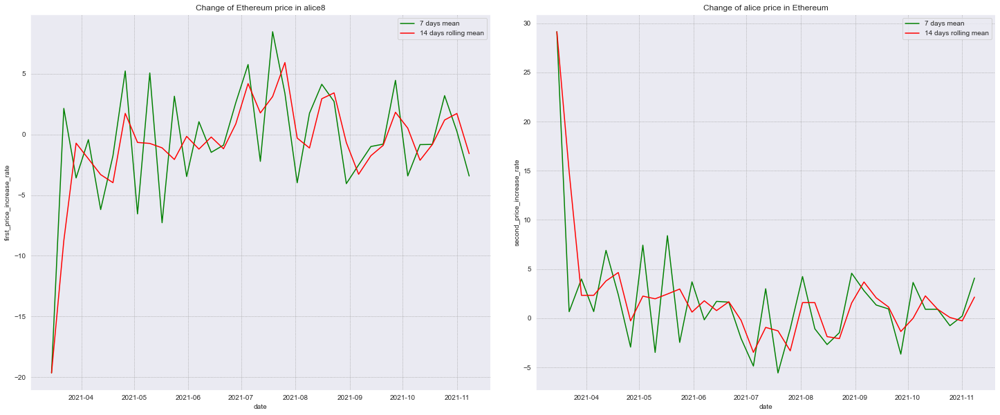

In [221]:
increase_rate_moving_averages(alice_weth_reserves_df, 'Change of Ethereum price in alice8', 'Change of alice price in Ethereum', x_size=25, y_size=10)

## DOGE/ETH

In [181]:
doge_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\doge_weth_swaps.pkl')
doge_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\doge_weth_mints.pkl")
doge_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\doge_weth_burns.pkl")
doge_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\doge_weth_reserves.pkl")

### Plotting swapping in moving averages

In [182]:
doge_weth_df = get_df_with_swap_prices_and_change_rates(doge_weth_df, 'DOGE', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


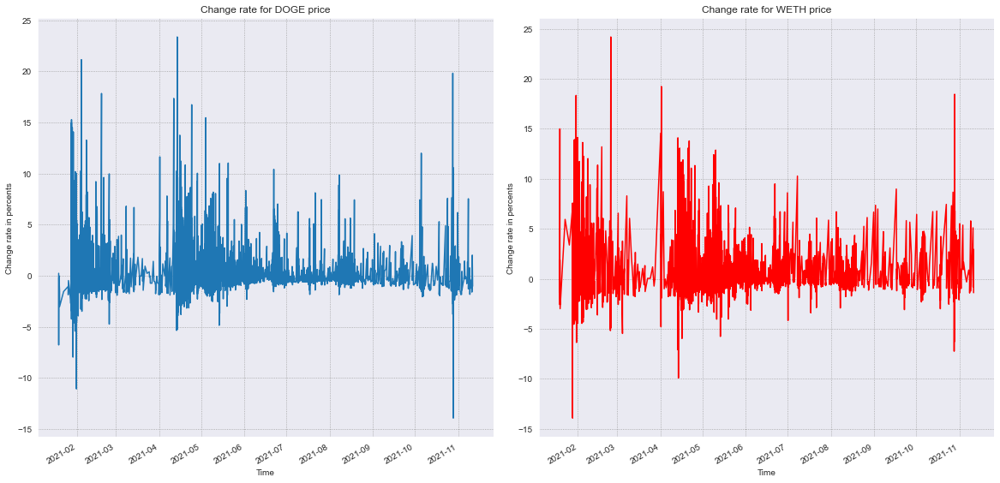

In [183]:
pyplot_line_swap_change_rate(doge_weth_df, 'DOGE', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

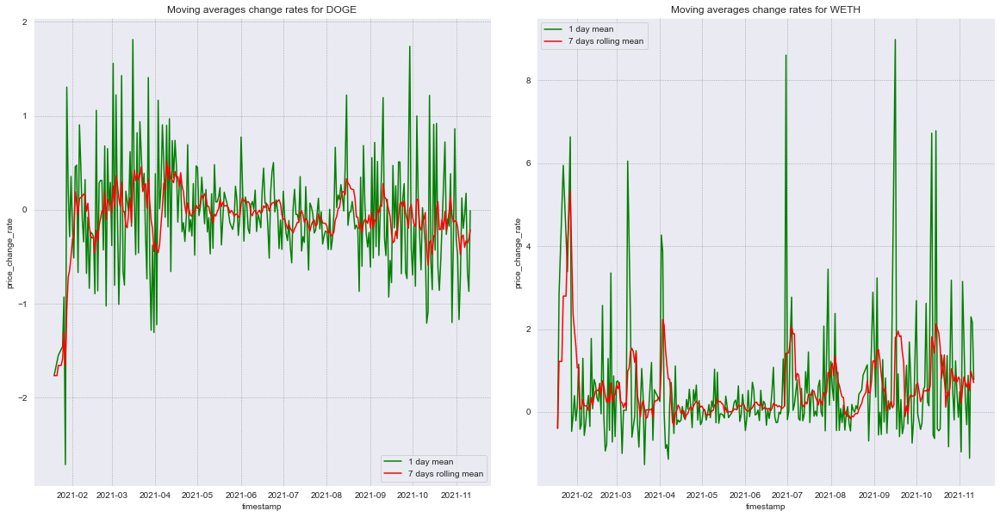

In [184]:
swaps_price_increase_rates_moving_averages(doge_weth_df, 'DOGE', 'WETH', 'Moving averages change rates for DOGE',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

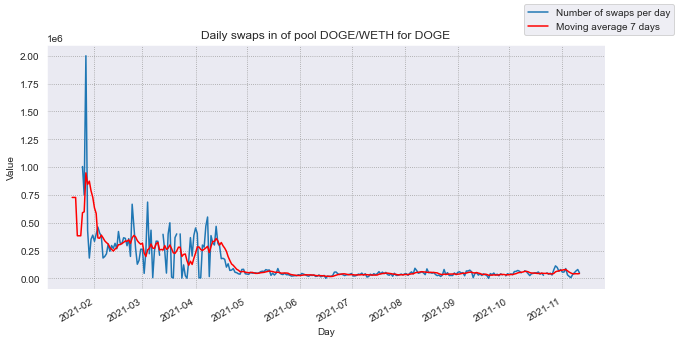

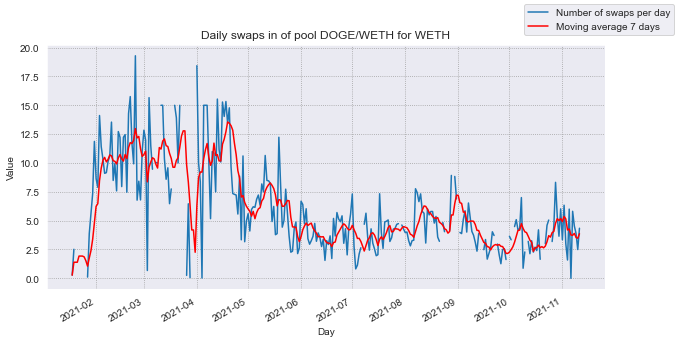

In [210]:
show_swaps_amount_in_moving_averages(swaps_df=doge_weth_df[(doge_weth_df.token_in == 'DOGE')], pool_name="DOGE/WETH for DOGE")
show_swaps_amount_in_moving_averages(swaps_df=doge_weth_df[(doge_weth_df.token_in == 'WETH')], pool_name="DOGE/WETH for WETH")

### Swapping values histograms

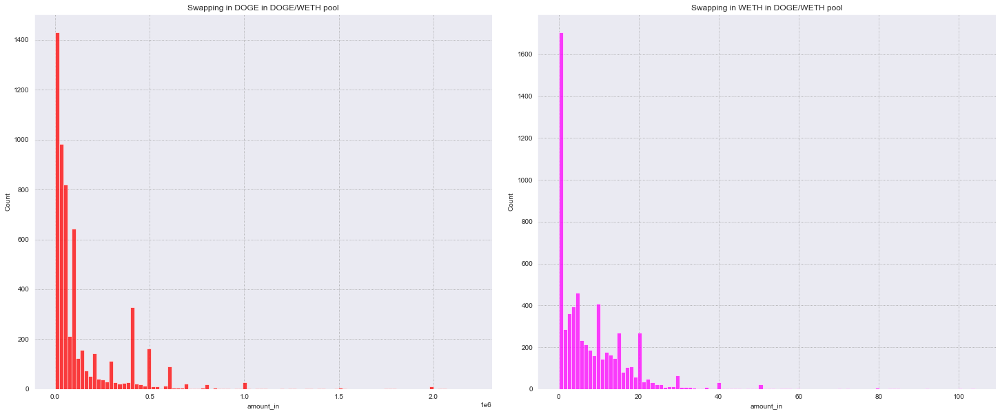

In [211]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=doge_weth_df[doge_weth_df.token_in == 'DOGE'], x='amount_in', bins=100, color='red', binrange=[0, 2200000]).set_title("Swapping in DOGE in DOGE/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=doge_weth_df[doge_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta').set_title("Swapping in WETH in DOGE/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

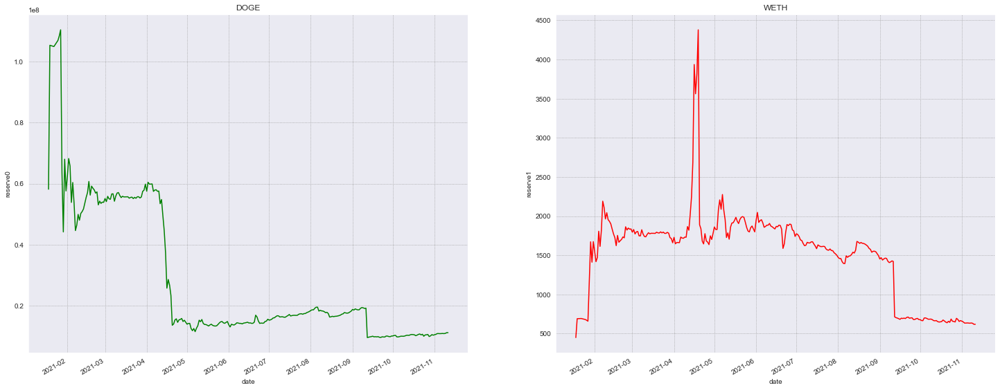

In [212]:
show_swaps_reserves_evolution_through_time(doge_weth_reserves_df, first_token_reserve_name="DOGE", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

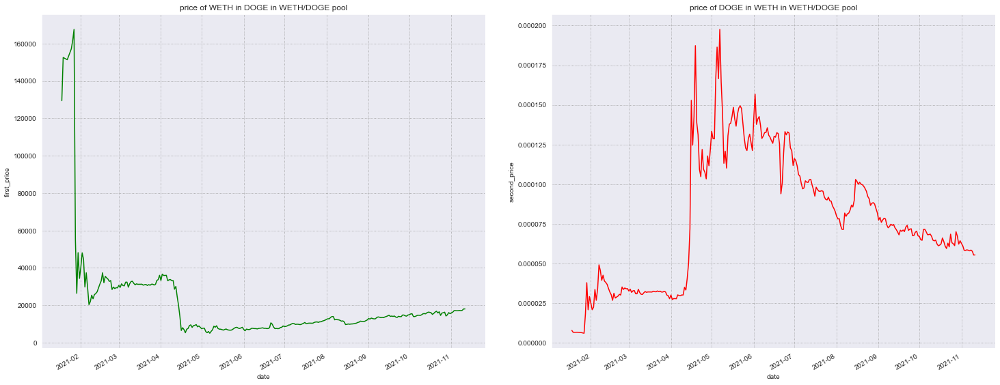

In [213]:
show_pool_price_evolution_from_reserves(doge_weth_reserves_df, first_token_price_name="price of WETH in DOGE in WETH/DOGE pool", 
                                        second_token_price_name="price of DOGE in WETH in WETH/DOGE pool", x=25, y=10, wspace=0.15)

In [112]:
doge_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,5.815876e+07,449.362514,1.117025e+06,1.796070e+05,1.374850,2021-01-18,129425.031923,0.000008,-15.148965,17.853601
1,1.053052e+08,690.380932,1.924844e+06,8.014429e+06,56.096709,2021-01-19,152532.060272,0.000007,0.795925,-0.789640
2,1.048894e+08,693.127828,1.756477e+06,4.933253e+05,3.253104,2021-01-22,151327.605393,0.000007,-3.701717,3.844012
3,1.068894e+08,680.197323,1.847699e+06,2.020000e+06,13.058171,2021-01-25,157144.656179,0.000006,-2.744597,2.822051
4,1.083894e+08,670.812012,1.807903e+06,1.500000e+06,9.385311,2021-01-26,161579.358327,0.000006,-3.553822,3.684772
...,...,...,...,...,...,...,...,...,...,...
289,1.092428e+07,632.966905,5.827256e+06,2.376571e+05,13.770956,2021-11-07,17258.844808,0.000058,0.827729,-0.820933
290,1.088065e+07,635.657490,6.075537e+06,8.608951e+05,51.732961,2021-11-08,17117.161172,0.000058,-1.274903,1.291366
291,1.095118e+07,631.621488,6.072999e+06,3.327703e+05,19.589827,2021-11-09,17338.206428,0.000058,-4.120963,4.298085
292,1.118467e+07,618.504353,5.635877e+06,4.091358e+05,23.099808,2021-11-10,18083.417290,0.000055,0.118388,-0.118248


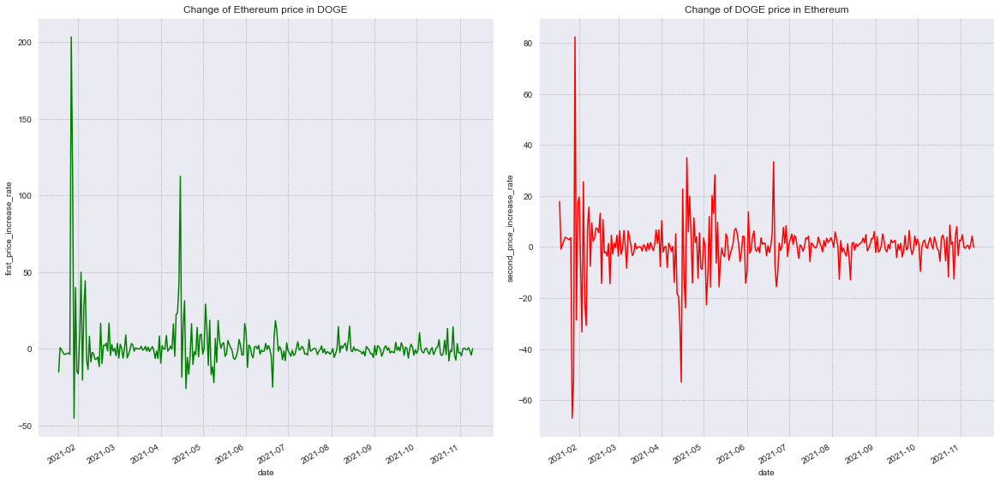

In [214]:
calc_price_and_increase_rates(doge_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=doge_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in DOGE')
plt.subplot(1, 2, 2)
sns.lineplot(data=doge_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of DOGE price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

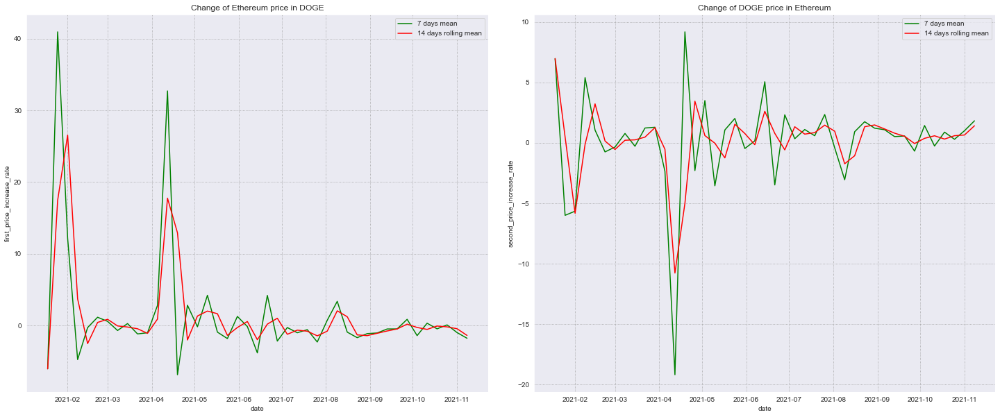

In [215]:
increase_rate_moving_averages(doge_weth_reserves_df, 'Change of Ethereum price in DOGE', 'Change of DOGE price in Ethereum', x_size=25, y_size=10)

## ELON/ETH

In [185]:
elon_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\elon_weth_swaps.pkl')
elon_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\elon_weth_mints.pkl")
elon_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\elon_weth_burns.pkl")
elon_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\elon_weth_reserves.pkl")

### Plotting swapping in moving averages

In [186]:
elon_weth_df = get_df_with_swap_prices_and_change_rates(elon_weth_df, 'ELON', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


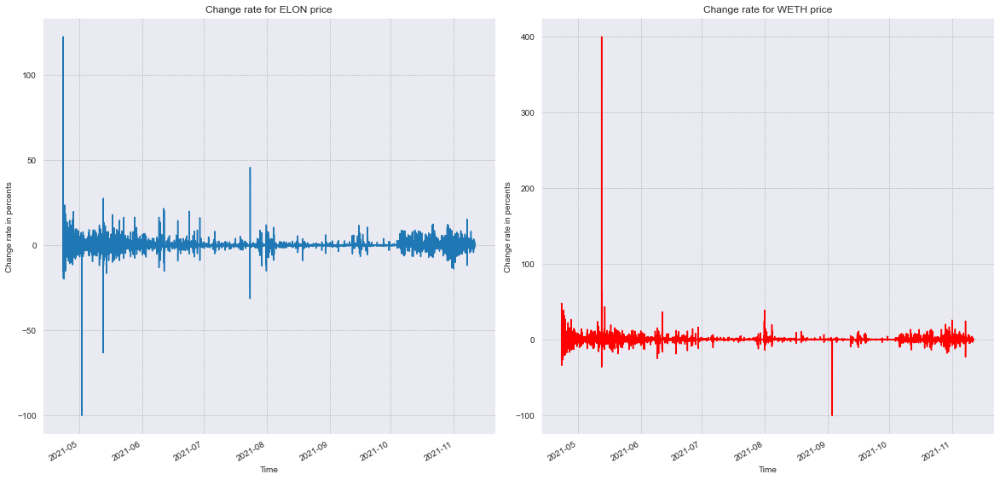

In [195]:
pyplot_line_swap_change_rate(elon_weth_df[elon_weth_df.price_change_rate < 2000], 'ELON', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

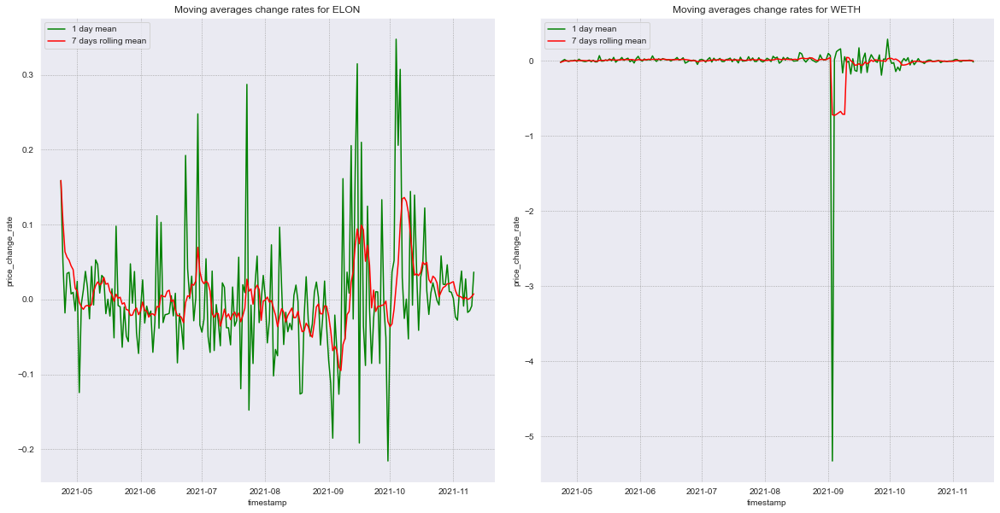

In [196]:
swaps_price_increase_rates_moving_averages(elon_weth_df[elon_weth_df.price_change_rate < 2000], 'ELON', 'WETH', 'Moving averages change rates for ELON',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

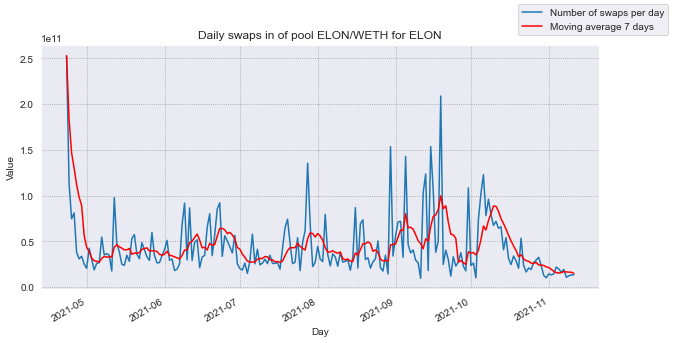

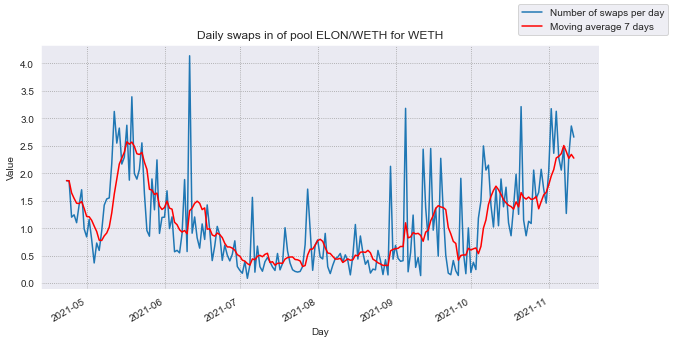

In [197]:
show_swaps_amount_in_moving_averages(swaps_df=elon_weth_df[(elon_weth_df.token_in == 'ELON')], pool_name="ELON/WETH for ELON")
show_swaps_amount_in_moving_averages(swaps_df=elon_weth_df[(elon_weth_df.token_in == 'WETH')], pool_name="ELON/WETH for WETH")

### Swapping values histograms

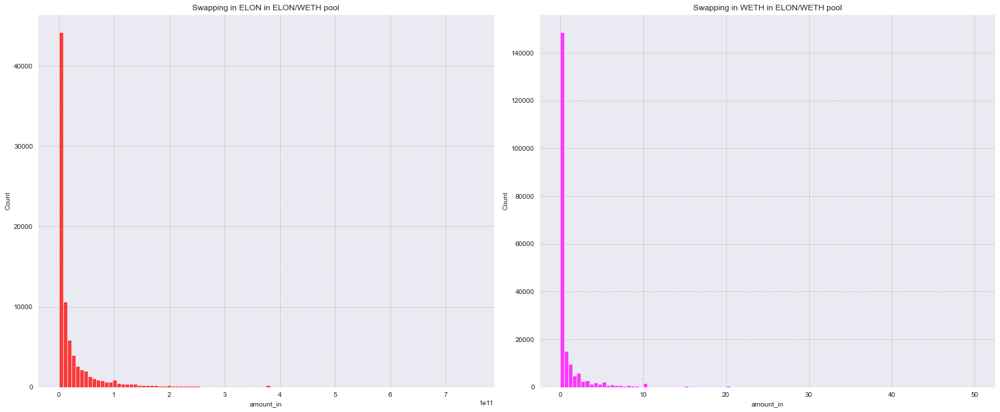

In [198]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=elon_weth_df[elon_weth_df.token_in == 'ELON'], x='amount_in', bins=100, color='red', binrange=[0, 750000000000]).set_title("Swapping in ELON in ELON/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=elon_weth_df[elon_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 50]).set_title("Swapping in WETH in ELON/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

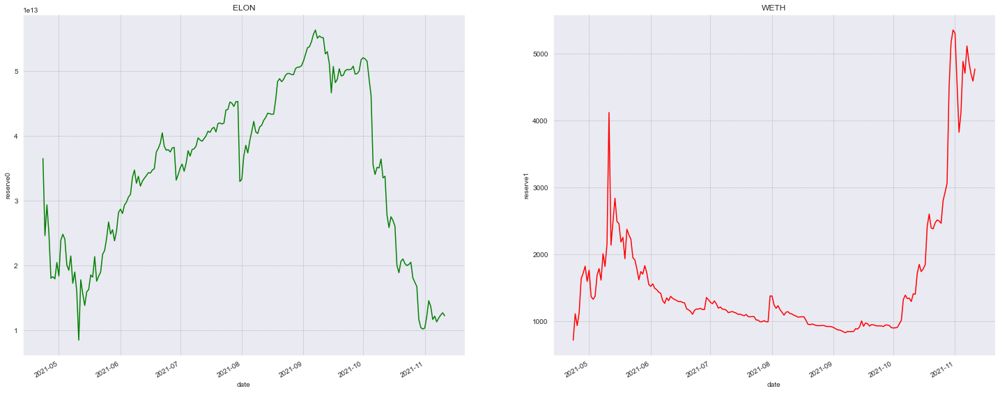

In [199]:
show_swaps_reserves_evolution_through_time(elon_weth_reserves_df, first_token_reserve_name="ELON", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

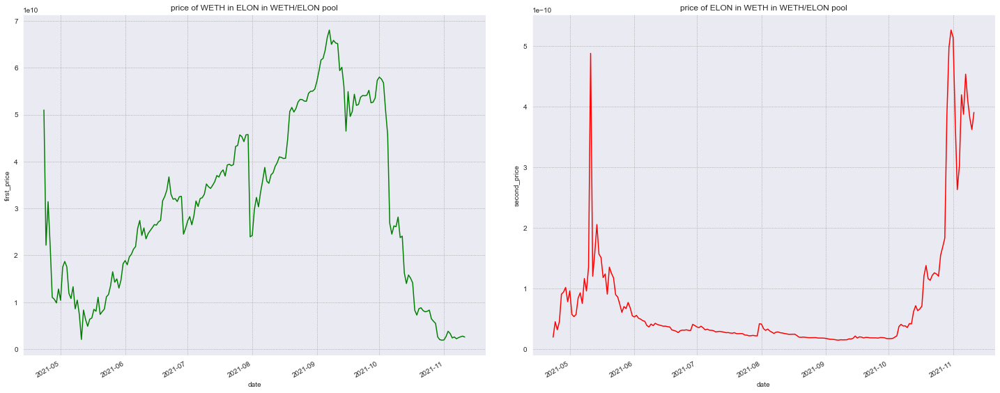

In [200]:
show_pool_price_evolution_from_reserves(elon_weth_reserves_df, first_token_price_name="price of WETH in ELON in WETH/ELON pool", 
                                        second_token_price_name="price of ELON in WETH in WETH/ELON pool", x=25, y=10, wspace=0.1)

In [117]:
elon_weth_reserves_df

,reserve0,reserve1,reserveUSD,dailyVolumeToken0,dailyVolumeToken1,date,first_price,second_price,first_price_increase_rate,second_price_increase_rate
0,3.650502e+13,715.602627,3.385606e+06,2.729964e+15,41193.755814,2021-04-23,5.101298e+10,1.960285e-11,130.243467,-56.567715
1,2.459976e+13,1110.292501,4.916181e+06,5.911238e+14,22876.541746,2021-04-24,2.215610e+10,4.513429e-11,-29.543513,41.931572
2,2.935363e+13,933.446347,4.311324e+06,1.858092e+14,6450.296998,2021-04-25,3.144651e+10,3.180003e-11,42.282910,-29.717490
3,2.492029e+13,1127.543829,5.708305e+06,2.802904e+14,12044.298435,2021-04-26,2.210139e+10,4.524601e-11,100.279132,-50.069686
4,1.801824e+13,1632.782457,8.678267e+06,1.908413e+14,13764.348242,2021-04-27,1.103530e+10,9.061832e-11,3.758072,-3.621956
...,...,...,...,...,...,...,...,...,...,...
198,1.128041e+13,5113.576467,4.708419e+07,3.279026e+13,14488.690623,2021-11-07,2.205973e+09,4.533147e-10,-9.444784,10.429862
199,1.187093e+13,4873.017955,4.682281e+07,1.107740e+13,4677.153491,2021-11-08,2.436053e+09,4.105001e-10,-7.151805,7.702686
200,1.233480e+13,4701.308475,4.453359e+07,1.016520e+13,3846.178431,2021-11-09,2.623695e+09,3.811419e-10,-5.018544,5.283710
201,1.267539e+13,4588.670503,4.241485e+07,1.286510e+13,4489.571770,2021-11-10,2.762323e+09,3.620141e-10,7.812124,-7.246054


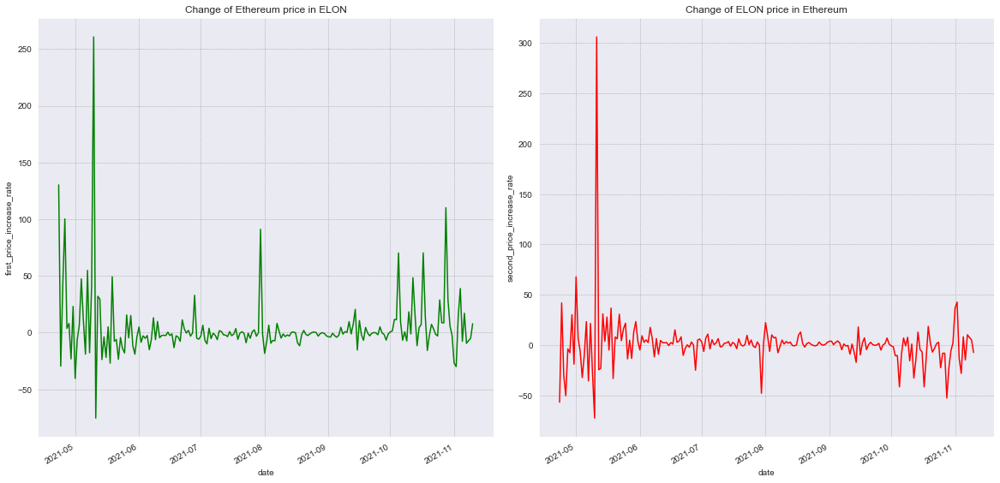

In [201]:
calc_price_and_increase_rates(elon_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=elon_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in ELON')
plt.subplot(1, 2, 2)
sns.lineplot(data=elon_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of ELON price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

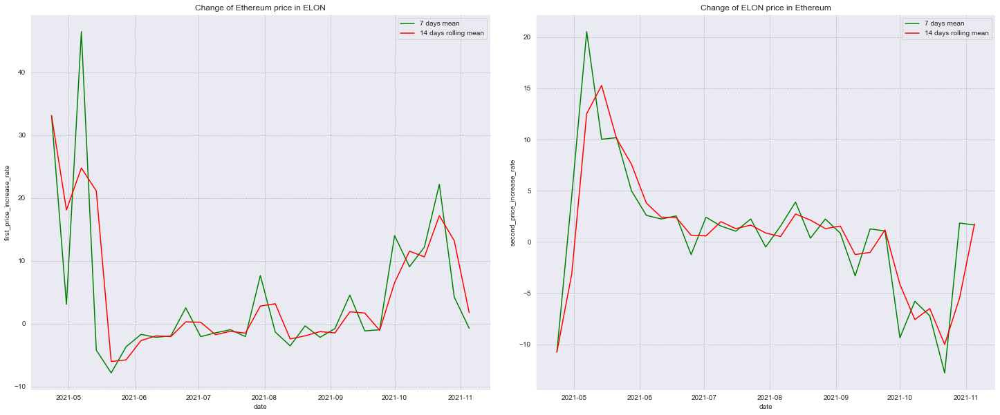

In [202]:
increase_rate_moving_averages(elon_weth_reserves_df, 'Change of Ethereum price in ELON', 'Change of ELON price in Ethereum', x_size=25, y_size=10)

## SHIB/ETH

In [189]:
shib_weth_df = pd.read_pickle(os.getcwd() + '\\pkl_stories\\shib_weth_swaps.pkl')
shib_weth_mints_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\shib_weth_mints.pkl")
shib_weth_burns_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\shib_weth_burns.pkl")
shib_weth_reserves_df = pd.read_pickle(os.getcwd() + "\\pkl_stories\\shib_weth_reserves.pkl")

### Plotting swapping in moving averages

In [190]:
shib_weth_df = get_df_with_swap_prices_and_change_rates(shib_weth_df, 'SHIB', 'WETH')

C:\Users\Zbook\anaconda3\lib\site-packages\pandas\core\generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


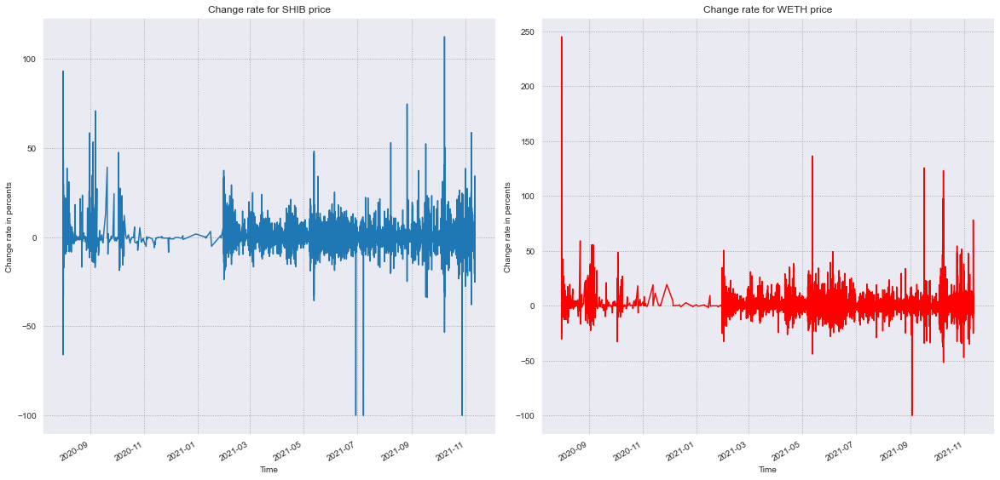

In [193]:
pyplot_line_swap_change_rate(shib_weth_df[shib_weth_df.price_change_rate < 2000], 'SHIB', 'WETH', xsize=20, ysize=10, wspace=0.1, hspace=0.1)

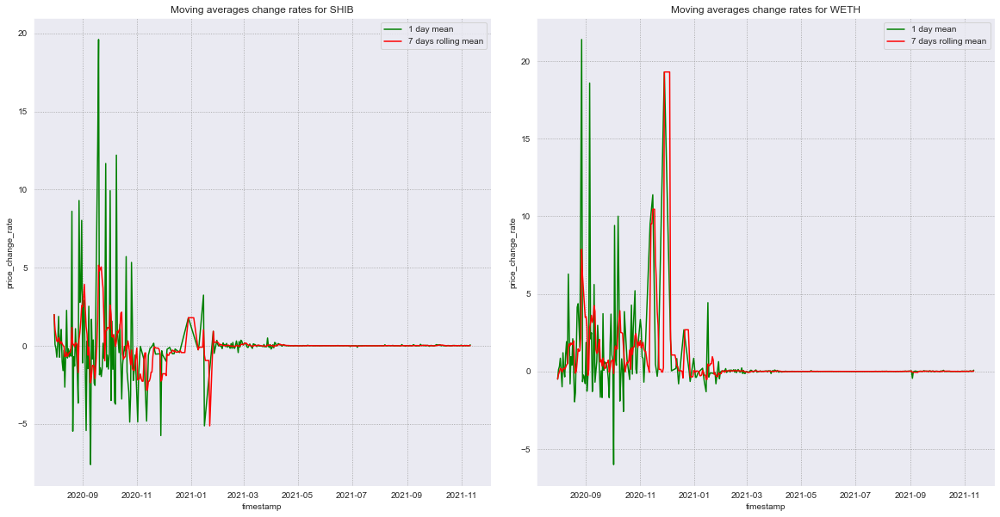

In [194]:
swaps_price_increase_rates_moving_averages(shib_weth_df[shib_weth_df.price_change_rate < 2000], 'SHIB', 'WETH', 'Moving averages change rates for SHIB',
                                           'Moving averages change rates for WETH', x_size=20, y_size=10, wspace=0.1, hspace=0.1)

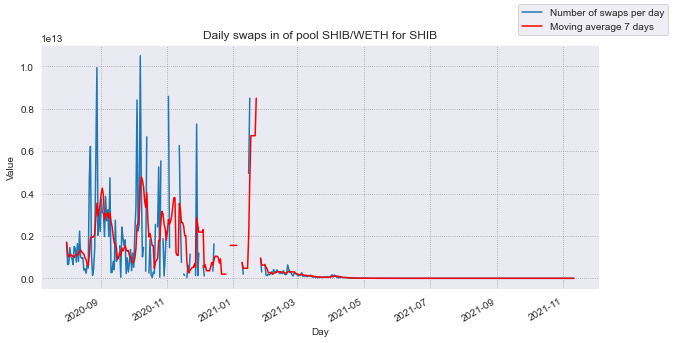

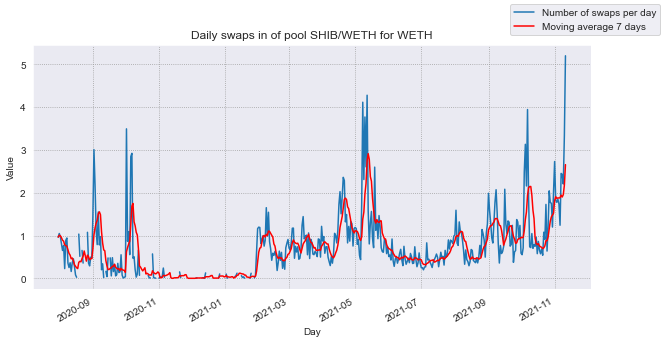

In [203]:
show_swaps_amount_in_moving_averages(swaps_df=shib_weth_df[(shib_weth_df.token_in == 'SHIB')], pool_name="SHIB/WETH for SHIB")
show_swaps_amount_in_moving_averages(swaps_df=shib_weth_df[(shib_weth_df.token_in == 'WETH')], pool_name="SHIB/WETH for WETH")

### Swapping values histograms

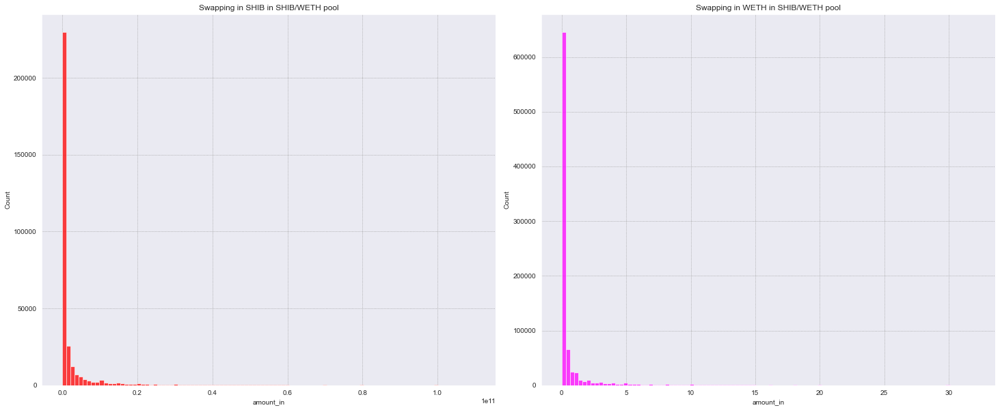

In [204]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 2, 1)
sns.histplot(data=shib_weth_df[shib_weth_df.token_in == 'SHIB'], x='amount_in', bins=100, color='red', binrange=[0, 110000000000]).set_title("Swapping in SHIB in SHIB/WETH pool")
plt.subplot(1, 2, 2)
sns.histplot(data=shib_weth_df[shib_weth_df.token_in == 'WETH'], x='amount_in', bins=100, color='magenta', binrange=[0, 32]).set_title("Swapping in WETH in SHIB/WETH pool")

plt.subplots_adjust(wspace=0.1)
plt.show()

### Plotting pool reserves

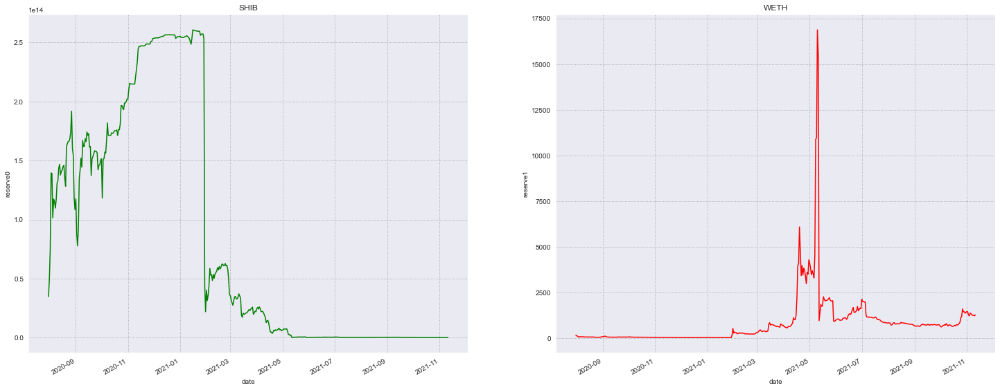

In [205]:
show_swaps_reserves_evolution_through_time(shib_weth_reserves_df, first_token_reserve_name="SHIB", second_token_reserve_name="WETH", x=25, y=10)

### Plotting pool price

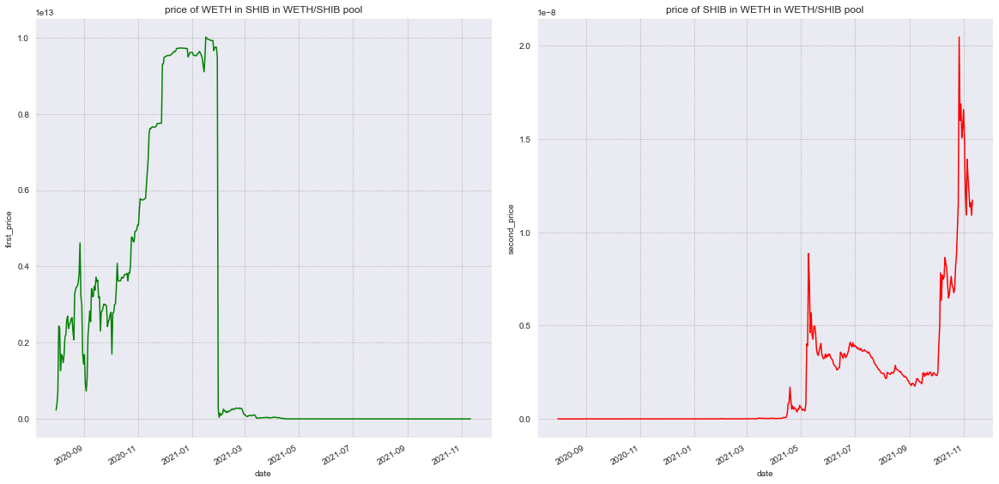

In [206]:
show_pool_price_evolution_from_reserves(shib_weth_reserves_df, first_token_price_name="price of WETH in SHIB in WETH/SHIB pool", 
                                        second_token_price_name="price of SHIB in WETH in WETH/SHIB pool", x=20, y=10, wspace=0.1)

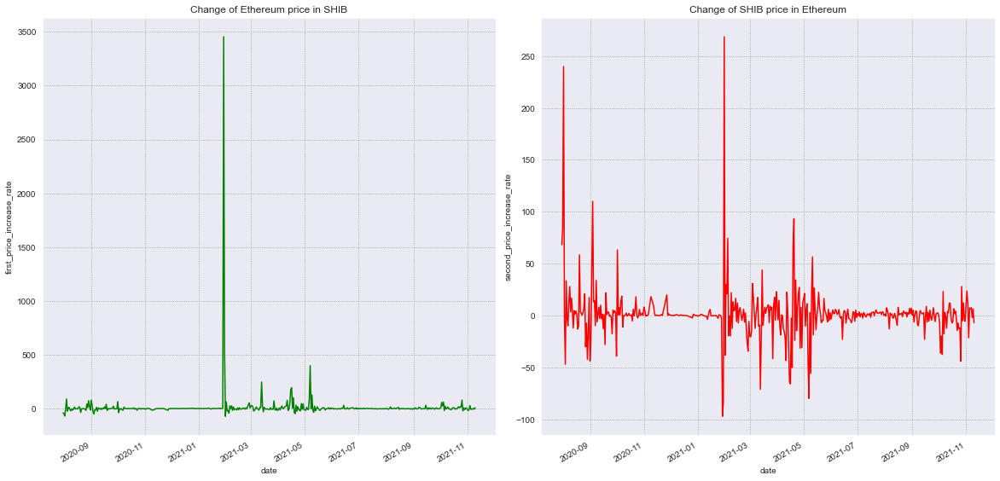

In [207]:
calc_price_and_increase_rates(shib_weth_reserves_df)

fig = plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
sns.lineplot(data=shib_weth_reserves_df, x='date', y='first_price_increase_rate', color='green').set_title('Change of Ethereum price in SHIB')
plt.subplot(1, 2, 2)
sns.lineplot(data=shib_weth_reserves_df, x='date', y='second_price_increase_rate', color='red').set_title('Change of SHIB price in Ethereum')

fig.autofmt_xdate()
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

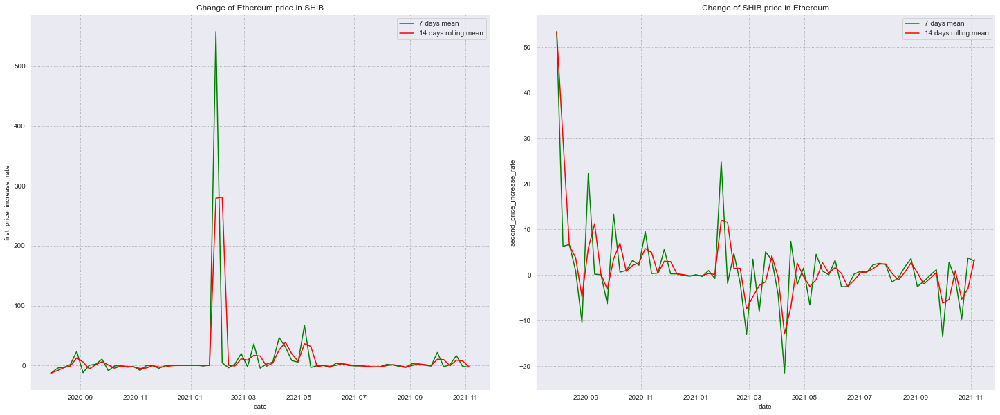

In [208]:
increase_rate_moving_averages(shib_weth_reserves_df, 'Change of Ethereum price in SHIB', 'Change of SHIB price in Ethereum', x_size=25, y_size=10)